In [1]:
import pathlib

import numpy as np
import pandas as pd
import xarray as xr
from scipy import ndimage as ndi
from scipy.stats import binned_statistic, binned_statistic_2d, circmean, circstd
import pyproj

from datetime import datetime, timedelta
from dateutil.parser import parse as parse_date

from tobac_flow.plotting import goes_figure, add_gl_ticks
from tobac_flow.analysis import apply_func_to_labels
from tobac_flow.abi import get_abi_rgb, get_abi_pixel_lengths, get_abi_lat_lon, get_abi_zenith_angle
from tobac_flow.utils import apply_func_to_labels


In [2]:
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128

import matplotlib.pyplot as plt
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
import matplotlib.ticker as mticker
import matplotlib.lines as mlines
from matplotlib import patches
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable

import cartopy
import cartopy.feature as cfeature
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER


In [3]:
dpi=300
chapter_name = "chapter2"
save_format = "png"
save_path = pathlib.Path("../figures")
if not save_path.exists():
    save_path.mkdir()

figure_list = []

In [4]:
import os
os.environ["CARTOPY_USER_BACKGROUNDS"] = "/home/users/wkjones/data/cartopy_backgrounds"

In [5]:
dcc_path = pathlib.Path("../data/goes_statistics")
dcc_files = sorted(list(dcc_path.glob("dcc_statistics_G16_*.nc")))
print(len(dcc_files))
datasets = [xr.open_dataset(f) for f in dcc_files]

60


In [6]:
datasets[5]

<xarray.Dataset> Size: 137MB
Dimensions:                                      (core: 92295, anvil: 15362,
                                                  core_step: 548172,
                                                  thick_anvil_step: 665700,
                                                  thin_anvil_step: 847482)
Coordinates:
  * core                                         (core) int32 369kB 30 ... 97267
  * anvil                                        (anvil) int32 61kB 3 ... 41455
  * core_step                                    (core_step) int32 2MB 14 ......
  * thick_anvil_step                             (thick_anvil_step) int32 3MB ...
  * thin_anvil_step                              (thin_anvil_step) int32 3MB ...
    x_image                                      float32 4B ...
    y_image                                      float32 4B ...
Data variables: (12/142)
    core_edge_label_flag                         (core) int8 92kB ...
    core_start_label_flag                        (core) int8 92kB ...
    core_end_label_flag                          (core) int8 92kB ...
    thick_anvil_edge_label_flag                  (anvil) int8 15kB ...
    thick_anvil_start_label_flag                 (anvil) int8 15kB ...
    thick_anvil_end_label_flag                   (anvil) int8 15kB ...
    ...                                           ...
    anvil_core_count                             (anvil) int64 123kB ...
    anvil_initial_core_index                     (anvil) int32 61kB ...
    anvil_no_growth_flag                         (anvil) bool 15kB ...
    core_is_valid                                (core) bool 92kB ...
    thick_anvil_is_valid                         (anvil) bool 15kB ...
    thin_anvil_is_valid                          (anvil) bool 15kB ...

In [7]:
datasets[5].core_has_anvil_flag

<xarray.DataArray 'core_has_anvil_flag' (core: 92295)> Size: 92kB
[92295 values with dtype=bool]
Coordinates:
  * core     (core) int32 369kB 30 34 36 37 39 ... 97262 97264 97265 97266 97267
    x_image  float32 4B ...
    y_image  float32 4B ...

In [8]:
dcc_ds = xr.open_dataset(list(pathlib.Path("../data/chapter_2_data").glob("detected_dccs_G16_S20180619_120000_E20180620_120000_X0000_2500_Y0000_1500_processed.nc"))[0])
abi_ds = xr.open_dataset(sorted(list(pathlib.Path("../data/chapter_2_data").glob("OR_ABI-L2-MCMIPC-M3_G16_s20181701802246_e20181701805019_c20181701805135.nc")))[0])


In [9]:
dcc_ds

<xarray.Dataset> Size: 26GB
Dimensions:                       (y: 1500, x: 2500, t: 288, core: 3428,
                                   anvil: 1209, core_step: 20383,
                                   thick_anvil_step: 54834,
                                   thin_anvil_step: 66041)
Coordinates:
  * t                             (t) datetime64[ns] 2kB 2018-06-19T12:03:43....
  * y                             (y) float32 6kB 0.1282 0.1282 ... 0.04427
  * x                             (x) float32 10kB -0.1013 -0.1013 ... 0.03861
    x_image                       float32 4B ...
    y_image                       float32 4B ...
  * core                          (core) int32 14kB 53836 53853 ... 57406 57407
  * anvil                         (anvil) int32 5kB 16707 21278 ... 26019 26020
  * core_step                     (core_step) int32 82kB 310115 ... 330497
  * thick_anvil_step              (thick_anvil_step) int32 219kB 1036333 ... ...
  * thin_anvil_step               (thin_anvil_step) int32 264kB 1277210 ... 1...
Data variables: (12/78)
    goes_imager_projection        int32 4B ...
    lat                           (y, x) float32 15MB ...
    lon                           (y, x) float32 15MB ...
    area                          (y, x) float32 15MB ...
    core_label                    (t, y, x) int32 4GB ...
    thick_anvil_label             (t, y, x) int32 4GB ...
    ...                            ...
    thick_anvil_step_BT_max       (thick_anvil_step) float32 219kB ...
    thick_anvil_step_BT_min       (thick_anvil_step) float32 219kB ...
    thin_anvil_step_BT_mean       (thin_anvil_step) float32 264kB ...
    thin_anvil_step_BT_std        (thin_anvil_step) float32 264kB ...
    thin_anvil_step_BT_max        (thin_anvil_step) float32 264kB ...
    thin_anvil_step_BT_min        (thin_anvil_step) float32 264kB ...

In [10]:
abi_ds

<xarray.Dataset> Size: 480MB
Dimensions:                                 (y: 1500, x: 2500,
                                             number_of_time_bounds: 2,
                                             number_of_image_bounds: 2, band: 1)
Coordinates: (12/37)
    t                                       datetime64[ns] 8B ...
  * y                                       (y) float32 6kB 0.1282 ... 0.04427
  * x                                       (x) float32 10kB -0.1013 ... 0.03861
    y_image                                 float32 4B ...
    x_image                                 float32 4B ...
    band_wavelength_C01                     (band) float32 4B ...
    ...                                      ...
    band_id_C11                             (band) int8 1B ...
    band_id_C12                             (band) int8 1B ...
    band_id_C13                             (band) int8 1B ...
    band_id_C14                             (band) int8 1B ...
    band_id_C15                             (band) int8 1B ...
    band_id_C16                             (band) int8 1B ...
Dimensions without coordinates: number_of_time_bounds, number_of_image_bounds,
                                band
Data variables: (12/124)
    CMI_C01                                 (y, x) float32 15MB ...
    DQF_C01                                 (y, x) float32 15MB ...
    CMI_C02                                 (y, x) float32 15MB ...
    DQF_C02                                 (y, x) float32 15MB ...
    CMI_C03                                 (y, x) float32 15MB ...
    DQF_C03                                 (y, x) float32 15MB ...
    ...                                      ...
    mean_brightness_temperature_C16         float32 4B ...
    std_dev_brightness_temperature_C16      float32 4B ...
    percent_uncorrectable_GRB_errors        float32 4B ...
    percent_uncorrectable_L0_errors         float32 4B ...
    dynamic_algorithm_input_data_container  int32 4B ...
    algorithm_product_version_container     int32 4B ...
Attributes: (12/29)
    naming_authority:          gov.nesdis.noaa
    Conventions:               CF-1.7
    Metadata_Conventions:      Unidata Dataset Discovery v1.0
    standard_name_vocabulary:  CF Standard Name Table (v25, 05 July 2013)
    institution:               DOC/NOAA/NESDIS > U.S. Department of Commerce,...
    project:                   GOES
    ...                        ...
    date_created:              2018-06-19T18:05:13.5Z
    time_coverage_start:       2018-06-19T18:02:24.6Z
    time_coverage_end:         2018-06-19T18:05:01.9Z
    timeline_id:               ABI Mode 3
    production_data_source:    Realtime
    id:                        cd430480-7193-44f8-a2e2-463b9092f4c2

## Figure 1: ABI sensor zenith angle

In [11]:
def get_abi_zenith_angle(abi_ds):
    lat, lon = get_abi_lat_lon(abi_ds)
    dlat = np.deg2rad(lat - abi_ds.goes_imager_projection.latitude_of_projection_origin)
    dlon = np.deg2rad(lon - abi_ds.goes_imager_projection.longitude_of_projection_origin)

    surf_vectors = np.stack([
        np.cos(dlon) * np.sin(dlat),
        - np.sin(dlon),
        np.cos(dlon) * np.cos(dlat)
    ])
    xx, yy = np.meshgrid(-abi_ds.x, -abi_ds.y)

    abi_vectors = np.stack([
        np.cos(xx) * np.sin(yy),
        - np.sin(xx),
        np.cos(xx) * np.cos(yy)
    ])
    
    sza = np.rad2deg(np.arccos(np.sum(surf_vectors * abi_vectors, 0)))
    
    return sza

In [12]:
sza = get_abi_zenith_angle(abi_ds)

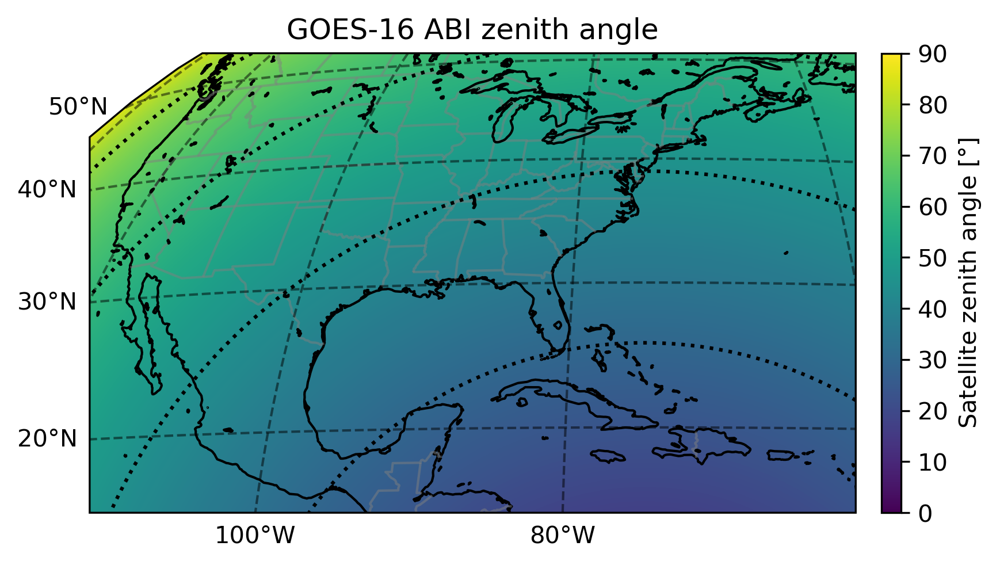

In [13]:
fig = goes_figure(dcc_ds, dpi=dpi)
ax = fig.subplot(111, cbar_size="2.5%", cbar_pad=0.15)
ax.coastlines()
ax.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='k', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
# gl.xlines = False
# gl.ylines = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

img = ax.imshow(sza, vmin=0, vmax=90)
ax.colorbar(img, label="Satellite zenith angle [$\degree$]")
CS = ax.contour(sza, [30, 45, 60, 75], linestyles=":", colors="k")
# ax.clabel(CS, CS.levels, inline=True, fontsize=10)

ax.set_title("GOES-16 ABI zenith angle")

figure_list.append(plt.gcf())

## Figure 2 : example of core + anvil tracking

In [14]:
i = 72

thin_anvil_labels = np.isin(
    dcc_ds.thin_anvil_label[i],
    datasets[5].anvil[datasets[5].thin_anvil_is_valid]
)
thick_anvil_labels = np.isin(
    dcc_ds.thick_anvil_label[i],
    datasets[5].anvil[datasets[5].thin_anvil_is_valid]
)
core_labels = np.isin(
    dcc_ds.core_label[i],
    datasets[5].core[datasets[5].core_is_valid]
)

invalid_thin_anvil_labels = np.isin(
    dcc_ds.thin_anvil_label[i],
    datasets[5].anvil[np.logical_not(datasets[5].thin_anvil_is_valid)]
)
invalid_thick_anvil_labels = np.isin(
    dcc_ds.thick_anvil_label[i],
    datasets[5].anvil[np.logical_not(datasets[5].thin_anvil_is_valid)]
)
invalid_core_labels = np.isin(
    dcc_ds.core_label[i],
    datasets[5].core[np.logical_not(datasets[5].core_is_valid)]
)

removed_thin_anvil_labels = np.logical_and(
    np.logical_not(
        np.isin(dcc_ds.thin_anvil_label[i], datasets[5].anvil)
    ),
    dcc_ds.thin_anvil_label[i] != 0
)
removed_thick_anvil_labels = np.logical_and(
    np.logical_not(
        np.isin(dcc_ds.thick_anvil_label[i], datasets[5].anvil)
    ),
    dcc_ds.thick_anvil_label[i] != 0
)
removed_core_labels = np.logical_and(
    np.logical_not(
        np.isin(dcc_ds.core_label[i], datasets[5].core)
    ),
    dcc_ds.core_label[i] != 0
)

/var/folders/cw/ddjy53ds5h51szdq1630n50r0000gp/T/ipykernel_16781/1368202753.py:82: UserWarning: Converting non-nanosecond precision datetime values to nanosecond precision. This behavior can eventually be relaxed in xarray, as it is an artifact from pandas which is now beginning to support non-nanosecond precision values. This warning is caused by passing non-nanosecond np.datetime64 or np.timedelta64 values to the DataArray or Variable constructor; it can be silenced by converting the values to nanosecond precision ahead of time.
  fig.suptitle("Detected cores and anvils "+parse_date(dcc_ds.t.astype('datetime64[s]').data[i].astype(str)).strftime('%Y-%m-%d-%H:%M:%S')+" UTC")
/Users/jonesw/miniconda3_ARM/envs/thesis_notebooks/lib/python3.11/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
/Users/jonesw/miniconda3_ARM/envs/thesis_notebooks/lib/python3.11/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid val

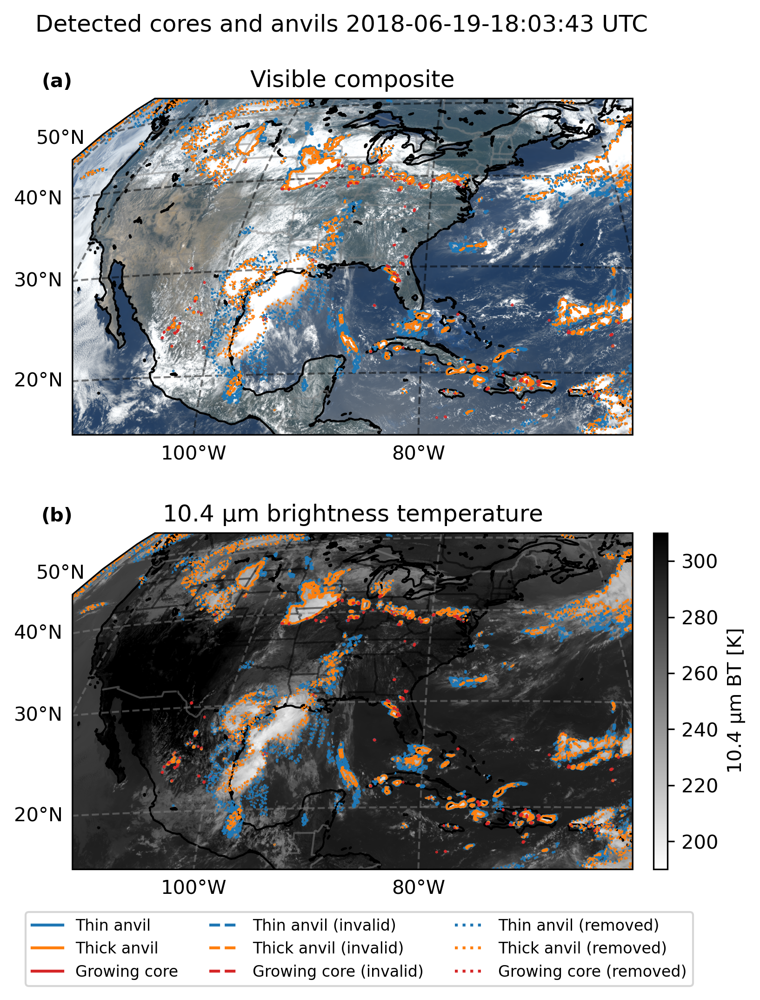

In [15]:
fig = goes_figure(dcc_ds, dpi=dpi, figsize=(6.4,7.2))
ax = fig.subplot(211, cbar_size="2.5%", cbar_pad=0.15)
ax.coastlines()
ax.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='k', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
# gl.xlines = False
# gl.ylines = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

# ax.background_img(name="bluemarble", resolution="high")

img = ax.imshow(get_abi_rgb(abi_ds)) 
cntr = [
    ax.contour(thin_anvil_labels, [0.5], colors=['C00'], linewidths=[1]),
    ax.contour(thick_anvil_labels, [0.5], colors=['C01'], linewidths=[1]),
    ax.contour(core_labels, [0.5], colors=['C03'], linewidths=[1]),
    ax.contour(invalid_thin_anvil_labels, [0.5], colors=['C00'], linewidths=[1], linestyles=["--"]),
    ax.contour(invalid_thick_anvil_labels, [0.5], colors=['C01'], linewidths=[1], linestyles=["--"]),
    ax.contour(invalid_core_labels, [0.5], colors=['C03'], linewidths=[1], linestyles=["--"]),
    ax.contour(removed_thin_anvil_labels, [0.5], colors=['C00'], linewidths=[1], linestyles=[":"]),
    ax.contour(removed_thick_anvil_labels, [0.5], colors=['C01'], linewidths=[1], linestyles=[":"]),
    ax.contour(removed_core_labels, [0.5], colors=['C03'], linewidths=[1], linestyles=[":"]),
]
ax.set_title("Visible composite")
ax.set_title("(a)", loc="left", ha="right", weight="bold", fontsize=10)


ax = fig.subplot(212, cbar_size="2.5%", cbar_pad=0.15)
ax.coastlines()
ax.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax.add_feature(states_provinces, edgecolor='k', alpha=0.5)
ax.add_feature(cfeature.LAKES, edgecolor='k', alpha=1, facecolor="none")
gl = ax.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='gray', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
# gl.xlines = False
# gl.ylines = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

# ax.background_img(name="bluemarble", resolution="high")

img = ax.imshow(abi_ds.CMI_C13, cmap="binary", vmin=190, vmax=310)
cbar = ax.colorbar(img, label="10.4 $\mathrm{\mu m}$ BT [K]")
cntr = [
    ax.contour(thin_anvil_labels, [0.5], colors=['C00'], linewidths=[1]),
    ax.contour(thick_anvil_labels, [0.5], colors=['C01'], linewidths=[1]),
    ax.contour(core_labels, [0.5], colors=['C03'], linewidths=[1]),
    ax.contour(invalid_thin_anvil_labels, [0.5], colors=['C00'], linewidths=[1], linestyles=["--"]),
    ax.contour(invalid_thick_anvil_labels, [0.5], colors=['C01'], linewidths=[1], linestyles=["--"]),
    ax.contour(invalid_core_labels, [0.5], colors=['C03'], linewidths=[1], linestyles=["--"]),
    ax.contour(removed_thin_anvil_labels, [0.5], colors=['C00'], linewidths=[1], linestyles=[":"]),
    ax.contour(removed_thick_anvil_labels, [0.5], colors=['C01'], linewidths=[1], linestyles=[":"]),
    ax.contour(removed_core_labels, [0.5], colors=['C03'], linewidths=[1], linestyles=[":"]),
]
ax.set_title("10.4 $\mathrm{\mu m}$ brightness temperature")
ax.set_title("(b)", loc="left", ha="right", weight="bold", fontsize=10)


# ax.set_title("Detected cores and anvils "+parse_date(dcc_ds.t.astype('datetime64[s]').data[i].astype(str)).strftime('%Y-%m-%d-%H:%M:%S')+" UTC")
fig.suptitle("Detected cores and anvils "+parse_date(dcc_ds.t.astype('datetime64[s]').data[i].astype(str)).strftime('%Y-%m-%d-%H:%M:%S')+" UTC")

plt.subplots_adjust(bottom=0.1, hspace=0.1, top=0.925)

legend = fig.legend(
    [
        mlines.Line2D([], [], color='C00'), 
        mlines.Line2D([], [], color='C01'), 
        mlines.Line2D([], [], color='C03'), 
        mlines.Line2D([], [], color='C00', linestyle="--"), 
        mlines.Line2D([], [], color='C01', linestyle="--"), 
        mlines.Line2D([], [], color='C03', linestyle="--"), 
        mlines.Line2D([], [], color='C00', linestyle=":"), 
        mlines.Line2D([], [], color='C01', linestyle=":"), 
        mlines.Line2D([], [], color='C03', linestyle=":"), 
    ], 
    [
        'Thin anvil', 'Thick anvil', 'Growing core', 
        'Thin anvil (invalid)', 'Thick anvil (invalid)', 'Growing core (invalid)', 
        'Thin anvil (removed)', 'Thick anvil (removed)', 'Growing core (removed)', 
    ], 
    loc='center', ncol=3, bbox_to_anchor=[0.52, 0.05], fontsize=8
)

plt.draw()
# add_gl_ticks(ax, gl)

figure_list.append(plt.gcf())

In [16]:
def get_goes_crs_xy(goes_ds):
    h = goes_ds.goes_imager_projection.perspective_point_height
    return goes_ds.x.values * h, goes_ds.y.values * h

In [17]:
img_extent = (-110, -60, 15, 45)
geo = pyproj.Geod(ellps="WGS84")
print(geo.inv(-110, 30, -60, 30)[-1]/1e3)
print(geo.inv(-90, 15, -90, 45)[-1]/1e3)

4783.834409435691
3325.9547885771976


/var/folders/cw/ddjy53ds5h51szdq1630n50r0000gp/T/ipykernel_16781/1667022409.py:101: UserWarning: Converting non-nanosecond precision datetime values to nanosecond precision. This behavior can eventually be relaxed in xarray, as it is an artifact from pandas which is now beginning to support non-nanosecond precision values. This warning is caused by passing non-nanosecond np.datetime64 or np.timedelta64 values to the DataArray or Variable constructor; it can be silenced by converting the values to nanosecond precision ahead of time.
  fig.suptitle("Detected cores and anvils "+parse_date(dcc_ds.t.astype('datetime64[s]').data[i].astype(str)).strftime('%Y-%m-%d-%H:%M:%S')+" UTC")


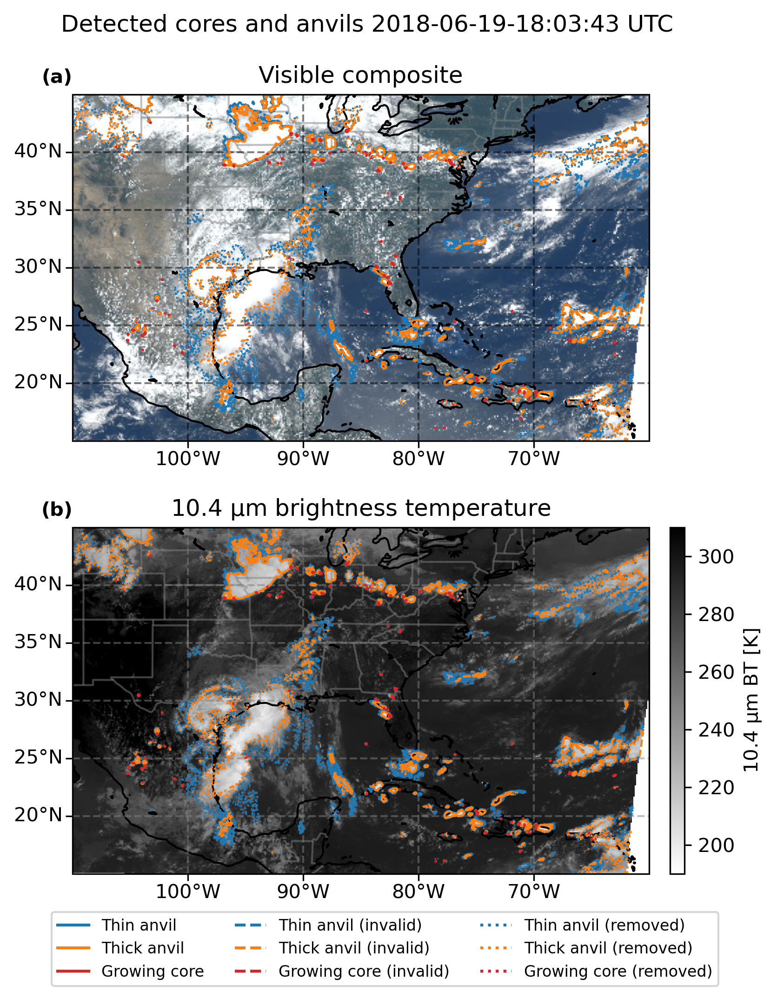

In [18]:
# Plot on PlateCarree projection
from tobac_flow.plotting import get_goes_ccrs, get_goes_extent

fig = plt.figure(dpi=dpi, figsize=(6.4,7.2))

ax1 = plt.subplot(211, projection=ccrs.PlateCarree())
ax1.coastlines()
ax1.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax1.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax1.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax1.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='k', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

img = ax1.imshow(
    get_abi_rgb(abi_ds), 
    transform=get_goes_ccrs(abi_ds), extent=get_goes_extent(abi_ds), regrid_shape=1500
)

cntr = [
    ax1.contour(*get_goes_crs_xy(abi_ds), thin_anvil_labels, [0.5], colors=['C00'], linewidths=[1], transform=get_goes_ccrs(abi_ds)),
    ax1.contour(*get_goes_crs_xy(abi_ds), thick_anvil_labels, [0.5], colors=['C01'], linewidths=[1], transform=get_goes_ccrs(abi_ds)),
    ax1.contour(*get_goes_crs_xy(abi_ds), core_labels, [0.5], colors=['C03'], linewidths=[1], transform=get_goes_ccrs(abi_ds)),
    ax1.contour(*get_goes_crs_xy(abi_ds), invalid_thin_anvil_labels, [0.5], colors=['C00'], linewidths=[1], linestyles=["--"], transform=get_goes_ccrs(abi_ds)),
    ax1.contour(*get_goes_crs_xy(abi_ds), invalid_thick_anvil_labels, [0.5], colors=['C01'], linewidths=[1], linestyles=["--"], transform=get_goes_ccrs(abi_ds)),
    ax1.contour(*get_goes_crs_xy(abi_ds), invalid_core_labels, [0.5], colors=['C03'], linewidths=[1], linestyles=["--"], transform=get_goes_ccrs(abi_ds)),
    ax1.contour(*get_goes_crs_xy(abi_ds), removed_thin_anvil_labels, [0.5], colors=['C00'], linewidths=[1], linestyles=[":"], transform=get_goes_ccrs(abi_ds)),
    ax1.contour(*get_goes_crs_xy(abi_ds), removed_thick_anvil_labels, [0.5], colors=['C01'], linewidths=[1], linestyles=[":"], transform=get_goes_ccrs(abi_ds)),
    ax1.contour(*get_goes_crs_xy(abi_ds), removed_core_labels, [0.5], colors=['C03'], linewidths=[1], linestyles=[":"], transform=get_goes_ccrs(abi_ds)),
]

ax_divider = make_axes_locatable(ax1)
cbar_size="2.5%"
cbar_pad=0.15
cax_r = ax_divider.new_horizontal(size=cbar_size, pad=cbar_pad, axes_class=plt.Axes)
# fig.add_axes(cax_r)
# cbar = plt.colorbar(img, cax=cax_r, label="")

ax1.set_extent(img_extent, crs=ccrs.PlateCarree())
ax1.set_title("Visible composite")
ax1.set_title("(a)", loc="left", ha="right", weight="bold", fontsize=10)


ax2 = plt.subplot(212, projection=ccrs.PlateCarree())
ax2.coastlines()
ax2.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax2.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax2.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax2.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='gray', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

img = ax2.imshow(
    abi_ds.CMI_C13, cmap="binary", vmin=190, vmax=310, 
    transform=get_goes_ccrs(abi_ds), extent=get_goes_extent(abi_ds), regrid_shape=1500
)

cntr = [
    ax2.contour(*get_goes_crs_xy(abi_ds), thin_anvil_labels, [0.5], colors=['C00'], linewidths=[1], transform=get_goes_ccrs(abi_ds)),
    ax2.contour(*get_goes_crs_xy(abi_ds), thick_anvil_labels, [0.5], colors=['C01'], linewidths=[1], transform=get_goes_ccrs(abi_ds)),
    ax2.contour(*get_goes_crs_xy(abi_ds), core_labels, [0.5], colors=['C03'], linewidths=[1], transform=get_goes_ccrs(abi_ds)),
    ax2.contour(*get_goes_crs_xy(abi_ds), invalid_thin_anvil_labels, [0.5], colors=['C00'], linewidths=[1], linestyles=["--"], transform=get_goes_ccrs(abi_ds)),
    ax2.contour(*get_goes_crs_xy(abi_ds), invalid_thick_anvil_labels, [0.5], colors=['C01'], linewidths=[1], linestyles=["--"], transform=get_goes_ccrs(abi_ds)),
    ax2.contour(*get_goes_crs_xy(abi_ds), invalid_core_labels, [0.5], colors=['C03'], linewidths=[1], linestyles=["--"], transform=get_goes_ccrs(abi_ds)),
    ax2.contour(*get_goes_crs_xy(abi_ds), removed_thin_anvil_labels, [0.5], colors=['C00'], linewidths=[1], linestyles=[":"], transform=get_goes_ccrs(abi_ds)),
    ax2.contour(*get_goes_crs_xy(abi_ds), removed_thick_anvil_labels, [0.5], colors=['C01'], linewidths=[1], linestyles=[":"], transform=get_goes_ccrs(abi_ds)),
    ax2.contour(*get_goes_crs_xy(abi_ds), removed_core_labels, [0.5], colors=['C03'], linewidths=[1], linestyles=[":"], transform=get_goes_ccrs(abi_ds)),
]

ax_divider = make_axes_locatable(ax2)
cbar_size="2.5%"
cbar_pad=0.15
cax_r = ax_divider.new_horizontal(size=cbar_size, pad=cbar_pad, axes_class=plt.Axes)
fig.add_axes(cax_r)
cbar = plt.colorbar(img, cax=cax_r, label="10.4 $\mathrm{\mu m}$ BT [K]")

ax2.set_extent(img_extent, crs=ccrs.PlateCarree())
ax2.set_title("10.4 $\mathrm{\mu m}$ brightness temperature")
ax2.set_title("(b)", loc="left", ha="right", weight="bold", fontsize=10)

fig.suptitle("Detected cores and anvils "+parse_date(dcc_ds.t.astype('datetime64[s]').data[i].astype(str)).strftime('%Y-%m-%d-%H:%M:%S')+" UTC")

plt.subplots_adjust(bottom=0.125, hspace=0.25, top=0.9)

legend = fig.legend(
    [
        mlines.Line2D([], [], color='C00'), 
        mlines.Line2D([], [], color='C01'), 
        mlines.Line2D([], [], color='C03'), 
        mlines.Line2D([], [], color='C00', linestyle="--"), 
        mlines.Line2D([], [], color='C01', linestyle="--"), 
        mlines.Line2D([], [], color='C03', linestyle="--"), 
        mlines.Line2D([], [], color='C00', linestyle=":"), 
        mlines.Line2D([], [], color='C01', linestyle=":"), 
        mlines.Line2D([], [], color='C03', linestyle=":"), 
    ], 
    [
        'Thin anvil', 'Thick anvil', 'Growing core', 
        'Thin anvil (invalid)', 'Thick anvil (invalid)', 'Growing core (invalid)', 
        'Thin anvil (removed)', 'Thick anvil (removed)', 'Growing core (removed)', 
    ], 
    loc='center', ncol=3, bbox_to_anchor=[0.52, 0.05], fontsize=8
)

plt.draw()
add_gl_ticks(ax1, gl)
add_gl_ticks(ax2, gl)

## Figure 3: Observed cores by season

In [19]:
core_is_valid = np.concatenate([ds.core_is_valid.data for ds in datasets])
core_has_anvil = np.concatenate([np.logical_and(ds.core_has_anvil_flag.data, ~ds.core_anvil_removed.data) for ds in datasets])

core_start_lon = np.concatenate([ds.core_start_lon.data for ds in datasets])
core_start_lat = np.concatenate([ds.core_start_lat.data for ds in datasets])

core_start_t = np.concatenate([ds.core_start_t.data for ds in datasets])
core_month = (core_start_t.astype("datetime64[M]") - core_start_t.astype("datetime64[Y]")).astype("timedelta64[M]").astype(int) + 1

core_local_time = core_start_t + np.array(core_start_lon/15*3600, "timedelta64[s]")
core_local_hour = (core_local_time - core_local_time.astype("datetime64[D]")).astype(int)/3.6e12

In [20]:
core_is_valid = np.logical_and.reduce([
    core_is_valid,
    core_start_lon > -110,
    core_start_lat < 45
])
print(np.sum(core_is_valid), core_is_valid.size)

3615533 3877130


In [21]:
core_is_valid = np.logical_and(core_is_valid, core_has_anvil)
print(np.sum(core_is_valid), core_is_valid.size)

1643030 3877130


In [22]:
anvil_lat = np.concatenate([ds.thick_anvil_average_lat.data for ds in datasets])
anvil_lon = np.concatenate([ds.thick_anvil_average_lon.data for ds in datasets])
anvil_start_lat = np.concatenate([ds.thick_anvil_start_lat.data for ds in datasets])
anvil_start_lon = np.concatenate([ds.thick_anvil_start_lon.data for ds in datasets])
def anvil_initiation_t(ds):
    return np.minimum(
        ds.core_start_t.loc[ds.anvil_initial_core_index.data].data, 
        ds.thick_anvil_start_t.data
    )
    
anvil_start_t = np.concatenate([anvil_initiation_t(ds) for ds in datasets])
anvil_month = (anvil_start_t.astype("datetime64[M]") - anvil_start_t.astype("datetime64[Y]")).astype("timedelta64[M]").astype(int) + 1

anvil_core_count = np.concatenate([ds.anvil_core_count.data for ds in datasets])


In [23]:
anvil_is_valid = np.concatenate([ds.thin_anvil_is_valid.data for ds in datasets])
thin_anvil_valid_start = np.concatenate([
    (ds.thin_anvil_start_t.data >= ds.thick_anvil_start_t.data) 
    & (ds.thin_anvil_start_t.data >= anvil_initiation_t(ds))
    for ds in datasets
])
anvil_is_valid = np.logical_and.reduce([
    anvil_is_valid,
    thin_anvil_valid_start,
    anvil_start_lon > -110,
    anvil_start_lat < 45
])
print(np.sum(anvil_is_valid), anvil_is_valid.size)

391050 648345


In [24]:
np.sum(anvil_core_count[anvil_is_valid])

792522

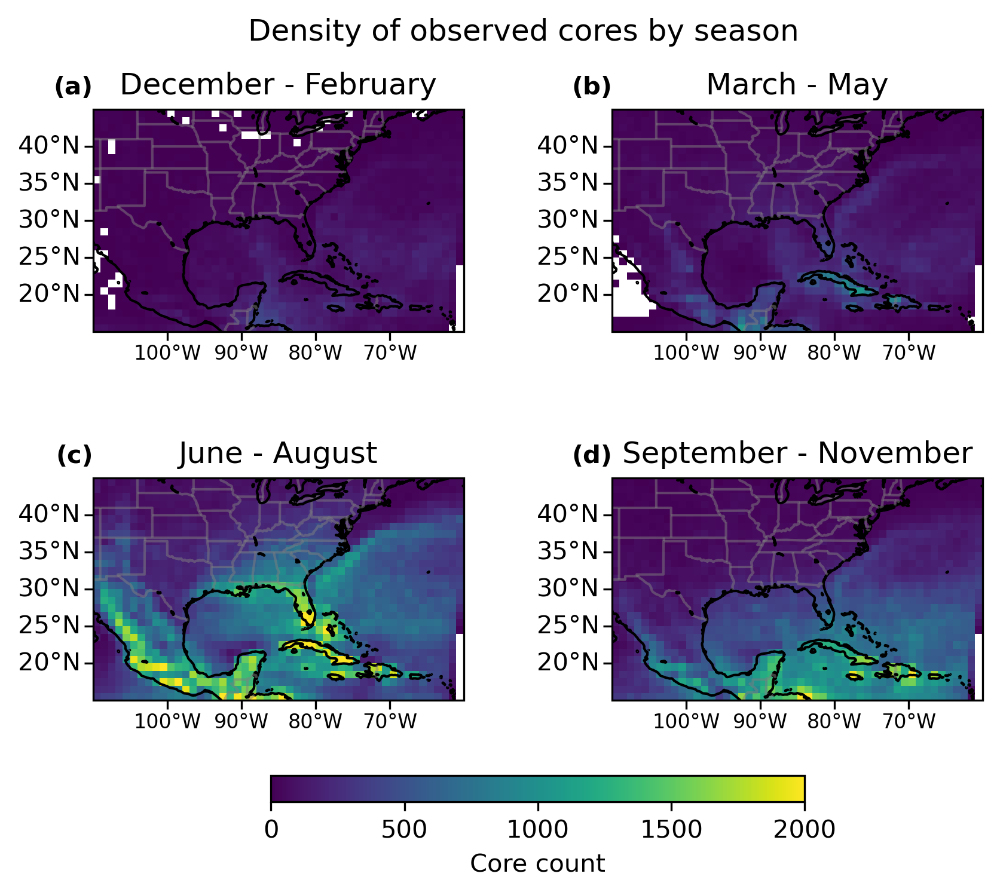

In [25]:
max_count = 2000
min_count = 0

fig, axes = plt.subplots(2, 2, dpi=dpi, figsize=(6.4,5.6), subplot_kw={"projection":ccrs.PlateCarree()})

ax1 = axes[0,0]
ax1.coastlines()
ax1.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax1.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax1.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax1.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='gray', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
gl.xlines = False
gl.ylines = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'size': 8, 'color': 'k', 'rotation':0, 'ha':'center'}

wh_djf = np.array([True if t in [1,2,12] else False for t in core_month ])
h = ax1.hist2d(np.array(core_start_lon)[np.logical_and(wh_djf, core_is_valid)], 
               np.array(core_start_lat)[np.logical_and(wh_djf, core_is_valid)], 
               bins=[np.arange(img_extent[0],img_extent[1]+1), np.arange(img_extent[2],img_extent[3]+1)], 
               cmin=1, vmax=max_count, vmin=min_count)
# plt.colorbar(h[3], label="Core count")
ax1.set_title("December - February")
ax1.set_title("(a)", loc="left", ha="right", weight="bold", fontsize=10)

ax2 = axes[0,1]
ax2.coastlines()
ax2.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax2.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax2.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax2.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='gray', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
gl.xlines = False
gl.ylines = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'size': 8, 'color': 'k', 'rotation':0, 'ha':'center'}

wh_mam = np.array([True if t in [3,4,5] else False for t in core_month ])
h = ax2.hist2d(np.array(core_start_lon)[np.logical_and(wh_mam, core_is_valid)], 
               np.array(core_start_lat)[np.logical_and(wh_mam, core_is_valid)], 
               bins=[np.arange(img_extent[0],img_extent[1]+1), np.arange(img_extent[2],img_extent[3]+1)], 
               cmin=1, vmax=max_count, vmin=min_count)
# plt.colorbar(h[3], label="Core count")
ax2.set_title("March - May")
ax2.set_title("(b)", loc="left", ha="right", weight="bold", fontsize=10)

ax3 = axes[1,0]
ax3.coastlines()
ax3.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax3.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax3.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax3.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='gray', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
gl.xlines = False
gl.ylines = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'size': 8, 'color': 'k', 'rotation':0, 'ha':'center'}

wh_jja = np.array([True if t in [6,7,8] else False for t in core_month ])
h = ax3.hist2d(np.array(core_start_lon)[np.logical_and(wh_jja, core_is_valid)], 
               np.array(core_start_lat)[np.logical_and(wh_jja, core_is_valid)], 
               bins=[np.arange(img_extent[0],img_extent[1]+1), np.arange(img_extent[2],img_extent[3]+1)], 
               cmin=1, vmax=max_count, vmin=min_count)
# plt.colorbar(h[3], label="Core count")
ax3.set_title("June - August")
ax3.set_title("(c)", loc="left", ha="right", weight="bold", fontsize=10)

ax4 = axes[1,1]
ax4.coastlines()
ax4.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax4.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax4.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax4.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='gray', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
gl.xlines = False
gl.ylines = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'size': 8, 'color': 'k', 'rotation':0, 'ha':'center'}

wh_son = np.array([True if t in [9,10,11] else False for t in core_month ])
h = ax4.hist2d(np.array(core_start_lon)[np.logical_and(wh_son, core_is_valid)], 
               np.array(core_start_lat)[np.logical_and(wh_son, core_is_valid)], 
               bins=[np.arange(img_extent[0],img_extent[1]+1), np.arange(img_extent[2],img_extent[3]+1)], 
               cmin=1, vmax=max_count, vmin=min_count)
# plt.colorbar(h[3], label="Core count")
ax4.set_title("September - November")
ax4.set_title("(d)", loc="left", ha="right", weight="bold", fontsize=10)

plt.suptitle("Density of observed cores by season")

fig.colorbar(h[3], ax=axes[:, :], shrink=0.6, location='bottom', label="Core count")

plt.subplots_adjust(hspace=0.3, wspace=0.4, bottom=0.3, top=0.95)

plt.draw()
add_gl_ticks(ax1, gl)
add_gl_ticks(ax2, gl)
add_gl_ticks(ax3, gl)
add_gl_ticks(ax4, gl)

figure_list.append(plt.gcf())

## Figure 4 : Proportion of cores with anvils

In [26]:
# fig = plt.figure(dpi=dpi)

# ax = plt.axes(projection=ccrs.PlateCarree())
# ax.coastlines()
# ax.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
# states_provinces = cfeature.NaturalEarthFeature(
#         category='cultural',
#         name='admin_1_states_provinces_lines',
#         scale='50m',
#         facecolor='none')
# ax.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
# ax.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
# gl = ax.gridlines(
#     crs=ccrs.PlateCarree(), draw_labels=True,
#     linewidth=1, color='gray', alpha=0.5, linestyle='--'
# )
# gl.top_labels = False
# gl.right_labels = False
# gl.xlines = False
# gl.ylines = False
# gl.xformatter = LONGITUDE_FORMATTER
# gl.yformatter = LATITUDE_FORMATTER

# img_data = binned_statistic_2d(
#     core_start_lon[core_is_valid], core_start_lat[core_is_valid], core_has_anvil[core_is_valid], 
#     bins=[np.arange(img_extent[0],img_extent[1]+1), np.arange(img_extent[2],img_extent[3]+1)], 
#     statistic="mean"
# )
# img = ax.imshow(img_data[0].T[::-1], extent=img_extent, vmax=1, vmin=0.5)

# ax_divider = make_axes_locatable(ax)
# cbar_size="2.5%"
# cbar_pad=0.15
# cax_r = ax_divider.new_horizontal(size=cbar_size, pad=cbar_pad, axes_class=plt.Axes)
# fig.add_axes(cax_r)
# cbar = plt.colorbar(img, cax=cax_r, label="Proportion of cores")

# ax.set_title("Proportion of cores associated with anvils")

# plt.draw()
# add_gl_ticks(ax, gl)

# figure_list.append(plt.gcf())

In [27]:
# Find regions
# Get land/sea mask from imerg

lsm_file = "../data/lsm_data.nc"
lsm_ds = xr.open_dataset(lsm_file)

wh_sea = lsm_ds.sea_mask.sel(
    lon=slice(img_extent[0], img_extent[1]), 
    lat=slice(img_extent[2], img_extent[3])
)


In [28]:
core_sea_mask = wh_sea.T[::-1].sel(
    lon=xr.DataArray(core_start_lon, dims="points"), 
    lat=xr.DataArray(core_start_lat, dims="points"), 
method="nearest").data

In [29]:
# fig = plt.figure(dpi=dpi)
# ax = plt.subplot(111)

# wh_sea_valid = np.logical_and(core_is_valid, core_sea_mask)
# h_sea = ax.hist(
#     core_month[wh_sea_valid],
#     bins=range(0,14), 
#     weights=np.full((np.sum(wh_sea_valid),), 1/np.sum(wh_sea_valid)), 
#     alpha=0.5, facecolor="C0", edgecolor="C0", ls='solid', lw=3, histtype='stepfilled'
# )

# wh_land_valid = np.logical_and(core_is_valid, ~core_sea_mask)
# h_land = ax.hist(
#     core_month[wh_land_valid],
#     bins=range(0,14), 
#     weights=np.full((np.sum(wh_land_valid),), 1/np.sum(wh_land_valid)), 
#     alpha=0.5, facecolor="C1", edgecolor="C1", ls='solid', lw=3, histtype='stepfilled'
# )

# plt.legend(["Sea", "Land"])
# ax.set_xlim([1,13])
# ax.set_xticks(
#     np.arange(1.5,13), 
#     ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"],
#     rotation=90
# )
# ax.set_xlabel("Month")
# ax.set_ylabel("Proportion")
# ax.set_title("Land-Sea contrast in annual cycle")

# figure_list.append(plt.gcf())

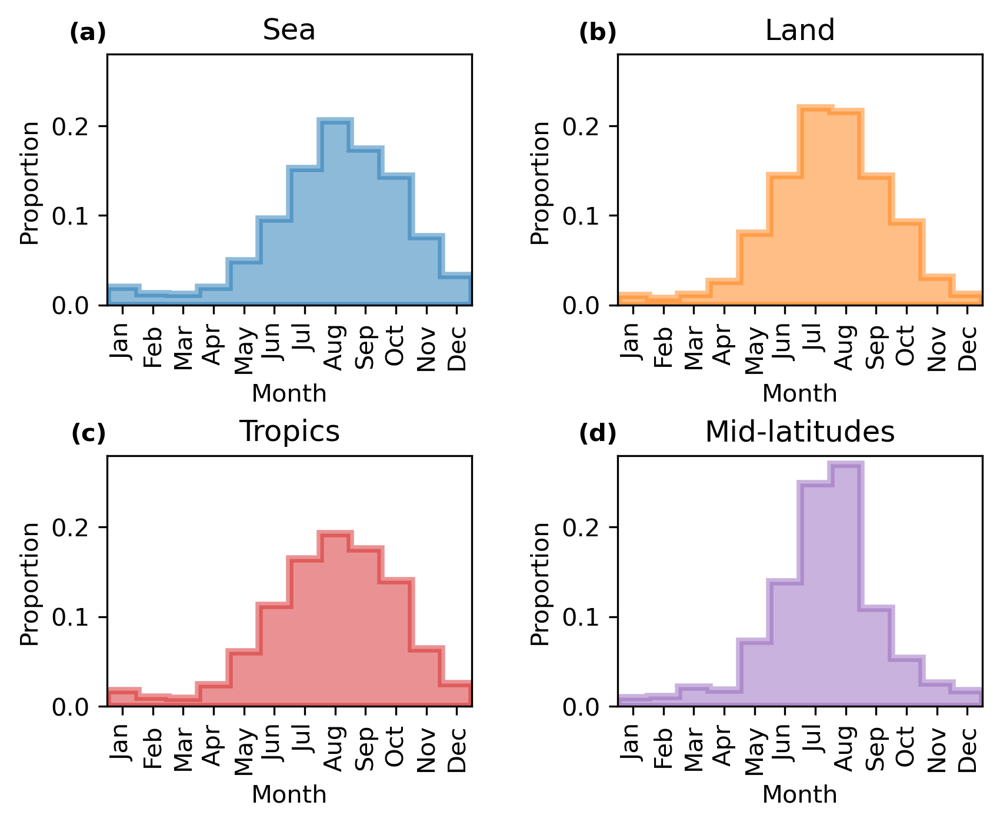

In [30]:
fig = plt.figure(dpi=dpi)

ax = plt.subplot(221)

wh_sea_valid = np.logical_and(core_is_valid, core_sea_mask)
h_sea = ax.hist(
    core_month[wh_sea_valid],
    bins=range(0,14), 
    weights=np.full((np.sum(wh_sea_valid),), 1/np.sum(wh_sea_valid)), 
    alpha=0.5, facecolor="C0", edgecolor="C0", ls='solid', lw=3, histtype='stepfilled'
)

ax.set_xlim([1,13])
ax.set_xticks(
    np.arange(1.5,13), 
    ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"],
    rotation=90
)
ax.set_xlabel("Month")
ax.set_ylabel("Proportion")
ax.set_ylim([0,0.28])
ax.set_title("Sea")
ax.set_title("(a)", loc="left", ha="right", weight="bold", fontsize=10)


ax = plt.subplot(222)

wh_land_valid = np.logical_and(core_is_valid, ~core_sea_mask)
h_land = ax.hist(
    core_month[wh_land_valid],
    bins=range(0,14), 
    weights=np.full((np.sum(wh_land_valid),), 1/np.sum(wh_land_valid)), 
    alpha=0.5, facecolor="C1", edgecolor="C1", ls='solid', lw=3, histtype='stepfilled'
)

ax.set_xlim([1,13])
ax.set_xticks(
    np.arange(1.5,13), 
    ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"],
    rotation=90
)
ax.set_xlabel("Month")
ax.set_ylabel("Proportion")
ax.set_ylim([0,0.28])
ax.set_title("Land")
ax.set_title("(b)", loc="left", ha="right", weight="bold", fontsize=10)


ax = plt.subplot(223)

wh_tropics_valid = np.logical_and(core_is_valid, core_start_lat<=30)
h_tropics = ax.hist(
    core_month[wh_tropics_valid],
    bins=range(0,14), 
    weights=np.full((np.sum(wh_tropics_valid),), 1/np.sum(wh_tropics_valid)), 
    alpha=0.5, facecolor="C3", edgecolor="C3", ls='solid', lw=3, histtype='stepfilled'
)

ax.set_xlim([1,13])
ax.set_xticks(
    np.arange(1.5,13), 
    ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"],
    rotation=90
)
ax.set_xlabel("Month")
ax.set_ylabel("Proportion")
ax.set_ylim([0,0.28])
ax.set_title("Tropics")
ax.set_title("(c)", loc="left", ha="right", weight="bold", fontsize=10)


ax = plt.subplot(224)

wh_midlats_valid = np.logical_and(core_is_valid, core_start_lat>30)
h_land = ax.hist(
    core_month[wh_midlats_valid],
    bins=range(0,14), 
    weights=np.full((np.sum(wh_midlats_valid),), 1/np.sum(wh_midlats_valid)), 
    alpha=0.5, facecolor="C4", edgecolor="C4", ls='solid', lw=3, histtype='stepfilled'
)

ax.set_xlim([1,13])
ax.set_xticks(
    np.arange(1.5,13), 
    ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"],
    rotation=90
)
ax.set_xlabel("Month")
ax.set_ylabel("Proportion")
ax.set_ylim([0,0.28])
ax.set_title("Mid-latitudes")
ax.set_title("(d)", loc="left", ha="right", weight="bold", fontsize=10)

plt.subplots_adjust(hspace=0.6, wspace=0.4)

figure_list.append(plt.gcf())

## Figure 6 : Core propagation

In [31]:
core_azimuths = np.concatenate([ds.core_propagation_direction for ds in datasets])
core_speed = np.concatenate([ds.core_propagation_speed for ds in datasets])

In [32]:
def block_reduce_quiver(x, y, u, v, *args, ax=None, spacing=1, block_method="slice", **kwargs):
    if ax is None:
        ax = plt.gca()
    if block_method == "slice":
        slc = slice(spacing // 2, None, spacing)
        quiv = ax.quiver(
            x[slc],
            y[slc],
            u[slc, slc],
            v[slc, slc],
            *args,
            **kwargs,
        )
    elif block_method == "reduce":
        from skimage.measure import block_reduce
        new_x, new_y = block_reduce(x, (spacing,), np.nanmean), block_reduce(y, (spacing,), np.nanmean)
        new_u, new_v = block_reduce(u, (spacing, spacing), np.nanmean), block_reduce(v, (spacing, spacing), np.nanmean)
        quiv = ax.quiver(new_x, new_y, new_u, new_v, *args, **kwargs)
    else:
        raise ValueError("invalid input for 'block_method'")
    return quiv

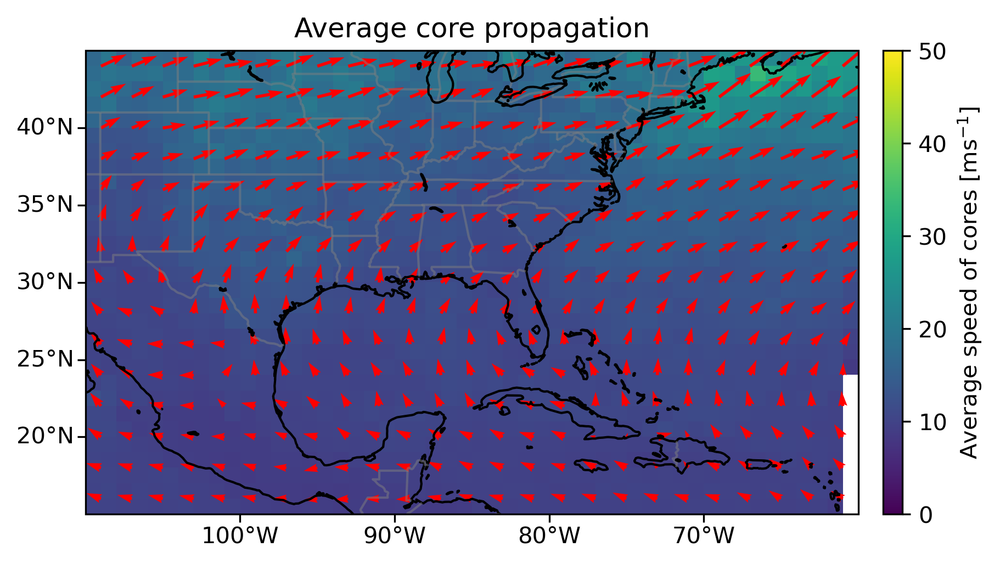

In [33]:
def circmean_degrees(x):
    return circmean(x, high=180, low=-180)

fig = plt.figure(dpi=dpi)

ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='gray', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
gl.xlines = False
gl.ylines = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

img_data = binned_statistic_2d(
    core_start_lon[core_is_valid], core_start_lat[core_is_valid], core_speed[core_is_valid], 
    bins=[np.arange(img_extent[0],img_extent[1]+1), np.arange(img_extent[2],img_extent[3]+1)], 
    statistic="mean"
)
img = ax.imshow(img_data[0].T[::-1], extent=img_extent, vmin=0, vmax=50)

core_avg_speed = binned_statistic_2d(
    core_start_lon[core_is_valid], core_start_lat[core_is_valid], core_speed[core_is_valid], 
    bins=[np.arange(img_extent[0],img_extent[1]+1), np.arange(img_extent[2],img_extent[3]+1)], 
    statistic="mean"
)[0]
core_avg_angle = binned_statistic_2d(
    core_start_lon[core_is_valid], core_start_lat[core_is_valid], core_azimuths[core_is_valid], 
    bins=[np.arange(img_extent[0],img_extent[1]+1), np.arange(img_extent[2],img_extent[3]+1)], 
    statistic=circmean_degrees
)[0]
block_reduce_quiver(
    (np.arange(img_extent[0],img_extent[1])+0.5), 
    (np.arange(img_extent[2],img_extent[3])+0.5),
    (np.sin(np.deg2rad(core_avg_angle)) * core_avg_speed).T,
    (np.cos(np.deg2rad(core_avg_angle)) * core_avg_speed).T,
    spacing=2,
    block_method="reduce",
    color="r",
    scale=1e1, 
    width=0.2,
    scale_units="xy",
    units="xy"
)

ax_divider = make_axes_locatable(ax)
cbar_size="2.5%"
cbar_pad=0.15
cax_r = ax_divider.new_horizontal(size=cbar_size, pad=cbar_pad, axes_class=plt.Axes)
fig.add_axes(cax_r)
cbar = plt.colorbar(img, cax=cax_r, label="Average speed of cores [$\mathrm{ms^{-1}}$]")

ax.set_title("Average core propagation")

plt.draw()
add_gl_ticks(ax, gl)

figure_list.append(plt.gcf())

## Figure 7 : Average core lifetime

In [34]:
# core_BT_max = np.concatenate([
#     ds.core_BT_max.values for ds in datasets
# ])
# core_start_BT = np.concatenate([ds.core_step_BT_mean.loc[ds.core_initial_core_step_index] for ds in datasets])
# core_warm_start = np.logical_and(core_is_valid, core_start_BT >= 273)

In [35]:
# core_warm_start.sum(), core_warm_start.size

In [36]:
is_initial_core = np.concatenate([np.isin(ds.core, ds.anvil_initial_core_index) for ds in datasets])
is_initial_core = np.logical_and(core_is_valid, is_initial_core)

In [37]:
is_initial_core.sum(), is_initial_core.size

(620938, 3877130)

In [38]:
core_lifetime = np.concatenate([ds.core_lifetime.data for ds in datasets])
core_lifetime_minutes = core_lifetime.astype(int)/6e10
core_lifetime_seconds = core_lifetime.astype(int)/1e9

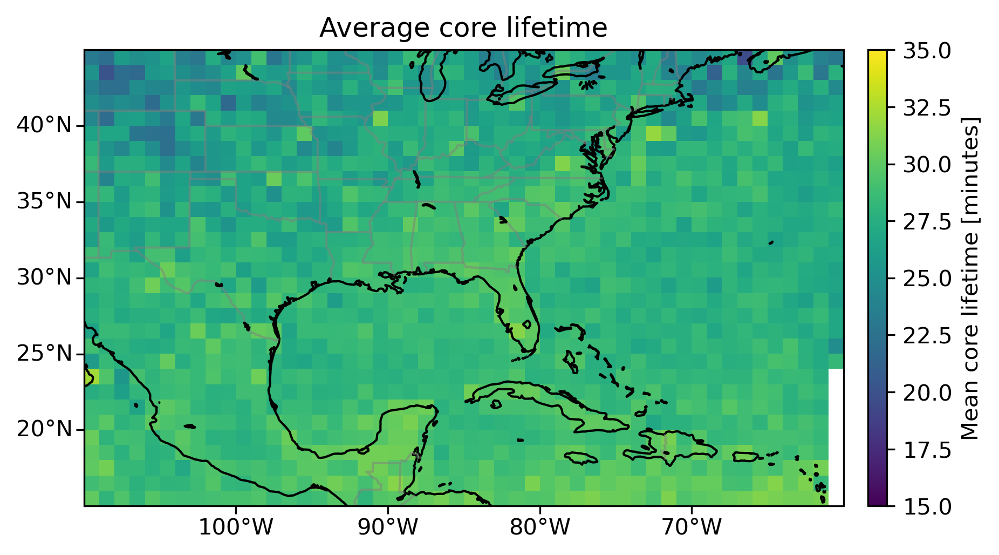

In [39]:
fig = plt.figure(dpi=dpi)

ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='gray', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
gl.xlines = False
gl.ylines = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

img_data = binned_statistic_2d(
    core_start_lon[is_initial_core], core_start_lat[is_initial_core], core_lifetime_minutes[is_initial_core], 
    bins=[np.arange(img_extent[0],img_extent[1]+1), np.arange(img_extent[2],img_extent[3]+1)], 
    statistic="mean"
)
img = ax.imshow(img_data[0].T[::-1], extent=img_extent, vmin=15, vmax=35)

ax_divider = make_axes_locatable(ax)
cbar_size="2.5%"
cbar_pad=0.15
cax_r = ax_divider.new_horizontal(size=cbar_size, pad=cbar_pad, axes_class=plt.Axes)
fig.add_axes(cax_r)
cbar = plt.colorbar(img, cax=cax_r, label="Mean core lifetime [minutes]")

ax.set_title("Average core lifetime")

plt.draw()
add_gl_ticks(ax, gl)

figure_list.append(plt.gcf())

## Figure 8 : Average core maximum cooling rate

In [40]:
core_cooling_rate = np.concatenate([ds.core_cooling_rate.data for ds in datasets])

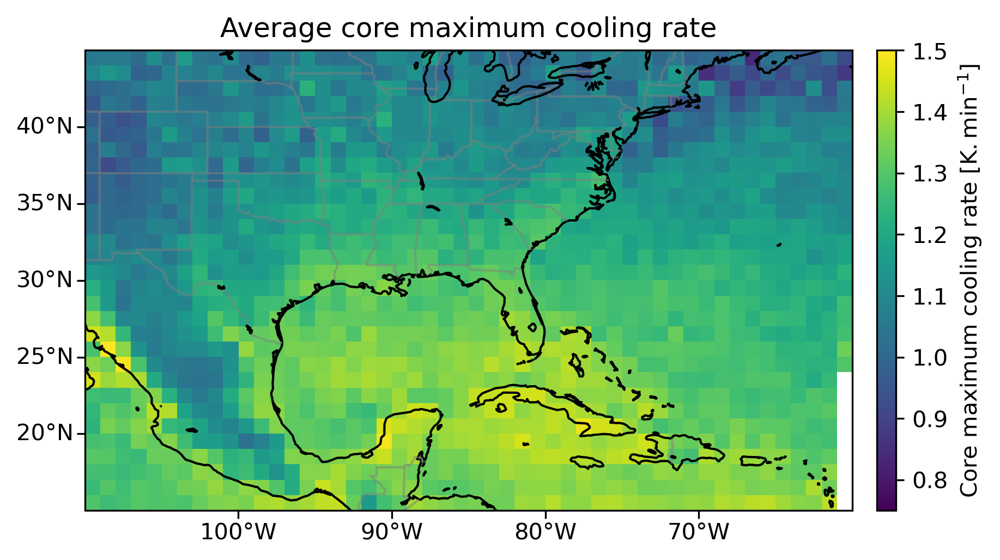

In [41]:
fig = plt.figure(dpi=dpi)

ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='gray', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
gl.xlines = False
gl.ylines = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

img_data = binned_statistic_2d(
    core_start_lon[is_initial_core], core_start_lat[is_initial_core], core_cooling_rate[is_initial_core], 
    bins=[np.arange(img_extent[0],img_extent[1]+1), np.arange(img_extent[2],img_extent[3]+1)], 
    statistic=np.nanmean
)
img = ax.imshow(img_data[0].T[::-1], extent=img_extent, vmin=0.75, vmax=1.5)

ax_divider = make_axes_locatable(ax)
cbar_size="2.5%"
cbar_pad=0.15
cax_r = ax_divider.new_horizontal(size=cbar_size, pad=cbar_pad, axes_class=plt.Axes)
fig.add_axes(cax_r)
cbar = plt.colorbar(img, cax=cax_r, label="Core maximum cooling rate [$\mathrm{K.min^{-1}}$]")
# cbar.set_ticks([0.75,1.0,1.25,1.5,1.75])

ax.set_title("Average core maximum cooling rate")

plt.draw()
add_gl_ticks(ax, gl)

figure_list.append(plt.gcf())

## Figure 9 : Core lifetime and maximum cooling rate distributions

In [42]:
core_max_area = np.concatenate(
    [ds.core_max_area for ds in datasets]
)
core_BT_min = np.concatenate([
    ds.core_BT_min.values for ds in datasets
])

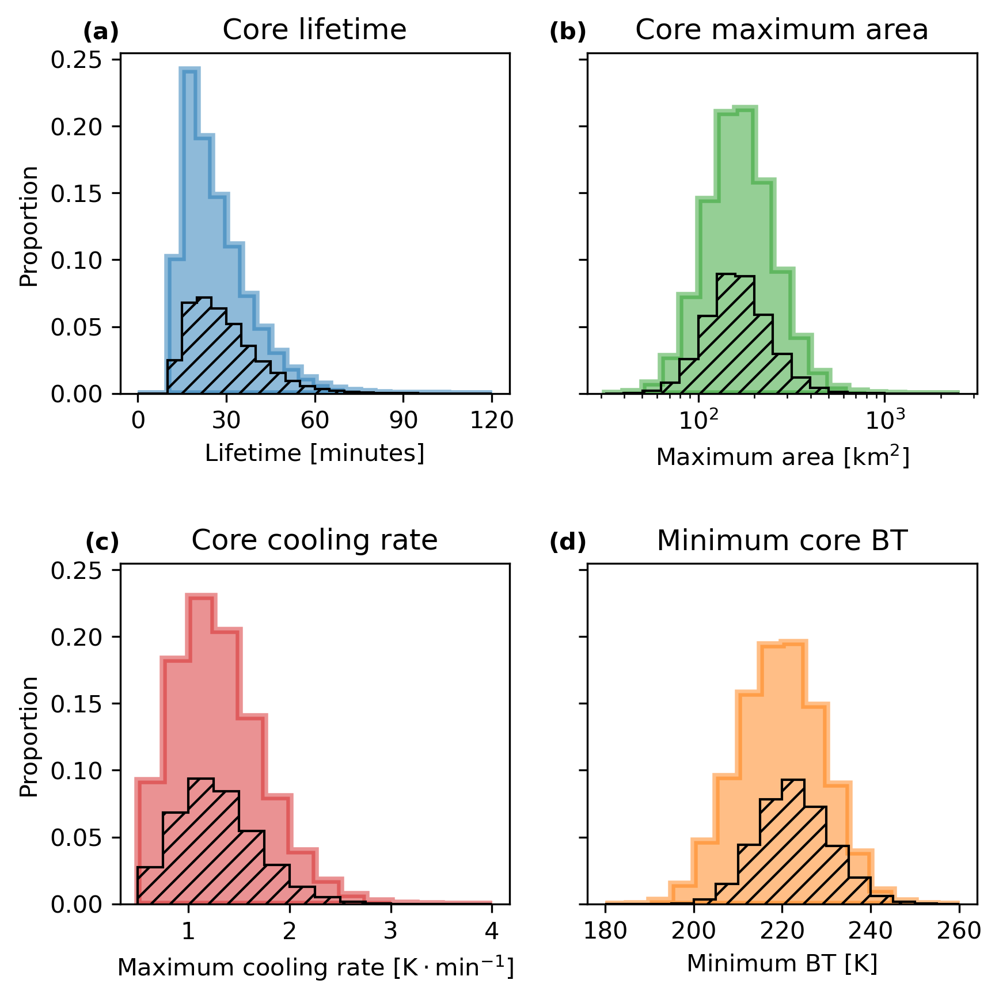

In [43]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, dpi=dpi, sharey=True, figsize=(6.4,6.4))

core_lifetime_bins = np.arange(0,125,5)
ax1.hist(
    core_lifetime_minutes[core_is_valid], bins=core_lifetime_bins, 
    weights=np.full((np.sum(core_is_valid),), 1/np.sum(core_is_valid)), 
    alpha=0.5, facecolor="C0", edgecolor="C0", ls='solid', lw=3, histtype='stepfilled'
)

ax1.hist(
    core_lifetime_minutes[is_initial_core], bins=core_lifetime_bins, 
    weights=np.full((np.sum(is_initial_core),), 1/np.sum(core_is_valid)), 
    histtype='step', linewidth=1, facecolor='none', 
    hatch='///', edgecolor='k', fill=True
)

ax1.set_xticks(range(0,125,30))
ax1.set_xlabel("Lifetime [minutes]")
ax1.set_ylabel("Proportion")
ax1.set_title("Core lifetime")
ax1.set_title("(a)", loc="left", ha="right", weight="bold", fontsize=10)

core_area_bins = 10**np.arange(1.5,3.5,0.1)
ax2.hist(
    core_max_area[core_is_valid], bins=core_area_bins, 
    weights=np.full((np.sum(core_is_valid),), 1/np.sum(core_is_valid)), 
    alpha=0.5, facecolor="C2", edgecolor="C2", ls='solid', lw=3, histtype='stepfilled'
)
ax2.hist(
    core_max_area[is_initial_core], bins=core_area_bins, 
    weights=np.full((np.sum(is_initial_core),), 1/np.sum(core_is_valid)), 
    histtype='step', linewidth=1, facecolor='none', 
    hatch='///', edgecolor='k', fill=True
)

ax2.set_xscale("log")
ax2.set_xlabel("Maximum area [$\mathrm{km^2}$]")
ax2.set_title("Core maximum area")
ax2.set_title("(b)", loc="left", ha="right", weight="bold", fontsize=10)

cooling_rate_bins = np.arange(0.5,4.1,0.25)
ax3.hist(
    core_cooling_rate[core_is_valid], bins=cooling_rate_bins, 
    weights=np.full((np.sum(core_is_valid),), 1/np.sum(core_is_valid)),   
    alpha=0.5, facecolor="C3", edgecolor="C3", ls='solid', lw=3, histtype='stepfilled'
)
ax3.hist(
    core_cooling_rate[is_initial_core], bins=cooling_rate_bins, 
    weights=np.full((np.sum(is_initial_core),), 1/np.sum(core_is_valid)), 
    histtype='step', linewidth=1, facecolor='none', 
    hatch='///', edgecolor='k', fill=True
)

ax3.set_xlabel("Maximum cooling rate [$\mathrm{K\cdot min^{-1}}$]")
ax3.set_title("Core cooling rate")
ax3.set_ylabel("Proportion")
ax3.set_title("(c)", loc="left", ha="right", weight="bold", fontsize=10)

core_BT_bins = np.arange(180,261,5)
ax4.hist(
    core_BT_min[core_is_valid], bins=core_BT_bins, 
    weights=np.full((np.sum(core_is_valid),), 1/np.sum(core_is_valid)),   
    alpha=0.5, facecolor="C1", edgecolor="C1", ls='solid', lw=3, histtype='stepfilled'
)
ax4.hist(
    core_BT_min[is_initial_core], bins=core_BT_bins, 
    weights=np.full((np.sum(is_initial_core),), 1/np.sum(core_is_valid)), 
    histtype='step', linewidth=1, facecolor='none', 
    hatch='///', edgecolor='k', fill=True
)

ax4.set_xlabel("Minimum BT [K]")
ax4.set_title("Minimum core BT")
ax4.set_title("(d)", loc="left", ha="right", weight="bold", fontsize=10)

plt.subplots_adjust(hspace=0.5)

figure_list.append(plt.gcf())

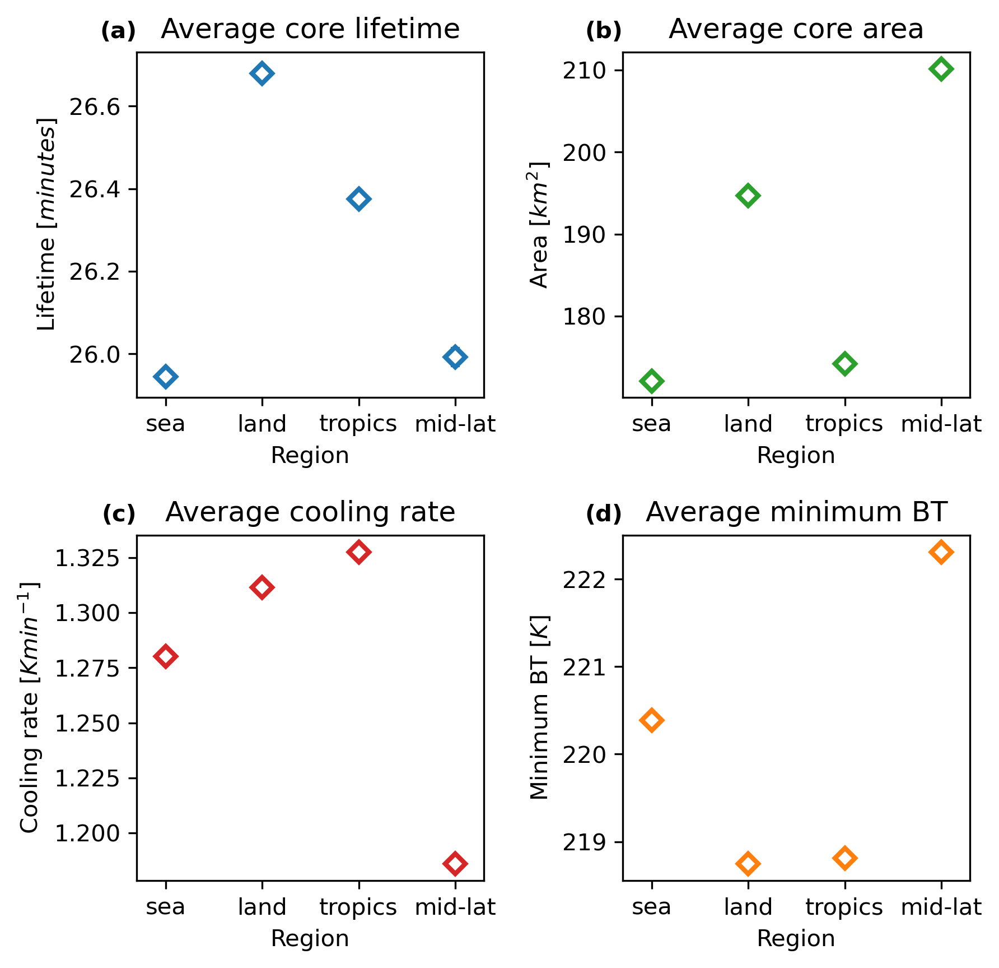

In [44]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, dpi=dpi, figsize=(6.4,6.4))
ax1.errorbar(
    range(4), 
    [
        np.nanmean(core_lifetime_minutes[core_is_valid & core_sea_mask]),
        np.nanmean(core_lifetime_minutes[core_is_valid & ~core_sea_mask]),
        np.nanmean(core_lifetime_minutes[core_is_valid & (core_start_lat <= 30)]),
        np.nanmean(core_lifetime_minutes[core_is_valid & (core_start_lat > 30)]),
    ],
    [
        np.nanstd(core_lifetime_minutes[core_is_valid & core_sea_mask]) / np.sum(core_is_valid & core_sea_mask)**0.5,
        np.nanstd(core_lifetime_minutes[core_is_valid & ~core_sea_mask]) / np.sum(core_is_valid & ~core_sea_mask)**0.5,
        np.nanstd(core_lifetime_minutes[core_is_valid & (core_start_lat <= 30)]) / np.sum(core_is_valid & (core_start_lat <= 30))**0.5,
        np.nanstd(core_lifetime_minutes[core_is_valid & (core_start_lat > 30)]) / np.sum(core_is_valid & (core_start_lat > 30))**0.5,
    ],
    fmt="C0D", mfc="white", ms=6, capsize=2, linewidth=2, mew=2,
)
ax1.set_xticks(range(4), ["sea", "land", "tropics", "mid-lat"])
ax1.set_xlabel("Region")
ax1.set_ylabel("Lifetime [$minutes$]")
ax1.set_title("Average core lifetime")
ax1.set_title("(a)", loc="left", ha="right", weight="bold", fontsize=10)
ax1.set_xlim([-0.3, 3.3])

ax2.errorbar(
    range(4), 
    [
        np.nanmean(core_max_area[core_is_valid & core_sea_mask]),
        np.nanmean(core_max_area[core_is_valid & ~core_sea_mask]),
        np.nanmean(core_max_area[core_is_valid & (core_start_lat <= 30)]),
        np.nanmean(core_max_area[core_is_valid & (core_start_lat > 30)]),
    ],
    [
        np.nanstd(core_max_area[core_is_valid & core_sea_mask]) / np.sum(core_is_valid & core_sea_mask)**0.5,
        np.nanstd(core_max_area[core_is_valid & ~core_sea_mask]) / np.sum(core_is_valid & ~core_sea_mask)**0.5,
        np.nanstd(core_max_area[core_is_valid & (core_start_lat <= 30)]) / np.sum(core_is_valid & (core_start_lat <= 30))**0.5,
        np.nanstd(core_max_area[core_is_valid & (core_start_lat > 30)]) / np.sum(core_is_valid & (core_start_lat > 30))**0.5,
    ],
    fmt="C2D", mfc="white", ms=6, capsize=2, linewidth=2, mew=2,
)
ax2.set_xticks(range(4), ["sea", "land", "tropics", "mid-lat"])
ax2.set_xlabel("Region")
ax2.set_ylabel("Area [$km^2$]")
ax2.set_title("Average core area")
ax2.set_title("(b)", loc="left", ha="right", weight="bold", fontsize=10)
ax2.set_xlim([-0.3, 3.3])

ax3.errorbar(
    range(4), 
    [
        np.nanmean(core_cooling_rate[core_is_valid & core_sea_mask]),
        np.nanmean(core_cooling_rate[core_is_valid & ~core_sea_mask]),
        np.nanmean(core_cooling_rate[core_is_valid & (core_start_lat <= 30)]),
        np.nanmean(core_cooling_rate[core_is_valid & (core_start_lat > 30)]),
    ],
    [
        np.nanstd(core_cooling_rate[core_is_valid & core_sea_mask]) / np.sum(core_is_valid & core_sea_mask)**0.5,
        np.nanstd(core_cooling_rate[core_is_valid & ~core_sea_mask]) / np.sum(core_is_valid & ~core_sea_mask)**0.5,
        np.nanstd(core_cooling_rate[core_is_valid & (core_start_lat <= 30)]) / np.sum(core_is_valid & (core_start_lat <= 30))**0.5,
        np.nanstd(core_cooling_rate[core_is_valid & (core_start_lat > 30)]) / np.sum(core_is_valid & (core_start_lat > 30))**0.5,
    ],
    fmt="C3D", mfc="white", ms=6, capsize=2, linewidth=2, mew=2,
)
ax3.set_xticks(range(4), ["sea", "land", "tropics", "mid-lat"])
ax3.set_xlabel("Region")
ax3.set_ylabel("Cooling rate [$K min^{-1}$]")
ax3.set_title("Average cooling rate")
ax3.set_title("(c)", loc="left", ha="right", weight="bold", fontsize=10)
ax3.set_xlim([-0.3, 3.3])

ax4.errorbar(
    range(4), 
    [
        np.nanmean(core_BT_min[core_is_valid & core_sea_mask]),
        np.nanmean(core_BT_min[core_is_valid & ~core_sea_mask]),
        np.nanmean(core_BT_min[core_is_valid & (core_start_lat <= 30)]),
        np.nanmean(core_BT_min[core_is_valid & (core_start_lat > 30)]),
    ],
    [
        np.nanstd(core_BT_min[core_is_valid & core_sea_mask]) / np.sum(core_is_valid & core_sea_mask)**0.5,
        np.nanstd(core_BT_min[core_is_valid & ~core_sea_mask]) / np.sum(core_is_valid & ~core_sea_mask)**0.5,
        np.nanstd(core_BT_min[core_is_valid & (core_start_lat <= 30)]) / np.sum(core_is_valid & (core_start_lat <= 30))**0.5,
        np.nanstd(core_BT_min[core_is_valid & (core_start_lat > 30)]) / np.sum(core_is_valid & (core_start_lat > 30))**0.5,
    ],
    fmt="C1D", mfc="white", ms=6, capsize=2, linewidth=2, mew=2,
)
ax4.set_xticks(range(4), ["sea", "land", "tropics", "mid-lat"])
ax4.set_xlabel("Region")
ax4.set_ylabel("Minimum BT [$K$]")
ax4.set_title("Average minimum BT")
ax4.set_title("(d)", loc="left", ha="right", weight="bold", fontsize=10)
ax4.set_xlim([-0.3, 3.3])

plt.subplots_adjust(hspace=0.4, wspace=0.4)
figure_list.append(plt.gcf())

In [45]:
corrected_standard_error = lambda x:np.std(x)*len(x)**0.5/(len(x)-1)
corrected_std = lambda x:np.std(x)*(len(x)/(len(x)-1))

def binned_plot(x, y, bins, locs=None, loc_offset=0, ylog=False, color=None, statistic=None, stat_func=None, **kwargs):
    if statistic is None:
        statistic = "mean"
    if stat_func is None:
        stat_func = corrected_std
    
    if locs is None:
        locs = (bins[1:] + bins[:-1]) * 0.5 + loc_offset
    
    binned_data = binned_statistic(x, y, bins=bins, statistic=statistic)[0]
    
    if ylog:
        std = binned_statistic(x, np.log(y), bins=bins, statistic=stat_func)[0]
        std = (
            binned_data - np.exp(np.log(binned_data) - std),
            np.exp(np.log(binned_data) + std) - binned_data
        )
        counts = np.histogram(x, bins=bins)[0]
        errors = (std[0] / counts**0.5, std[1] / counts**0.5)
        
        line = plt.errorbar(locs, binned_data, errors, color=color, **kwargs)
        # fill = plt.fill_between(
        #     locs, binned_data+errors[1], binned_data-errors[0],
        #     alpha=0.5, color=color, edgecolor=None
        # )

    else:
        std = binned_statistic(x, y, bins=bins, statistic=stat_func)[0]
        counts = np.histogram(x, bins=bins)[0]
        errors = std / counts**0.5
        
        line = plt.errorbar(locs, binned_data, errors, color=color, **kwargs)
        # fill = plt.fill_between(
        #     locs, binned_data+errors, binned_data-errors,
        #     alpha=0.5, color=color, edgecolor=None
        # )
    
    if ylog:
        plt.yscale("log")
    
    return line

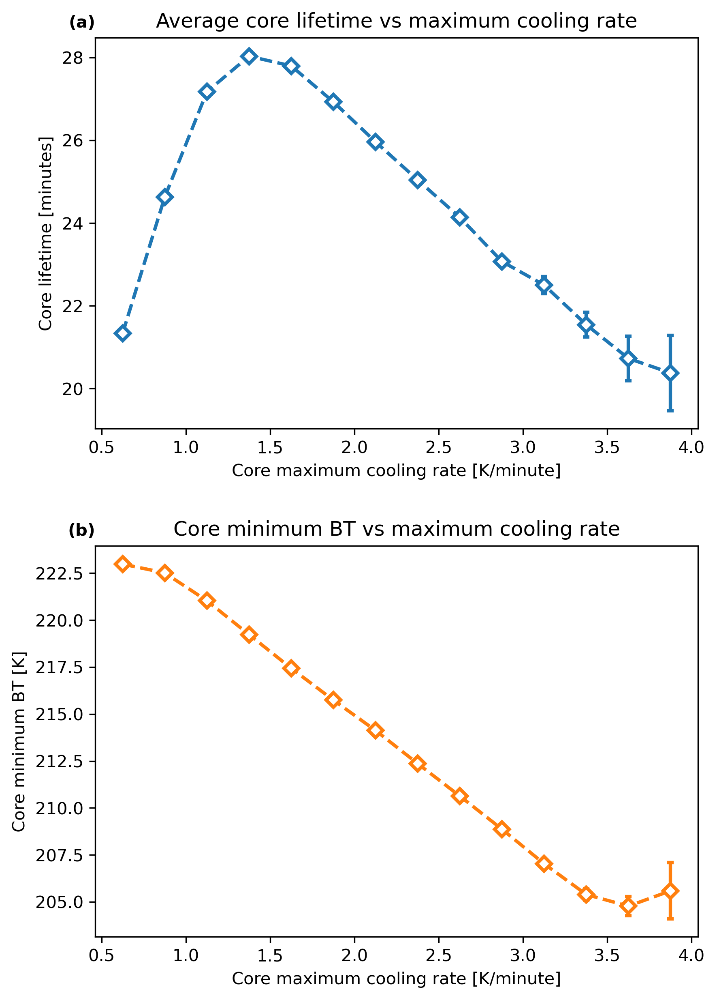

In [46]:
fig = plt.figure(dpi=dpi, figsize=(6.4,9.6))

ax = plt.subplot(211)

binned_plot(
    core_cooling_rate[core_is_valid], core_lifetime_minutes[core_is_valid], cooling_rate_bins,
    color="C0", fmt="D--", mfc="white", ms=6, capsize=2, linewidth=2, mew=2,
)

plt.xlabel("Core maximum cooling rate [K/minute]")
plt.ylabel("Core lifetime [minutes]")
plt.title("Average core lifetime vs maximum cooling rate")
ax.set_title("(a)", loc="left", ha="right", weight="bold", fontsize=10)

ax = plt.subplot(212)
binned_plot(
    core_cooling_rate[core_is_valid], core_BT_min[core_is_valid], cooling_rate_bins,
    color="C1", fmt="D--", mfc="white", ms=6, capsize=2, linewidth=2, mew=2
)

plt.xlabel("Core maximum cooling rate [K/minute]")
plt.ylabel("Core minimum BT [K]")
plt.title("Core minimum BT vs maximum cooling rate")
ax.set_title("(b)", loc="left", ha="right", weight="bold", fontsize=10)

plt.subplots_adjust(hspace=0.3)

figure_list.append(plt.gcf())

In [47]:
# fig = plt.figure(dpi=dpi, figsize=(6.4,9.6))

# ax = plt.subplot(211)

# binned_plot(
#     core_max_area[core_is_valid], core_cooling_rate[core_is_valid], core_area_bins,
#     color="C3", fmt="D--", mfc="white", ms=8, capsize=4, linewidth=2, mew=2,
# )
# plt.xscale("log")

# plt.ylabel("Core maximum cooling rate [$K\,minute^{-1}$]")
# plt.xlabel("Core maximum area [$km^2$]")
# plt.title("Average core maximum cooling rate vs maximum area")
# ax.set_title("(a)", loc="left", ha="right", weight="bold", fontsize=10)

# ax = plt.subplot(212)
# binned_plot(
#     core_max_area[core_is_valid], core_BT_min[core_is_valid], core_area_bins,
#     color="C1", fmt="D--", mfc="white", ms=8, capsize=4, linewidth=2, mew=2
# )
# plt.xscale("log")

# plt.ylabel("Core minimum BT [$K$]")
# plt.xlabel("Core maximum area [$km^2$]")
# plt.title("Average core minimum BT vs maximum area")
# ax.set_title("(b)", loc="left", ha="right", weight="bold", fontsize=10)

# plt.subplots_adjust(hspace=0.3)

# figure_list.append(plt.gcf())

## Figure 5: Time of detection

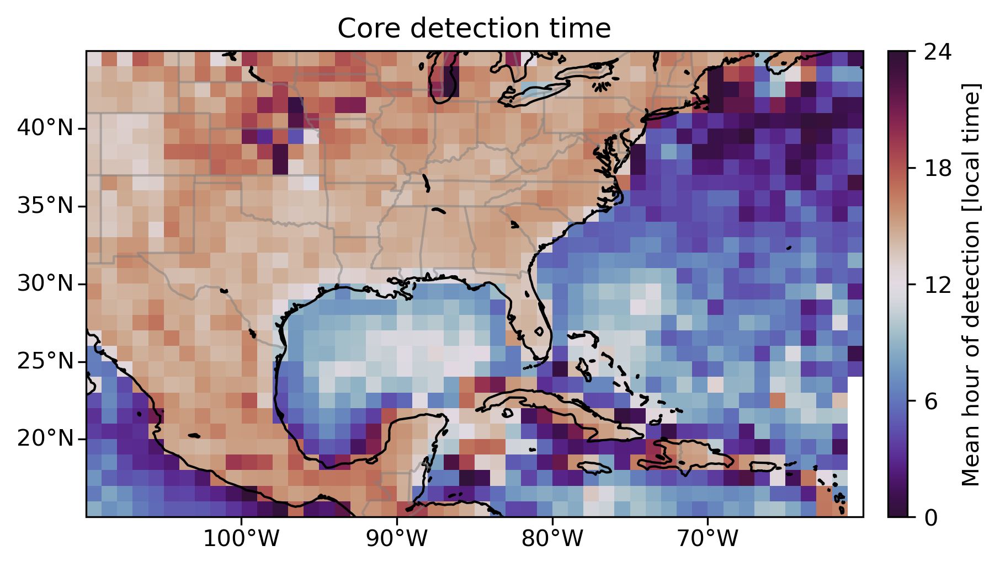

In [48]:
def circmean_hour(x):
    return circmean(x, high=24, low=0)

def circstd_hour(x):
    return circstd(x, high=24, low=0)


fig = plt.figure(dpi=dpi)

ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='gray', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
gl.xlines = False
gl.ylines = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

img_data = binned_statistic_2d(
    core_start_lon[core_is_valid], core_start_lat[core_is_valid], core_local_hour[core_is_valid], 
    bins=[np.arange(img_extent[0],img_extent[1]+1), np.arange(img_extent[2],img_extent[3]+1)], 
    statistic=circmean_hour
)
img = ax.imshow(img_data[0].T[::-1], extent=img_extent, vmin=0, vmax=24, cmap="twilight_shifted")

ax_divider = make_axes_locatable(ax)
cbar_size="2.5%"
cbar_pad=0.15
cax_r = ax_divider.new_horizontal(size=cbar_size, pad=cbar_pad, axes_class=plt.Axes)
fig.add_axes(cax_r)
cbar = plt.colorbar(img, cax=cax_r, label="Mean hour of detection [local time]")
cbar.set_ticks([0,6,12,18,24])

ax.set_title("Core detection time")

plt.draw()
add_gl_ticks(ax, gl)

figure_list.append(plt.gcf())

In [49]:
# fig = plt.figure(dpi=dpi)
# ax = plt.subplot(111)

# wh_sea_valid = np.logical_and(core_is_valid, core_sea_mask)
# h_sea = ax.hist(
#     core_local_hour[wh_sea_valid],
#     bins=range(0,25), 
#     weights=np.full((np.sum(wh_sea_valid),), 1/np.sum(wh_sea_valid)), 
#     alpha=0.5, facecolor="C0", edgecolor="C0", ls='solid', lw=3, histtype='stepfilled'
# )

# wh_land_valid = np.logical_and(core_is_valid, ~core_sea_mask)
# h_land = ax.hist(
#     core_local_hour[wh_land_valid],
#     bins=range(0,25), 
#     weights=np.full((np.sum(wh_land_valid),), 1/np.sum(wh_land_valid)), 
#     alpha=0.5, facecolor="C1", edgecolor="C1", ls='solid', lw=3, histtype='stepfilled'
# )

# plt.legend(["Sea", "Land"])
# ax.set_xlim([0,24])
# ax.set_xticks(range(0,25,3))
# ax.set_xlabel("Hour of day [local time]")
# ax.set_ylabel("Proportion")
# ax.set_title("Land-Sea contrast in core detection time")

# figure_list.append(plt.gcf())

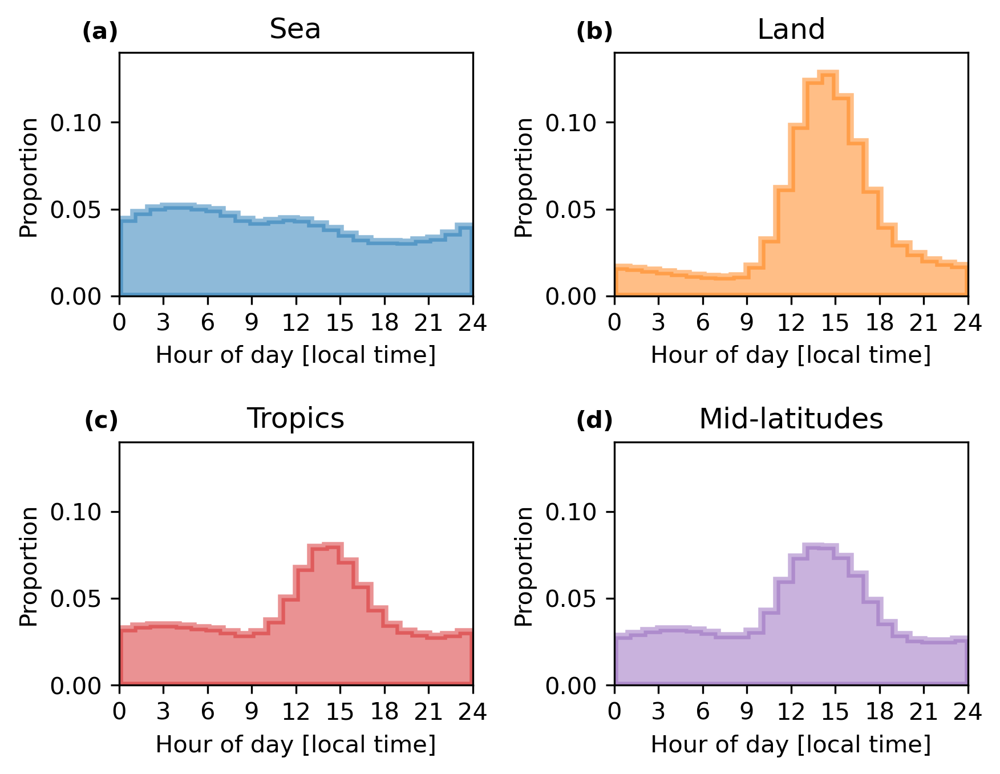

In [50]:
from scipy.stats import binned_statistic, binned_statistic_2d, circmean, circstd

fig = plt.figure(dpi=dpi)

ax = plt.subplot(221)

wh_sea_valid = np.logical_and(core_is_valid, core_sea_mask)
ch_sea = ax.hist(core_local_hour[wh_sea_valid],
    bins=range(0,25), 
    weights=np.full((np.sum(wh_sea_valid),), 1/np.sum(wh_sea_valid)), 
    alpha=0.5, facecolor="C0", edgecolor="C0", ls='solid', lw=3, histtype='stepfilled'
)

ax.set_xlim([0,24])
ax.set_xticks(range(0,25,3))
ax.set_xlabel("Hour of day [local time]")
ax.set_ylabel("Proportion")
ax.set_ylim([0,0.14])
ax.set_title("Sea")
ax.set_title("(a)", loc="left", ha="right", weight="bold", fontsize=10)


ax = plt.subplot(222)

wh_land_valid = np.logical_and(core_is_valid, ~core_sea_mask)
h_land = ax.hist(
    core_local_hour[wh_land_valid],
    bins=range(0,25), 
    weights=np.full((np.sum(wh_land_valid),), 1/np.sum(wh_land_valid)), 
    alpha=0.5, facecolor="C1", edgecolor="C1", ls='solid', lw=3, histtype='stepfilled'
)

ax.set_xlim([0,24])
ax.set_xticks(range(0,25,3))
ax.set_xlabel("Hour of day [local time]")
ax.set_ylabel("Proportion")
ax.set_ylim([0,0.14])
ax.set_title("Land")
ax.set_title("(b)", loc="left", ha="right", weight="bold", fontsize=10)


ax = plt.subplot(223)

wh_tropics_valid = np.logical_and(core_is_valid, core_start_lat<=30)
h_tropics = ax.hist(
    core_local_hour[wh_tropics_valid],
    bins=range(0,25), 
    weights=np.full((np.sum(wh_tropics_valid),), 1/np.sum(wh_tropics_valid)), 
    alpha=0.5, facecolor="C3", edgecolor="C3", ls='solid', lw=3, histtype='stepfilled'
)

ax.set_xlim([0,24])
ax.set_xticks(range(0,25,3))
ax.set_xlabel("Hour of day [local time]")
ax.set_ylabel("Proportion")
ax.set_ylim([0,0.14])
ax.set_title("Tropics")
ax.set_title("(c)", loc="left", ha="right", weight="bold", fontsize=10)


ax = plt.subplot(224)

wh_midlats_valid = np.logical_and(core_is_valid, core_start_lat>30)
h_land = ax.hist(
    core_local_hour[wh_midlats_valid],
    bins=range(0,25), 
    weights=np.full((np.sum(wh_midlats_valid),), 1/np.sum(wh_midlats_valid)), 
    alpha=0.5, facecolor="C4", edgecolor="C4", ls='solid', lw=3, histtype='stepfilled'
)

ax.set_xlim([0,24])
ax.set_xticks(range(0,25,3))
ax.set_xlabel("Hour of day [local time]")
ax.set_ylabel("Proportion")
ax.set_ylim([0,0.14])
ax.set_title("Mid-latitudes")
ax.set_title("(d)", loc="left", ha="right", weight="bold", fontsize=10)

plt.subplots_adjust(hspace=0.6, wspace=0.4)

figure_list.append(plt.gcf())

In [51]:
# Onshore/offshore breeze effect
lsm_distance = ndi.distance_transform_edt(~wh_sea)*9.6
lsm_distance -= ndi.distance_transform_edt(wh_sea)*9.6
wh_coastal = xr.zeros_like(wh_sea)
wh_coastal.data = ndi.binary_opening(np.logical_and(lsm_distance<=200, ~wh_sea))

lsm_distance_ds = xr.zeros_like(wh_sea)
lsm_distance_ds.data = lsm_distance_ds.data.astype(float)
lsm_distance_ds.data = lsm_distance
core_lsm_distance = lsm_distance_ds.sel(
    lon=xr.DataArray(core_start_lon, dims="points"), 
    lat=xr.DataArray(core_start_lat, dims="points"), 
method="nearest").data

r_gulf = xr.zeros_like(wh_sea)
r_gulf.loc[-100:-81, 22.5:30] = wh_sea.loc[-100:-81, 22.5:30]

core_is_gulf = r_gulf.T[::-1].sel(
    lon=xr.DataArray(core_start_lon, dims="points"), 
    lat=xr.DataArray(core_start_lat, dims="points"), 
method="nearest").data
core_is_gulf = np.logical_and(core_is_gulf, core_is_valid)

r_gulf_coast = xr.zeros_like(wh_coastal)
r_gulf_coast.loc[-105:-80, 25:32.5] = wh_coastal.loc[-105:-80, 25:32.5]

core_is_coast = r_gulf_coast.T[::-1].sel(
    lon=xr.DataArray(core_start_lon, dims="points"), 
    lat=xr.DataArray(core_start_lat, dims="points"), 
method="nearest").data
core_is_coast = np.logical_and(core_is_coast, core_is_valid)


In [52]:
# NGP vs extra-tropical inland
# Inland regions
wh_inland = xr.zeros_like(wh_sea)
wh_inland.data = ndi.binary_opening(np.logical_and(lsm_distance>=200, ~wh_sea))
wh_inland.loc[-120:-60, 15:30] = 0

wh_NGP = xr.zeros_like(wh_sea)
wh_NGP.loc[-100:-90, 37:47] = wh_inland.loc[-100:-90, 37:47]

core_is_inland = wh_inland.T[::-1].sel(
    lon=xr.DataArray(core_start_lon, dims="points"), 
    lat=xr.DataArray(core_start_lat, dims="points"), 
method="nearest").data
core_is_inland = np.logical_and(core_is_inland, core_is_valid)

core_is_NGP = wh_NGP.T[::-1].sel(
    lon=xr.DataArray(core_start_lon, dims="points"), 
    lat=xr.DataArray(core_start_lat, dims="points"), 
method="nearest").data
core_is_NGP = np.logical_and(core_is_NGP, core_is_valid)


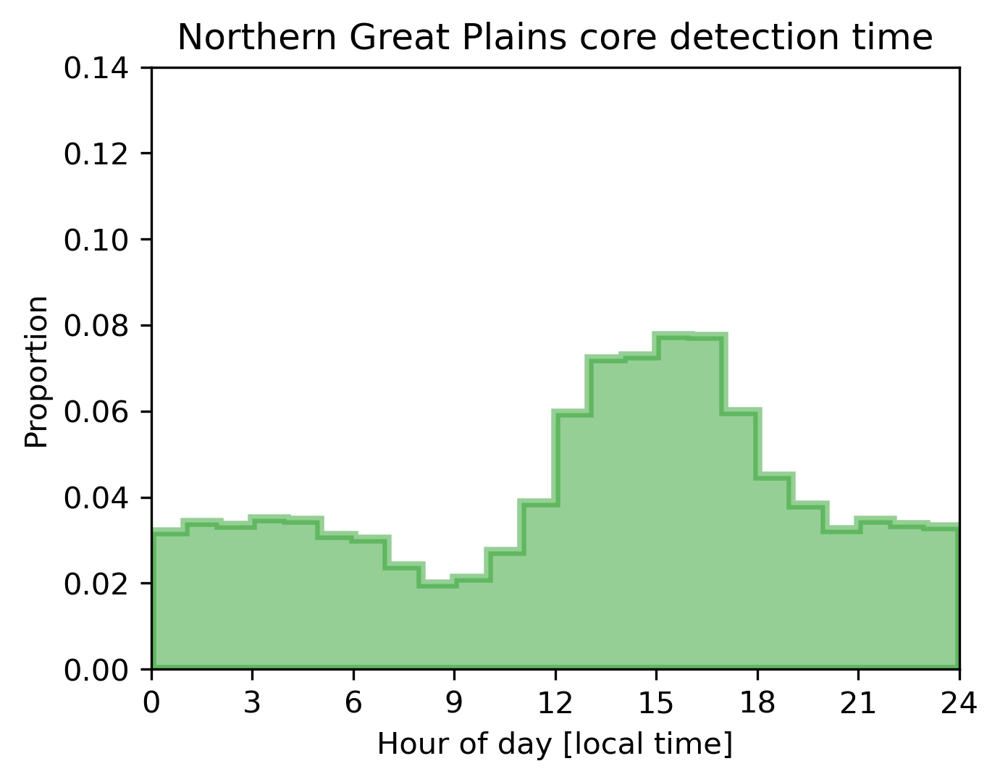

In [53]:
fig = plt.figure(dpi=dpi, figsize=(4.8,3.6))
ax = plt.subplot(111)

# h_sea = ax.hist(
#     core_local_hour[core_is_inland],
#     bins=range(0,25), 
#     weights=np.full((np.sum(core_is_inland),), 1/np.sum(core_is_inland)), 
#     alpha=0.5, facecolor="C1", edgecolor="C1", ls='solid', lw=3, histtype='stepfilled'
# )

h_land = ax.hist(
    core_local_hour[core_is_NGP],
    bins=range(0,25), 
    weights=np.full((np.sum(core_is_NGP),), 1/np.sum(core_is_NGP)), 
    alpha=0.5, facecolor="C2", edgecolor="C2", ls='solid', lw=3, histtype='stepfilled'
)

# plt.legend(["All inland", "NGP"])
ax.set_xlim([0,24])
ax.set_xticks(range(0,25,3))
ax.set_xlabel("Hour of day [local time]")
ax.set_ylabel("Proportion")
ax.set_ylim([0,0.14])
ax.set_title("Northern Great Plains core detection time")

figure_list.append(plt.gcf())

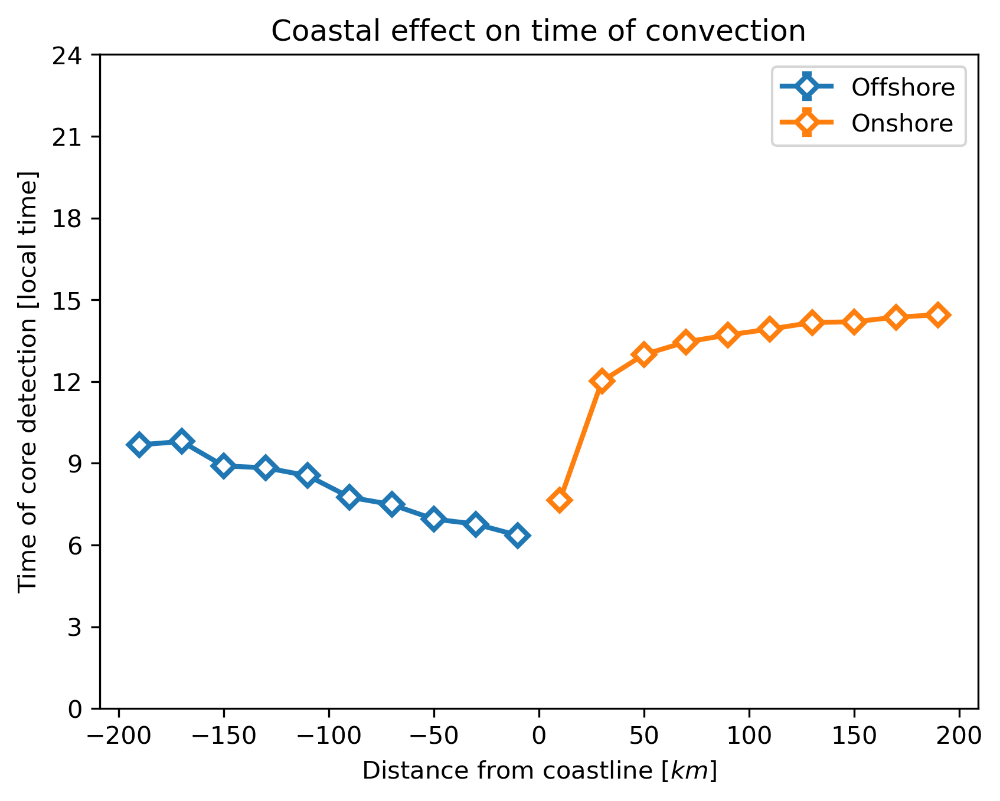

In [54]:
distance_bins = np.arange(-200,201,20)

def circmean_hour(x):
    return circmean(x, high=24, low=0)

def circstd_hour(x):
    return circstd(x, high=24, low=0)

fig = plt.figure(dpi=dpi)
ax = plt.subplot(111)

l_gulf = binned_plot(
    core_lsm_distance[core_is_gulf], core_local_hour[core_is_gulf], distance_bins, statistic=circmean_hour,stat_func=circstd_hour,
    color="C0", fmt="D-", mfc="white", ms=6, capsize=2, linewidth=2, mew=2,
)

l_coast = binned_plot(
    core_lsm_distance[core_is_coast], core_local_hour[core_is_coast], distance_bins, statistic=circmean_hour,stat_func=circstd_hour,
    color="C1", fmt="D-", mfc="white", ms=6, capsize=2, linewidth=2, mew=2,
)


ax.set_xlabel("Distance from coastline [$km$]")
ax.set_yticks(range(0,25,3))
ax.set_ylim([0,24])
ax.set_ylabel("Time of core detection [local time]")
ax.set_title("Coastal effect on time of convection")
plt.legend([l_gulf, l_coast], ["Offshore", "Onshore"])

figure_list.append(plt.gcf())

## Change in core cooling rate with diurnal cycle

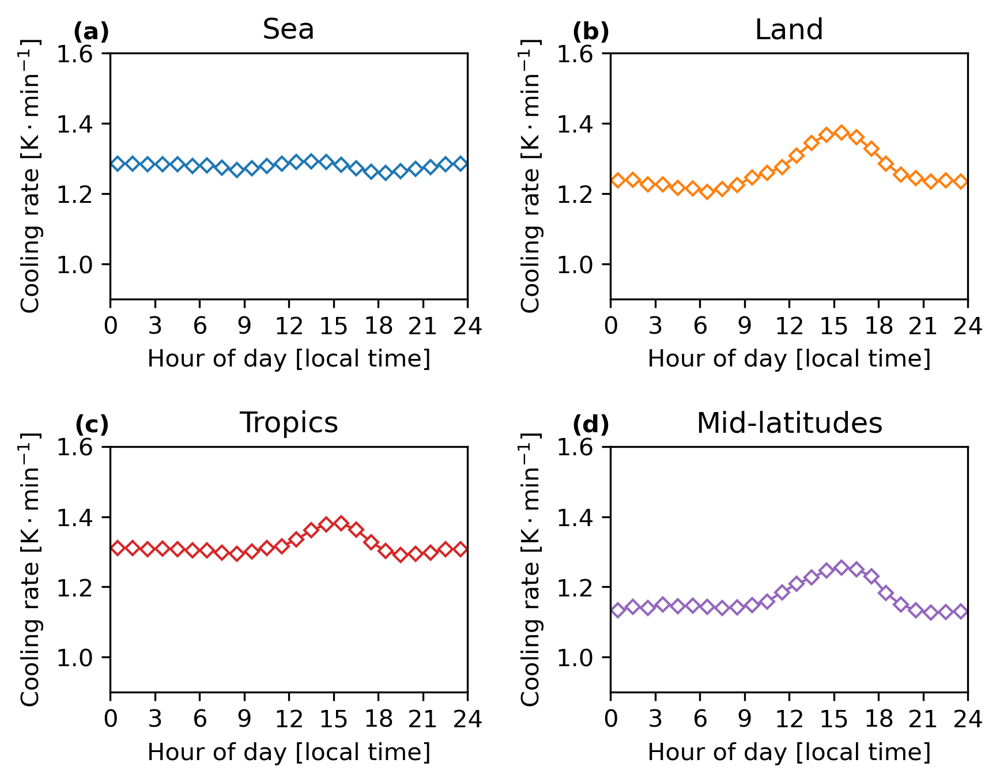

In [55]:
fig = plt.figure(dpi=dpi)

ax = plt.subplot(221)

wh_sea_valid = np.logical_and(core_is_valid, core_sea_mask)

# plt.errorbar(
#     np.arange(24)+0.5, 
#     binned_statistic(core_local_hour[wh_sea_valid], core_cooling_rate[wh_sea_valid], statistic=circmean_hour, bins=range(0,25))[0],
#     binned_statistic(core_local_hour[wh_sea_valid], core_cooling_rate[wh_sea_valid], statistic=circstd_hour, bins=range(0,25))[0],
#     fmt="C0D", mfc="white", ms=4, capsize=2, linewidth=1, mew=1,
# )
binned_plot(
    core_local_hour[wh_sea_valid], core_cooling_rate[wh_sea_valid], np.arange(0,25), statistic=circmean_hour,stat_func=circstd_hour,
    color="C0", fmt="D-", mfc="white", ms=4, capsize=2, linewidth=1, mew=1,
)

ax.set_xlim([0,24])
ax.set_xticks(range(0,25,3))
ax.set_xlabel("Hour of day [local time]")
ax.set_ylabel("Cooling rate [$\mathrm{K\cdot min^{-1}}$]")
ax.set_ylim([0.9,1.6])
ax.set_title("Sea")
ax.set_title("(a)", loc="left", ha="right", weight="bold", fontsize=10)


ax = plt.subplot(222)

wh_land_valid = np.logical_and(core_is_valid, ~core_sea_mask)
# plt.errorbar(
#     np.arange(24)+0.5, 
#     binned_statistic(core_local_hour[wh_land_valid], core_cooling_rate[wh_land_valid], statistic=circmean_hour, bins=range(0,25))[0],
#     binned_statistic(core_local_hour[wh_land_valid], core_cooling_rate[wh_land_valid], statistic=circstd_hour, bins=range(0,25))[0],
#     fmt="C1D", mfc="white", ms=4, capsize=2, linewidth=1, mew=1,
# )
binned_plot(
    core_local_hour[wh_land_valid], core_cooling_rate[wh_land_valid], np.arange(0,25), statistic=circmean_hour,stat_func=circstd_hour,
    color="C1", fmt="D-", mfc="white", ms=4, capsize=2, linewidth=1, mew=1,
)

ax.set_xlim([0,24])
ax.set_xticks(range(0,25,3))
ax.set_xlabel("Hour of day [local time]")
ax.set_ylabel("Cooling rate [$\mathrm{K\cdot min^{-1}}$]")
ax.set_ylim([0.9,1.6])
ax.set_title("Land")
ax.set_title("(b)", loc="left", ha="right", weight="bold", fontsize=10)


ax = plt.subplot(223)

wh_tropics_valid = np.logical_and(core_is_valid, core_start_lat<=30)
# plt.errorbar(
#     np.arange(24)+0.5, 
#     binned_statistic(core_local_hour[wh_tropics_valid], core_cooling_rate[wh_tropics_valid], statistic=circmean_hour, bins=range(0,25))[0],
#     binned_statistic(core_local_hour[wh_tropics_valid], core_cooling_rate[wh_tropics_valid], statistic=circstd_hour, bins=range(0,25))[0],
#     fmt="C3D", mfc="white", ms=4, capsize=2, linewidth=1, mew=1,
# )
binned_plot(
    core_local_hour[wh_tropics_valid], core_cooling_rate[wh_tropics_valid], np.arange(0,25), statistic=circmean_hour,stat_func=circstd_hour,
    color="C3", fmt="D-", mfc="white", ms=4, capsize=2, linewidth=1, mew=1,
)

ax.set_xlim([0,24])
ax.set_xticks(range(0,25,3))
ax.set_xlabel("Hour of day [local time]")
ax.set_ylabel("Cooling rate [$\mathrm{K\cdot min^{-1}}$]")
ax.set_ylim([0.9,1.6])
ax.set_title("Tropics")
ax.set_title("(c)", loc="left", ha="right", weight="bold", fontsize=10)


ax = plt.subplot(224)

wh_midlats_valid = np.logical_and(core_is_valid, core_start_lat>30)
# plt.errorbar(
#     np.arange(24)+0.5, 
#     binned_statistic(core_local_hour[wh_midlats_valid], core_cooling_rate[wh_midlats_valid], statistic=circmean_hour, bins=range(0,25))[0],
#     binned_statistic(core_local_hour[wh_midlats_valid], core_cooling_rate[wh_midlats_valid], statistic=circstd_hour, bins=range(0,25))[0],
#     fmt="C4D", mfc="white", ms=4, capsize=2, linewidth=1, mew=1,
# )
binned_plot(
    core_local_hour[wh_midlats_valid], core_cooling_rate[wh_midlats_valid], np.arange(0,25), statistic=circmean_hour,stat_func=circstd_hour,
    color="C4", fmt="D-", mfc="white", ms=4, capsize=2, linewidth=1, mew=1,
)

ax.set_xlim([0,24])
ax.set_xticks(range(0,25,3))
ax.set_xlabel("Hour of day [local time]")
ax.set_ylabel("Cooling rate [$\mathrm{K\cdot min^{-1}}$]")
ax.set_ylim([0.9,1.6])
ax.set_title("Mid-latitudes")
ax.set_title("(d)", loc="left", ha="right", weight="bold", fontsize=10)

plt.subplots_adjust(hspace=0.6, wspace=0.4)

figure_list.append(plt.gcf())

# Anvils

In [56]:
anvil_number_of_cores = np.concatenate([ds.anvil_core_count.data for ds in datasets])

anvil_max_area = np.concatenate([ds.thick_anvil_max_area.data for ds in datasets])
thin_anvil_max_area = np.concatenate([ds.thin_anvil_max_area.data for ds in datasets])

anvil_lifetime = np.concatenate([ds.thick_anvil_lifetime.data for ds in datasets]).astype("timedelta64[s]").astype(int)/3600

anvil_total_area = np.concatenate([ds.thick_anvil_total_area.data for ds in datasets])
thin_anvil_total_area = np.concatenate([ds.thin_anvil_total_area.data for ds in datasets])

anvil_ctt_mean = np.concatenate([ds.thick_anvil_BT_mean.data for ds in datasets])
anvil_ctt_min = np.concatenate([ds.thick_anvil_BT_min.data for ds in datasets])

initial_core_cooling_rate = np.concatenate([ds.core_cooling_rate.loc[ds.anvil_initial_core_index].data for ds in datasets])


In [57]:
anvil_has_multiple_cores = np.logical_and(anvil_is_valid, anvil_number_of_cores > 1)

In [58]:
def anvil_initiation_t(ds):
    return np.minimum(
        ds.core_start_t.loc[ds.anvil_initial_core_index.data].data, 
        ds.thick_anvil_start_t.data
    )

anvil_time_to_min_BT = np.concatenate([ds.thick_anvil_min_BT_t.data - anvil_initiation_t(ds) for ds in datasets]).astype("timedelta64[s]").astype(int)/3600
anvil_time_to_max_thick_area = np.concatenate([ds.thick_anvil_max_area_t.data - anvil_initiation_t(ds) for ds in datasets]).astype("timedelta64[s]").astype(int)/3600
anvil_time_to_max_thin_area = np.concatenate([ds.thin_anvil_max_area_t.data - anvil_initiation_t(ds) for ds in datasets]).astype("timedelta64[s]").astype(int)/3600
thick_anvil_lifetime = np.concatenate([ds.thick_anvil_end_t.data - anvil_initiation_t(ds)for ds in datasets]).astype("timedelta64[s]").astype(int)/3600
thin_anvil_lifetime = np.concatenate([ds.thin_anvil_end_t.data - anvil_initiation_t(ds) for ds in datasets]).astype("timedelta64[s]").astype(int)/3600


## Figure 10 : Observed anvils by season

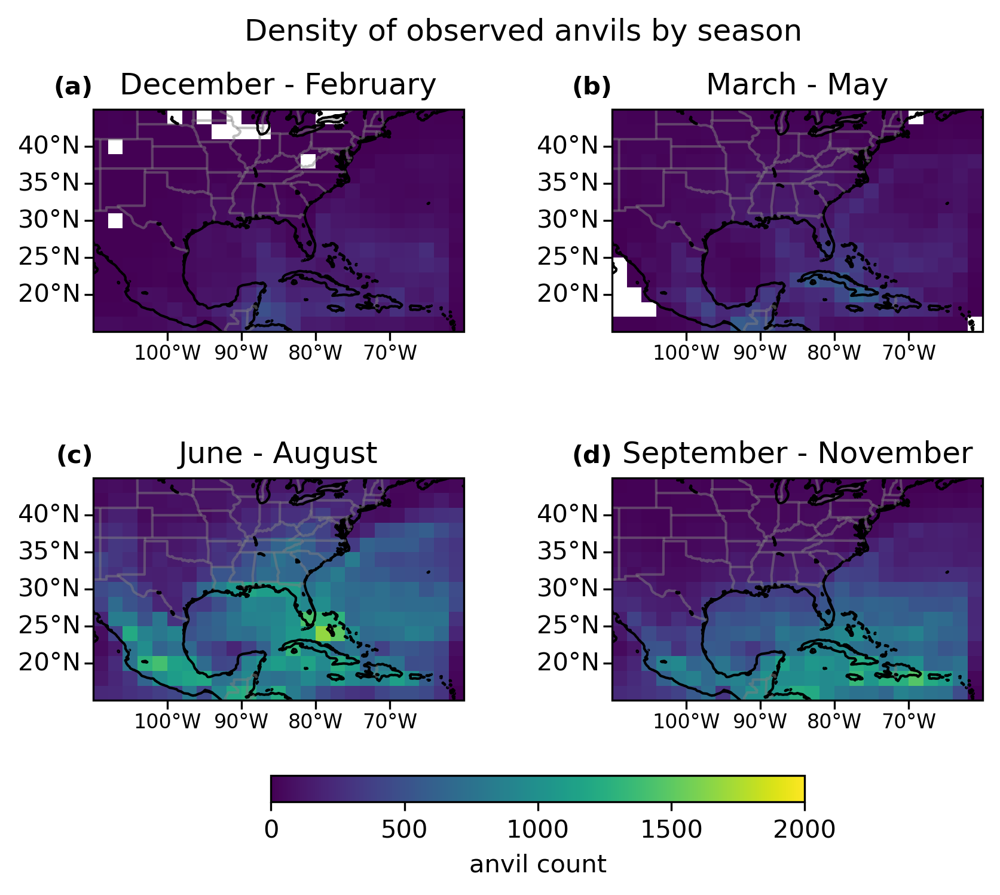

In [59]:
max_count = 2000
min_count = 0

fig, axes = plt.subplots(2, 2, dpi=dpi, figsize=(6.4,5.6), subplot_kw={"projection":ccrs.PlateCarree()})

anvil_bins = [
    np.arange(img_extent[0], img_extent[1]+1, 2), 
    np.arange(img_extent[2], img_extent[3]+1, 2)
]

ax1 = axes[0,0]
ax1.coastlines()
ax1.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax1.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax1.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax1.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='gray', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
gl.xlines = False
gl.ylines = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'size': 8, 'color': 'k', 'rotation':0, 'ha':'center'}

wh_djf = np.array([True if t in [1,2,12] else False for t in anvil_month ])
h = ax1.hist2d(np.array(anvil_start_lon)[np.logical_and(wh_djf, anvil_is_valid)], 
               np.array(anvil_start_lat)[np.logical_and(wh_djf, anvil_is_valid)], 
               bins=anvil_bins, cmin=1, vmax=max_count, vmin=min_count)
# plt.colorbar(h[3], label="anvil count")
ax1.set_title("December - February")
ax1.set_title("(a)", loc="left", ha="right", weight="bold", fontsize=10)

ax2 = axes[0,1]
ax2.coastlines()
ax2.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax2.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax2.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax2.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='gray', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
gl.xlines = False
gl.ylines = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'size': 8, 'color': 'k', 'rotation':0, 'ha':'center'}

wh_mam = np.array([True if t in [3,4,5] else False for t in anvil_month ])
h = ax2.hist2d(np.array(anvil_start_lon)[np.logical_and(wh_mam, anvil_is_valid)], 
               np.array(anvil_start_lat)[np.logical_and(wh_mam, anvil_is_valid)], 
               bins=anvil_bins, cmin=1, vmax=max_count, vmin=min_count)
# plt.colorbar(h[3], label="anvil count")
ax2.set_title("March - May")
ax2.set_title("(b)", loc="left", ha="right", weight="bold", fontsize=10)

ax3 = axes[1,0]
ax3.coastlines()
ax3.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax3.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax3.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax3.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='gray', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
gl.xlines = False
gl.ylines = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'size': 8, 'color': 'k', 'rotation':0, 'ha':'center'}

wh_jja = np.array([True if t in [6,7,8] else False for t in anvil_month ])
h = ax3.hist2d(np.array(anvil_start_lon)[np.logical_and(wh_jja, anvil_is_valid)], 
               np.array(anvil_start_lat)[np.logical_and(wh_jja, anvil_is_valid)], 
               bins=anvil_bins, cmin=1, vmax=max_count, vmin=min_count)
# plt.colorbar(h[3], label="anvil count")
ax3.set_title("June - August")
ax3.set_title("(c)", loc="left", ha="right", weight="bold", fontsize=10)

ax4 = axes[1,1]
ax4.coastlines()
ax4.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax4.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax4.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax4.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='gray', alpha=0.5, linestyle='--', fontsize=8
)
gl.top_labels = False
gl.right_labels = False
gl.xlines = False
gl.ylines = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'size': 8, 'color': 'k', 'rotation':0, 'ha':'center'}

wh_son = np.array([True if t in [9,10,11] else False for t in anvil_month ])
h = ax4.hist2d(np.array(anvil_start_lon)[np.logical_and(wh_son, anvil_is_valid)], 
               np.array(anvil_start_lat)[np.logical_and(wh_son, anvil_is_valid)], 
               bins=anvil_bins, cmin=1, vmax=max_count, vmin=min_count)
# plt.colorbar(h[3], label="anvil count")
ax4.set_title("September - November")
ax4.set_title("(d)", loc="left", ha="right", weight="bold", fontsize=10)

plt.suptitle("Density of observed anvils by season")

fig.colorbar(h[3], ax=axes[:, :], shrink=0.6, location='bottom', label="anvil count")

plt.subplots_adjust(hspace=0.3, wspace=0.4, bottom=0.3, top=0.95)

plt.draw()
add_gl_ticks(ax1, gl)
add_gl_ticks(ax2, gl)
add_gl_ticks(ax3, gl)
add_gl_ticks(ax4, gl)

figure_list.append(plt.gcf())

In [60]:
anvil_sea_mask = wh_sea.T[::-1].sel(
    lon=xr.DataArray(anvil_start_lon, dims="points"), 
    lat=xr.DataArray(anvil_start_lat, dims="points"), 
method="nearest").data

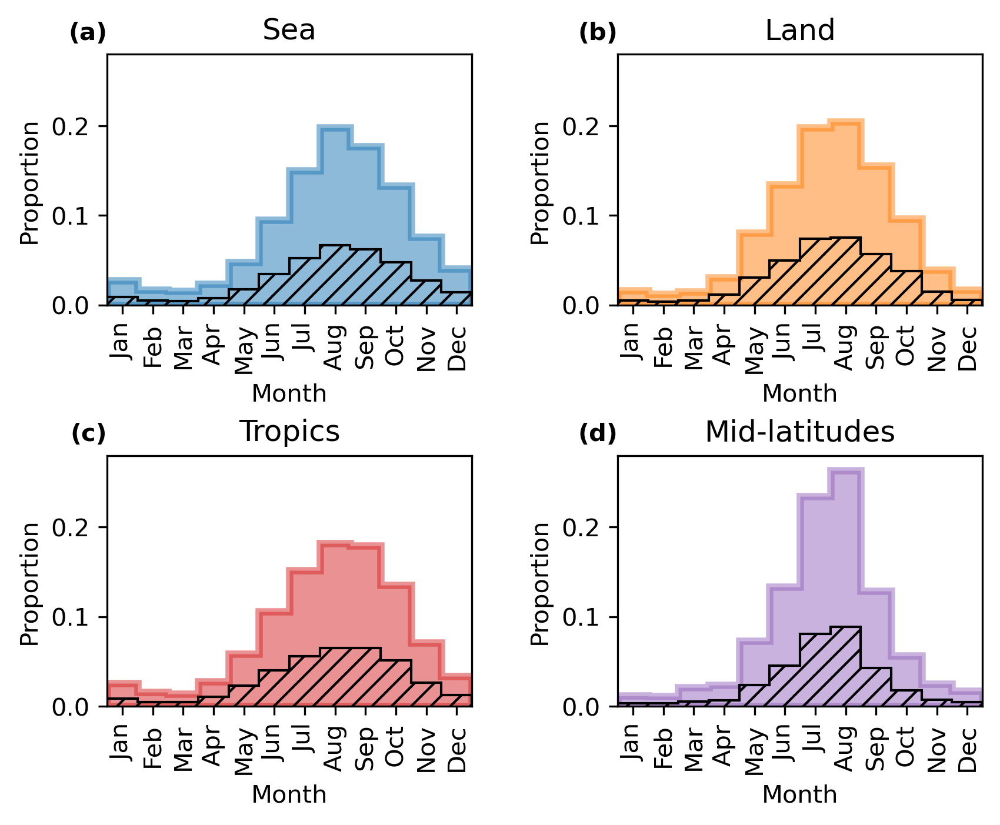

In [61]:
fig = plt.figure(dpi=dpi)

ax = plt.subplot(221)

wh_sea_valid = np.logical_and(anvil_is_valid, anvil_sea_mask)
h_sea = ax.hist(
    anvil_month[wh_sea_valid],
    bins=range(0,14), 
    weights=np.full((np.sum(wh_sea_valid),), 1/np.sum(wh_sea_valid)), 
    alpha=0.5, facecolor="C0", edgecolor="C0", ls='solid', lw=3, histtype='stepfilled'
)
ax.hist(
    anvil_month[wh_sea_valid & anvil_has_multiple_cores], 
    bins=range(0,14), 
    weights=np.full((np.sum(wh_sea_valid & anvil_has_multiple_cores),), 1/np.sum(wh_sea_valid)), 
    histtype='step', linewidth=1, facecolor='none', 
    hatch='///', edgecolor='k', fill=True
)
ax.set_xlim([1,13])
ax.set_xticks(
    np.arange(1.5,13), 
    ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"],
    rotation=90
)
ax.set_xlabel("Month")
ax.set_ylabel("Proportion")
ax.set_ylim([0,0.28])
ax.set_title("Sea")
ax.set_title("(a)", loc="left", ha="right", weight="bold", fontsize=10)


ax = plt.subplot(222)

wh_land_valid = np.logical_and(anvil_is_valid, ~anvil_sea_mask)
h_land = ax.hist(
    anvil_month[wh_land_valid],
    bins=range(0,14), 
    weights=np.full((np.sum(wh_land_valid),), 1/np.sum(wh_land_valid)), 
    alpha=0.5, facecolor="C1", edgecolor="C1", ls='solid', lw=3, histtype='stepfilled'
)
ax.hist(
    anvil_month[wh_land_valid & anvil_has_multiple_cores], 
    bins=range(0,14), 
    weights=np.full((np.sum(wh_land_valid & anvil_has_multiple_cores),), 1/np.sum(wh_land_valid)), 
    histtype='step', linewidth=1, facecolor='none', 
    hatch='///', edgecolor='k', fill=True
)

ax.set_xlim([1,13])
ax.set_xticks(
    np.arange(1.5,13), 
    ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"],
    rotation=90
)
ax.set_xlabel("Month")
ax.set_ylabel("Proportion")
ax.set_ylim([0,0.28])
ax.set_title("Land")
ax.set_title("(b)", loc="left", ha="right", weight="bold", fontsize=10)


ax = plt.subplot(223)

wh_tropics_valid = np.logical_and(anvil_is_valid, anvil_start_lat<=30)
h_tropics = ax.hist(
    anvil_month[wh_tropics_valid],
    bins=range(0,14), 
    weights=np.full((np.sum(wh_tropics_valid),), 1/np.sum(wh_tropics_valid)), 
    alpha=0.5, facecolor="C3", edgecolor="C3", ls='solid', lw=3, histtype='stepfilled'
)
ax.hist(
    anvil_month[wh_tropics_valid & anvil_has_multiple_cores], 
    bins=range(0,14), 
    weights=np.full((np.sum(wh_tropics_valid & anvil_has_multiple_cores),), 1/np.sum(wh_tropics_valid)), 
    histtype='step', linewidth=1, facecolor='none', 
    hatch='///', edgecolor='k', fill=True
)
ax.set_xlim([1,13])
ax.set_xticks(
    np.arange(1.5,13), 
    ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"],
    rotation=90
)
ax.set_xlabel("Month")
ax.set_ylabel("Proportion")
ax.set_ylim([0,0.28])
ax.set_title("Tropics")
ax.set_title("(c)", loc="left", ha="right", weight="bold", fontsize=10)


ax = plt.subplot(224)

wh_midlats_valid = np.logical_and(anvil_is_valid, anvil_start_lat>30)
h_land = ax.hist(
    anvil_month[wh_midlats_valid],
    bins=range(0,14), 
    weights=np.full((np.sum(wh_midlats_valid),), 1/np.sum(wh_midlats_valid)), 
    alpha=0.5, facecolor="C4", edgecolor="C4", ls='solid', lw=3, histtype='stepfilled'
)
ax.hist(
    anvil_month[wh_midlats_valid & anvil_has_multiple_cores], 
    bins=range(0,14), 
    weights=np.full((np.sum(wh_midlats_valid & anvil_has_multiple_cores),), 1/np.sum(wh_midlats_valid)), 
    histtype='step', linewidth=1, facecolor='none', 
    hatch='///', edgecolor='k', fill=True
)
ax.set_xlim([1,13])
ax.set_xticks(
    np.arange(1.5,13), 
    ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"],
    rotation=90
)
ax.set_xlabel("Month")
ax.set_ylabel("Proportion")
ax.set_ylim([0,0.28])
ax.set_title("Mid-latitudes")
ax.set_title("(d)", loc="left", ha="right", weight="bold", fontsize=10)

plt.subplots_adjust(hspace=0.6, wspace=0.4)

figure_list.append(plt.gcf())

## Figure 13 : Anvil propagation

In [62]:
anvil_azimuths = np.concatenate([ds.anvil_propagation_direction for ds in datasets])
anvil_speed = np.concatenate([ds.anvil_propagation_speed for ds in datasets])

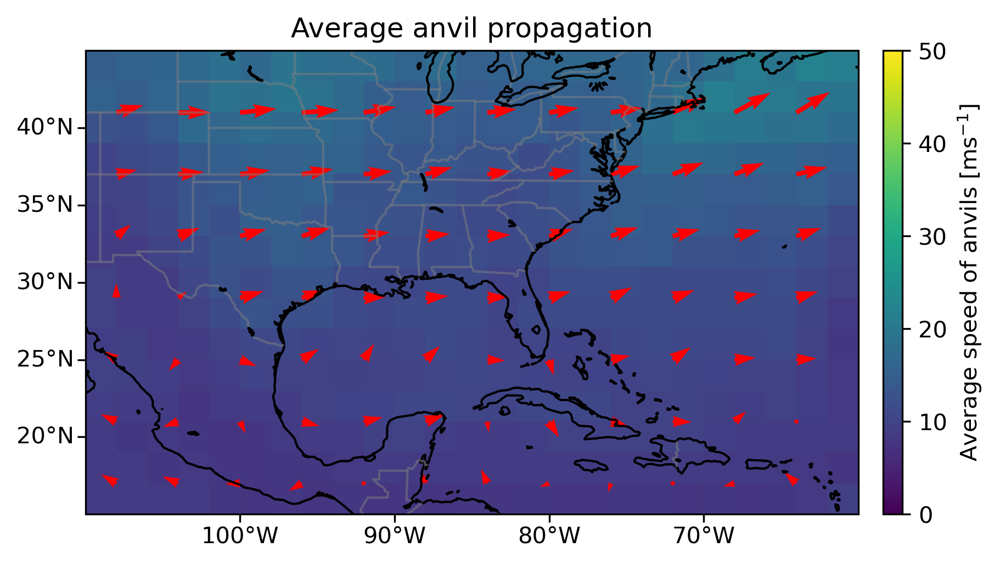

In [63]:
def circmean_degrees(x):
    return circmean(x, high=180, low=-180)

fig = plt.figure(dpi=dpi)

ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='gray', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
gl.xlines = False
gl.ylines = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

anvil_avg_speed = binned_statistic_2d(
    anvil_start_lon[anvil_is_valid], anvil_start_lat[anvil_is_valid], anvil_speed[anvil_is_valid], 
    bins=[
        np.arange(img_extent[0], img_extent[1]+1 ,2), 
        np.arange(img_extent[2], img_extent[3]+1 ,2)
    ], 
    statistic="mean"
)[0]
img = ax.imshow(anvil_avg_speed.T[::-1], extent=img_extent, vmin=0, vmax=50)


anvil_avg_angle = binned_statistic_2d(
    anvil_start_lon[anvil_is_valid], anvil_start_lat[anvil_is_valid], anvil_azimuths[anvil_is_valid], 
    bins=[
        np.arange(img_extent[0], img_extent[1]+1, 2), 
        np.arange(img_extent[2], img_extent[3]+1, 2)
    ], 
    statistic=circmean_degrees
)[0]
block_reduce_quiver(
    (np.arange(img_extent[0], img_extent[1], 2) + 1)[:-1], 
    (np.arange(img_extent[2], img_extent[3], 2) + 1)[:-1],
    (np.sin(np.deg2rad(anvil_avg_angle)) * anvil_avg_speed).T[:-1,:-1],
    (np.cos(np.deg2rad(anvil_avg_angle)) * anvil_avg_speed).T[:-1,:-1],
    spacing=2,
    block_method="reduce",
    color="r",
    scale=7.5, 
    width=0.3,
    scale_units="xy",
    units="xy"
)

ax_divider = make_axes_locatable(ax)
cbar_size="2.5%"
cbar_pad=0.15
cax_r = ax_divider.new_horizontal(size=cbar_size, pad=cbar_pad, axes_class=plt.Axes)
fig.add_axes(cax_r)
cbar = plt.colorbar(img, cax=cax_r, label="Average speed of anvils [$\mathrm{ms^{-1}}$]")

ax.set_title("Average anvil propagation")

plt.draw()
add_gl_ticks(ax, gl)

figure_list.append(plt.gcf())

## Figure 15: Anvil maximum area

In [64]:
anvil_max_area = np.concatenate([ds.thick_anvil_max_area for ds in datasets])


In [65]:
# fig = plt.figure(dpi=dpi)

# ax = plt.axes(projection=ccrs.PlateCarree())
# ax.coastlines()
# ax.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
# states_provinces = cfeature.NaturalEarthFeature(
#         category='cultural',
#         name='admin_1_states_provinces_lines',
#         scale='50m',
#         facecolor='none')
# ax.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
# ax.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
# gl = ax.gridlines(
#     crs=ccrs.PlateCarree(), draw_labels=True,
#     linewidth=1, color='gray', alpha=0.5, linestyle='--'
# )
# gl.top_labels = False
# gl.right_labels = False
# gl.xlines = False
# gl.ylines = False
# gl.xformatter = LONGITUDE_FORMATTER
# gl.yformatter = LATITUDE_FORMATTER

# img_data = binned_statistic_2d(
#     anvil_start_lon[anvil_is_valid], anvil_start_lat[anvil_is_valid], anvil_max_area[anvil_is_valid],
#     bins=[
#         np.arange(img_extent[0], img_extent[1]+1, 2), 
#         np.arange(img_extent[2], img_extent[3]+1, 2)
#     ], 
#     statistic="mean"
# )
# img = ax.imshow(img_data[0].T[::-1], extent=img_extent, vmin=0, vmax=10000)

# ax_divider = make_axes_locatable(ax)
# cbar_size="2.5%"
# cbar_pad=0.15
# cax_r = ax_divider.new_horizontal(size=cbar_size, pad=cbar_pad, axes_class=plt.Axes)
# fig.add_axes(cax_r)
# cbar = plt.colorbar(img, cax=cax_r, label="Mean maximum area [$km^2$]")

# ax.set_title("Average anvil maximum area")

# plt.draw()
# add_gl_ticks(ax, gl)

# figure_list.append(plt.gcf())

## Figure 12 : Average anvil lifetime

In [66]:
anvil_lifetime = np.concatenate([ds.thick_anvil_lifetime for ds in datasets])
anvil_lifetime_hours = anvil_lifetime.astype(int)/3.6e12

In [67]:
# fig = plt.figure(dpi=dpi)

# ax = plt.axes(projection=ccrs.PlateCarree())
# ax.coastlines()
# ax.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
# states_provinces = cfeature.NaturalEarthFeature(
#         category='cultural',
#         name='admin_1_states_provinces_lines',
#         scale='50m',
#         facecolor='none')
# ax.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
# ax.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
# gl = ax.gridlines(
#     crs=ccrs.PlateCarree(), draw_labels=True,
#     linewidth=1, color='gray', alpha=0.5, linestyle='--'
# )
# gl.top_labels = False
# gl.right_labels = False
# gl.xlines = False
# gl.ylines = False
# gl.xformatter = LONGITUDE_FORMATTER
# gl.yformatter = LATITUDE_FORMATTER

# from scipy.stats import binned_statistic_2d, circmean

# img_data = binned_statistic_2d(
#     anvil_start_lon[anvil_is_valid], anvil_start_lat[anvil_is_valid], anvil_lifetime_hours[anvil_is_valid],
#     bins=[
#         np.arange(img_extent[0], img_extent[1]+1, 2), 
#         np.arange(img_extent[2], img_extent[3]+1, 2)
#     ], 
#     statistic="mean"
# )
# img = ax.imshow(img_data[0].T[::-1], extent=img_extent, vmin=2, vmax=6)

# ax_divider = make_axes_locatable(ax)
# cbar_size="2.5%"
# cbar_pad=0.15
# cax_r = ax_divider.new_horizontal(size=cbar_size, pad=cbar_pad, axes_class=plt.Axes)
# fig.add_axes(cax_r)
# cbar = plt.colorbar(img, cax=cax_r, label="Mean anvil lifetime [$hours$]")
# cbar.set_ticks([2,3,4,5,6])

# ax.set_title("Average anvil lifetime")

# plt.draw()
# add_gl_ticks(ax, gl)

# figure_list.append(plt.gcf())

In [68]:
# fig = plt.figure(dpi=dpi)

# ax = plt.axes(projection=ccrs.PlateCarree())
# ax.coastlines()
# ax.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
# states_provinces = cfeature.NaturalEarthFeature(
#         category='cultural',
#         name='admin_1_states_provinces_lines',
#         scale='50m',
#         facecolor='none')
# ax.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
# ax.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
# gl = ax.gridlines(
#     crs=ccrs.PlateCarree(), draw_labels=True,
#     linewidth=1, color='gray', alpha=0.5, linestyle='--'
# )
# gl.top_labels = False
# gl.right_labels = False
# gl.xlines = False
# gl.ylines = False
# gl.xformatter = LONGITUDE_FORMATTER
# gl.yformatter = LATITUDE_FORMATTER

# from scipy.stats import binned_statistic_2d, circmean

# img_data = binned_statistic_2d(
#     anvil_start_lon[anvil_is_valid], anvil_start_lat[anvil_is_valid], anvil_ctt_mean[anvil_is_valid],
#     bins=[
#         np.arange(img_extent[0], img_extent[1]+1, 2), 
#         np.arange(img_extent[2], img_extent[3]+1, 2)
#     ], 
#     statistic="mean"
# )
# img = ax.imshow(img_data[0].T[::-1], extent=img_extent, cmap="viridis_r", vmin=229, vmax=241)

# ax_divider = make_axes_locatable(ax)
# cbar_size="2.5%"
# cbar_pad=0.15
# cax_r = ax_divider.new_horizontal(size=cbar_size, pad=cbar_pad, axes_class=plt.Axes)
# fig.add_axes(cax_r)
# cbar = plt.colorbar(img, cax=cax_r, label="Mean anvil BT [$K$]")
# # cbar.set_ticks([2,3,4,5,6])

# ax.set_title("Average anvil BT")

# plt.draw()
# add_gl_ticks(ax, gl)

# figure_list.append(plt.gcf())

## Figure 11: Average number of cores

In [69]:
# fig = plt.figure(dpi=dpi)

# ax = plt.axes(projection=ccrs.PlateCarree())
# ax.coastlines()
# ax.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
# states_provinces = cfeature.NaturalEarthFeature(
#         category='cultural',
#         name='admin_1_states_provinces_lines',
#         scale='50m',
#         facecolor='none')
# ax.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
# ax.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
# gl = ax.gridlines(
#     crs=ccrs.PlateCarree(), draw_labels=True,
#     linewidth=1, color='gray', alpha=0.5, linestyle='--'
# )
# gl.top_labels = False
# gl.right_labels = False
# gl.xlines = False
# gl.ylines = False
# gl.xformatter = LONGITUDE_FORMATTER
# gl.yformatter = LATITUDE_FORMATTER

# from scipy.stats import binned_statistic_2d, circmean

# img_data = binned_statistic_2d(
#     anvil_start_lon[anvil_is_valid], anvil_start_lat[anvil_is_valid], anvil_core_count[anvil_is_valid], 
#     bins=[np.arange(img_extent[0],img_extent[1]+1,2), 
#           np.arange(img_extent[2],img_extent[3]+1,2)], 
#     statistic="mean"
# )
# img = ax.imshow(img_data[0].T[::-1], extent=img_extent, vmin=1, vmax=5)

# ax_divider = make_axes_locatable(ax)
# cbar_size="2.5%"
# cbar_pad=0.15
# cax_r = ax_divider.new_horizontal(size=cbar_size, pad=cbar_pad, axes_class=plt.Axes)
# fig.add_axes(cax_r)
# cbar = plt.colorbar(img, cax=cax_r, label="Average number of cores")

# ax.set_title("Average number of cores per anvil")

# plt.draw()
# add_gl_ticks(ax, gl)

# figure_list.append(plt.gcf())

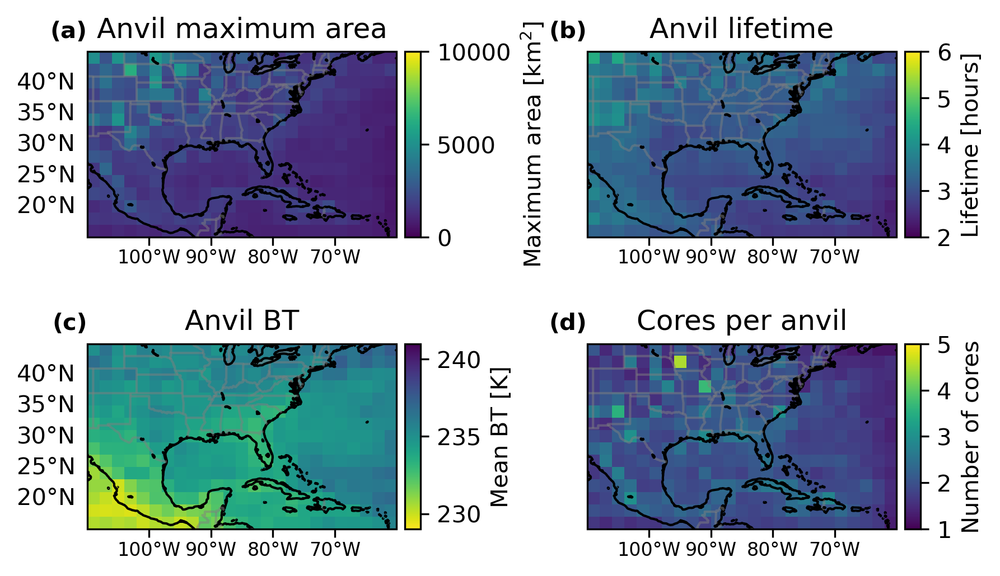

In [70]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, dpi=dpi, figsize=(6.4,4), subplot_kw={"projection":ccrs.PlateCarree()})

ax1.coastlines()
ax1.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax1.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax1.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax1.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='gray', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
gl.xlines = False
gl.ylines = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'size': 8, 'color': 'k', 'rotation':0, 'ha':'center'}

img_data = binned_statistic_2d(
    anvil_start_lon[anvil_is_valid], anvil_start_lat[anvil_is_valid], anvil_max_area[anvil_is_valid],
    bins=[
        np.arange(img_extent[0], img_extent[1]+1, 2), 
        np.arange(img_extent[2], img_extent[3]+1, 2)
    ], 
    statistic="mean"
)
img = ax1.imshow(img_data[0].T[::-1], extent=img_extent, vmin=0, vmax=10000)

ax_divider = make_axes_locatable(ax1)
cbar_size="5%"
cbar_pad=0.05
cax_r = ax_divider.new_horizontal(size=cbar_size, pad=cbar_pad, axes_class=plt.Axes)
fig.add_axes(cax_r)
cbar = plt.colorbar(img, cax=cax_r, label="Maximum area [$\mathrm{km^2}$]")
# cbar.ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

ax1.set_title("Anvil maximum area")
ax1.set_title("(a)", loc="left", ha="right", weight="bold", fontsize=10)

ax2.coastlines()
ax2.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax2.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax2.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax2.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='gray', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False
gl.xlines = False
gl.ylines = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'size': 8, 'color': 'k', 'rotation':0, 'ha':'center'}

from scipy.stats import binned_statistic_2d, circmean

img_data = binned_statistic_2d(
    anvil_start_lon[anvil_is_valid], anvil_start_lat[anvil_is_valid], anvil_lifetime_hours[anvil_is_valid],
    bins=[
        np.arange(img_extent[0], img_extent[1]+1, 2), 
        np.arange(img_extent[2], img_extent[3]+1, 2)
    ], 
    statistic="mean"
)
img = ax2.imshow(img_data[0].T[::-1], extent=img_extent, vmin=2, vmax=6)

ax_divider = make_axes_locatable(ax2)
cbar_size="5%"
cbar_pad=0.05
cax_r = ax_divider.new_horizontal(size=cbar_size, pad=cbar_pad, axes_class=plt.Axes)
fig.add_axes(cax_r)
cbar = plt.colorbar(img, cax=cax_r, label="Lifetime [hours]")
cbar.set_ticks([2,3,4,5,6])

ax2.set_title("Anvil lifetime")
ax2.set_title("(b)", loc="left", ha="right", weight="bold", fontsize=10)

ax3.coastlines()
ax3.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax3.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax3.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax3.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='gray', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
gl.xlines = False
gl.ylines = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'size': 8, 'color': 'k', 'rotation':0, 'ha':'center'}

from scipy.stats import binned_statistic_2d, circmean

img_data = binned_statistic_2d(
    anvil_start_lon[anvil_is_valid], anvil_start_lat[anvil_is_valid], anvil_ctt_mean[anvil_is_valid],
    bins=[
        np.arange(img_extent[0], img_extent[1]+1, 2), 
        np.arange(img_extent[2], img_extent[3]+1, 2)
    ], 
    statistic="mean"
)
img = ax3.imshow(img_data[0].T[::-1], extent=img_extent, cmap="viridis_r", vmin=229, vmax=241)

ax_divider = make_axes_locatable(ax3)
cbar_size="5%"
cbar_pad=0.05
cax_r = ax_divider.new_horizontal(size=cbar_size, pad=cbar_pad, axes_class=plt.Axes)
fig.add_axes(cax_r)
cbar = plt.colorbar(img, cax=cax_r, label="Mean BT [K]")
# cbar.set_ticks([2,3,4,5,6])

ax3.set_title("Anvil BT")
ax3.set_title("(c)", loc="left", ha="right", weight="bold", fontsize=10)

ax4.coastlines()
ax4.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax4.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax4.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax4.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='gray', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False
gl.xlines = False
gl.ylines = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'size': 8, 'color': 'k', 'rotation':0, 'ha':'center'}

from scipy.stats import binned_statistic_2d, circmean

img_data = binned_statistic_2d(
    anvil_start_lon[anvil_is_valid], anvil_start_lat[anvil_is_valid], anvil_core_count[anvil_is_valid], 
    bins=[np.arange(img_extent[0],img_extent[1]+1,2), 
          np.arange(img_extent[2],img_extent[3]+1,2)], 
    statistic="mean"
)
img = ax4.imshow(img_data[0].T[::-1], extent=img_extent, vmin=1, vmax=5)

ax_divider = make_axes_locatable(ax4)
cbar_size="5%"
cbar_pad=0.05
cax_r = ax_divider.new_horizontal(size=cbar_size, pad=cbar_pad, axes_class=plt.Axes)
fig.add_axes(cax_r)
cbar = plt.colorbar(img, cax=cax_r, label="Number of cores")
cbar.set_ticks([1,2,3,4,5])

ax4.set_title("Cores per anvil")
ax4.set_title("(d)", loc="left", ha="right", weight="bold", fontsize=10)

plt.subplots_adjust(hspace=0.3, wspace=0.5)

plt.draw()
add_gl_ticks(ax1, gl)
add_gl_ticks(ax2, gl)
add_gl_ticks(ax3, gl)
add_gl_ticks(ax4, gl)

figure_list.append(plt.gcf())

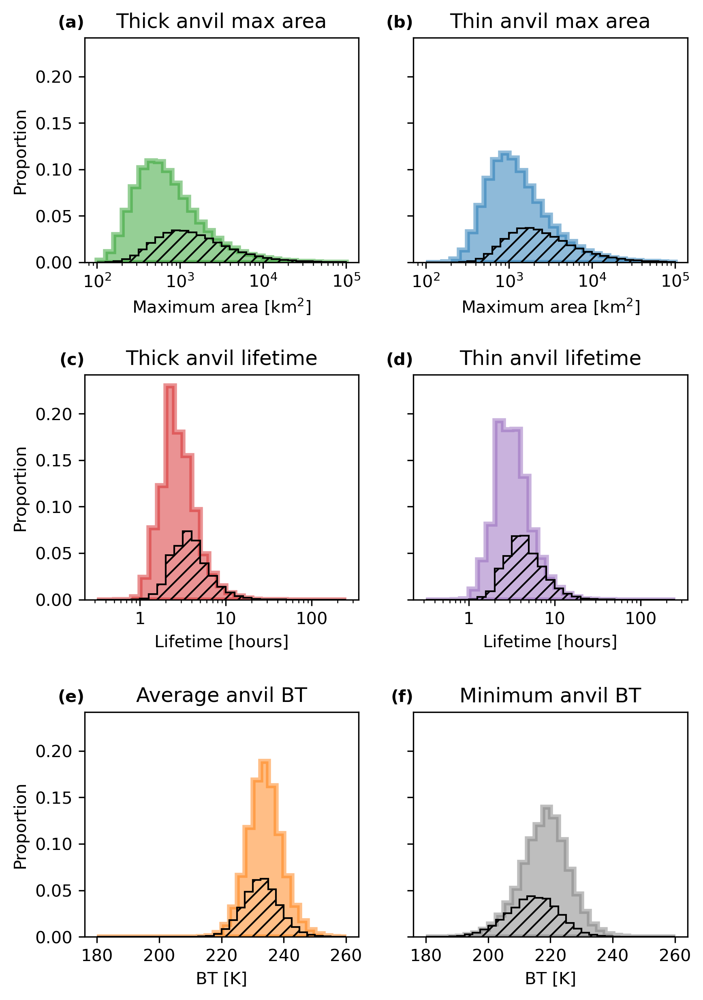

In [71]:
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2, dpi=dpi, sharey=True, figsize=(6.4,9.6))

anvil_area_bins = 10**np.arange(2,5.1,0.1)
ax1.hist(
    anvil_max_area[anvil_is_valid], bins=anvil_area_bins, 
    weights=np.full((np.sum(anvil_is_valid),), 1/np.sum(anvil_is_valid)), 
    alpha=0.5, facecolor="C2", edgecolor="C2", ls='solid', lw=3, histtype='stepfilled'
)
ax1.hist(
    anvil_max_area[anvil_has_multiple_cores], bins=anvil_area_bins, 
    weights=np.full((np.sum(anvil_has_multiple_cores),), 1/np.sum(anvil_is_valid)), 
    histtype='step', linewidth=1, facecolor='none', 
    hatch='///', edgecolor='k', fill=True
)

ax1.set_xscale("log")
ax1.set_xlabel("Maximum area [$\mathrm{km^2}$]")
ax1.set_ylabel("Proportion")
ax1.set_title("Thick anvil max area")
ax1.set_title("(a)", loc="left", ha="right", weight="bold", fontsize=10)

ax2.hist(
    thin_anvil_max_area[anvil_is_valid], bins=anvil_area_bins, 
    weights=np.full((np.sum(anvil_is_valid),), 1/np.sum(anvil_is_valid)), 
    alpha=0.5, facecolor="C0", edgecolor="C0", ls='solid', lw=3, histtype='stepfilled'
)
ax2.hist(
    thin_anvil_max_area[anvil_has_multiple_cores], bins=anvil_area_bins, 
    weights=np.full((np.sum(anvil_has_multiple_cores),), 1/np.sum(anvil_is_valid)), 
    histtype='step', linewidth=1, facecolor='none', 
    hatch='///', edgecolor='k', fill=True
)

ax2.set_xscale("log")
ax2.set_xlabel("Maximum area [$\mathrm{km^2}$]")
ax2.set_title("Thin anvil max area")
ax2.set_title("(b)", loc="left", ha="right", weight="bold", fontsize=10)


anvil_lifetime_bins = 10**np.arange(-0.5,2.5,0.1)
ax3.hist(
    thick_anvil_lifetime[anvil_is_valid], bins=anvil_lifetime_bins, 
    weights=np.full((np.sum(anvil_is_valid),), 1/np.sum(anvil_is_valid)), 
    alpha=0.5, facecolor="C3", edgecolor="C3", ls='solid', lw=3, histtype='stepfilled'
)
ax3.hist(
    thick_anvil_lifetime[anvil_has_multiple_cores], bins=anvil_lifetime_bins, 
    weights=np.full((np.sum(anvil_has_multiple_cores),), 1/np.sum(anvil_is_valid)), 
    histtype='step', linewidth=1, facecolor='none', 
    hatch='///', edgecolor='k', fill=True
)

ax3.set_xscale("log")
ax3.set_xticks([1,10,100],[1,10,100])
ax3.set_xlabel("Lifetime [hours]")
ax3.set_ylabel("Proportion")
ax3.set_title("Thick anvil lifetime")
ax3.set_title("(c)", loc="left", ha="right", weight="bold", fontsize=10)

ax4.hist(
    thin_anvil_lifetime[anvil_is_valid], bins=anvil_lifetime_bins, 
    weights=np.full((np.sum(anvil_is_valid),), 1/np.sum(anvil_is_valid)), 
    alpha=0.5, facecolor="C4", edgecolor="C4", ls='solid', lw=3, histtype='stepfilled'
)
ax4.hist(
    thin_anvil_lifetime[anvil_has_multiple_cores], bins=anvil_lifetime_bins, 
    weights=np.full((np.sum(anvil_has_multiple_cores),), 1/np.sum(anvil_is_valid)), 
    histtype='step', linewidth=1, facecolor='none', 
    hatch='///', edgecolor='k', fill=True
)

ax4.set_xscale("log")
ax4.set_xticks([1,10,100],[1,10,100])
ax4.set_xlabel("Lifetime [hours]")
# ax4.set_ylabel("Proportion")
ax4.set_title("Thin anvil lifetime")
ax4.set_title("(d)", loc="left", ha="right", weight="bold", fontsize=10)


anvil_BT_bins = np.arange(180,261,2.5)
ax5.hist(
    anvil_ctt_mean[anvil_is_valid], bins=anvil_BT_bins, 
    weights=np.full((np.sum(anvil_is_valid),), 1/np.sum(anvil_is_valid)),   
    alpha=0.5, facecolor="C1", edgecolor="C1", ls='solid', lw=3, histtype='stepfilled'
)
ax5.hist(
    anvil_ctt_mean[anvil_has_multiple_cores], bins=anvil_BT_bins, 
    weights=np.full((np.sum(anvil_has_multiple_cores),), 1/np.sum(anvil_is_valid)), 
    histtype='step', linewidth=1, facecolor='none', 
    hatch='///', edgecolor='k', fill=True
)

ax5.set_xlabel("BT [K]")
ax5.set_ylabel("Proportion")
ax5.set_title("Average anvil BT")
ax5.set_title("(e)", loc="left", ha="right", weight="bold", fontsize=10)

ax6.hist(
    anvil_ctt_min[anvil_is_valid], bins=anvil_BT_bins, 
    weights=np.full((np.sum(anvil_is_valid),), 1/np.sum(anvil_is_valid)),   
    alpha=0.5, facecolor="C7", edgecolor="C7", ls='solid', lw=3, histtype='stepfilled'
)
ax6.hist(
    anvil_ctt_min[anvil_has_multiple_cores], bins=anvil_BT_bins, 
    weights=np.full((np.sum(anvil_has_multiple_cores),), 1/np.sum(anvil_is_valid)), 
    histtype='step', linewidth=1, facecolor='none', 
    hatch='///', edgecolor='k', fill=True
)

ax6.set_xlabel("BT [K]")
# ax6.set_ylabel("Proportion")
ax6.set_title("Minimum anvil BT")
ax6.set_title("(f)", loc="left", ha="right", weight="bold", fontsize=10)

plt.subplots_adjust(hspace=0.5)

figure_list.append(plt.gcf())

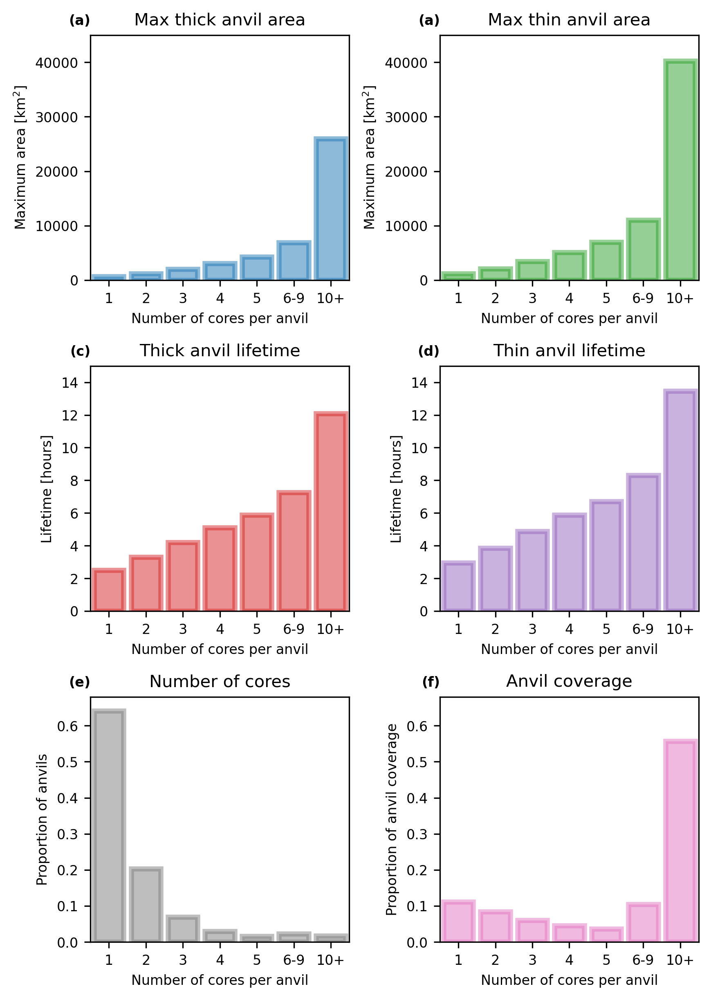

In [72]:
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2, dpi=dpi, figsize=(6.4,9.6))

bins = [0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 9.5, 999999]
bin_positions = [1, 2, 3, 4, 5, 6, 7]
bin_labels = [1, 2, 3, 4, 5, "6-9", "10+"]


bar_data = binned_statistic(
    anvil_number_of_cores[anvil_is_valid], 
    anvil_max_area[anvil_is_valid], 
    bins=bins, 
    statistic=np.nanmean
)

ax1.bar(bin_positions, bar_data[0], 
        alpha=0.5, facecolor = 'C0', edgecolor='C0', ls='solid', lw=3)

ax1.set_xlim([0.5, 7.5])
ax1.set_ylim([0,4.5e4])
ax1.set_xticks(bin_positions, bin_labels)
ax1.set_xlabel("Number of cores per anvil", fontsize=8)
ax1.set_ylabel("Maximum area [$\mathrm{km^2}$]", fontsize=8)
ax1.set_title("(a)", loc="left", ha="right", weight="bold", fontsize=8)
ax1.set_title("Max thick anvil area", fontsize=10)
ax1.tick_params(axis='both', which='major', labelsize=8)

bar_data = binned_statistic(
    anvil_number_of_cores[anvil_is_valid], 
    thin_anvil_max_area[anvil_is_valid], 
    bins=bins, 
    statistic=np.nanmean
)

ax2.bar(bin_positions, bar_data[0], 
        alpha=0.5, facecolor = 'C2', edgecolor='C2', ls='solid', lw=3)

ax2.set_xlim([0.5, 7.5])
ax2.set_ylim([0,4.5e4])
ax2.set_xticks(bin_positions, bin_labels)
ax2.set_xlabel("Number of cores per anvil", fontsize=8)
ax2.set_ylabel("Maximum area [$\mathrm{km^2}$]", fontsize=8)
ax2.set_title("(a)", loc="left", ha="right", weight="bold", fontsize=8)
ax2.set_title("Max thin anvil area", fontsize=10)
ax2.tick_params(axis='both', which='major', labelsize=8)

bar_data = binned_statistic(
    anvil_number_of_cores[anvil_is_valid], 
    thick_anvil_lifetime[anvil_is_valid], 
    bins=bins, 
    statistic=np.nanmean
)

ax3.bar(bin_positions, bar_data[0], 
        alpha=0.5, facecolor = 'C3', edgecolor='C3', ls='solid', lw=3)

ax3.set_xlim([0.5, 7.5])
ax3.set_ylim([0,15])
ax3.set_xticks(bin_positions, bin_labels)
ax3.set_xlabel("Number of cores per anvil", fontsize=8)
ax3.set_ylabel("Lifetime [hours]", fontsize=8)
ax3.set_title("(c)", loc="left", ha="right", weight="bold", fontsize=8)
ax3.set_title("Thick anvil lifetime", fontsize=10)
ax3.tick_params(axis='both', which='major', labelsize=8)

bar_data = binned_statistic(
    anvil_number_of_cores[anvil_is_valid], 
    thin_anvil_lifetime[anvil_is_valid], 
    bins=bins, 
    statistic=np.nanmean
)

ax4.bar(bin_positions, bar_data[0], 
        alpha=0.5, facecolor = 'C4', edgecolor='C4', ls='solid', lw=3)

ax4.set_xlim([0.5, 7.5])
ax4.set_ylim([0,15])
ax4.set_xticks(bin_positions, bin_labels)
ax4.set_xlabel("Number of cores per anvil", fontsize=8)
ax4.set_ylabel("Lifetime [hours]", fontsize=8)
ax4.set_title("(d)", loc="left", ha="right", weight="bold", fontsize=8)
ax4.set_title("Thin anvil lifetime", fontsize=10)
ax4.tick_params(axis='both', which='major', labelsize=8)


# ax3 = plt.subplot(121)

bar_data = binned_statistic(
    anvil_number_of_cores[anvil_is_valid], 
    np.ones(anvil_number_of_cores.size)[anvil_is_valid]/np.sum(anvil_is_valid), 
    bins=bins, 
    statistic="sum"
)

ax5.bar(bin_positions, bar_data[0], 
        alpha=0.5, facecolor = 'C7', edgecolor='C7', ls='solid', lw=3)

ax5.set_xlim([0.5, 7.5])
ax5.set_ylim([0,0.68])
ax5.set_xticks(bin_positions, bin_labels)
ax5.set_xlabel("Number of cores per anvil", fontsize=8)
ax5.set_ylabel("Proportion of anvils", fontsize=8)
ax5.set_title("(e)", loc="left", ha="right", weight="bold", fontsize=8)
ax5.set_title("Number of cores", fontsize=10)
ax5.tick_params(axis='both', which='major', labelsize=8)

# ax4 = plt.subplot(122)

bar_data = binned_statistic(
    anvil_number_of_cores[anvil_is_valid], 
    anvil_total_area[anvil_is_valid], 
    bins=bins, 
    statistic="sum"
)

plt.bar(bin_positions, bar_data[0]/np.sum(bar_data[0]), 
        alpha=0.5, facecolor = 'C6', edgecolor='C6', ls='solid', lw=3)

ax6.set_xlim([0.5, 7.5])
ax6.set_ylim([0,0.68])
ax6.set_xticks(bin_positions, bin_labels)
ax6.set_xlabel("Number of cores per anvil", fontsize=8)
ax6.set_ylabel("Proportion of anvil coverage", fontsize=8)
ax6.set_title("(f)", loc="left", ha="right", weight="bold", fontsize=8)
ax6.set_title("Anvil coverage", fontsize=10)
ax6.tick_params(axis='both', which='major', labelsize=8)

plt.subplots_adjust(hspace=0.35, wspace=0.35)

figure_list.append(plt.gcf())

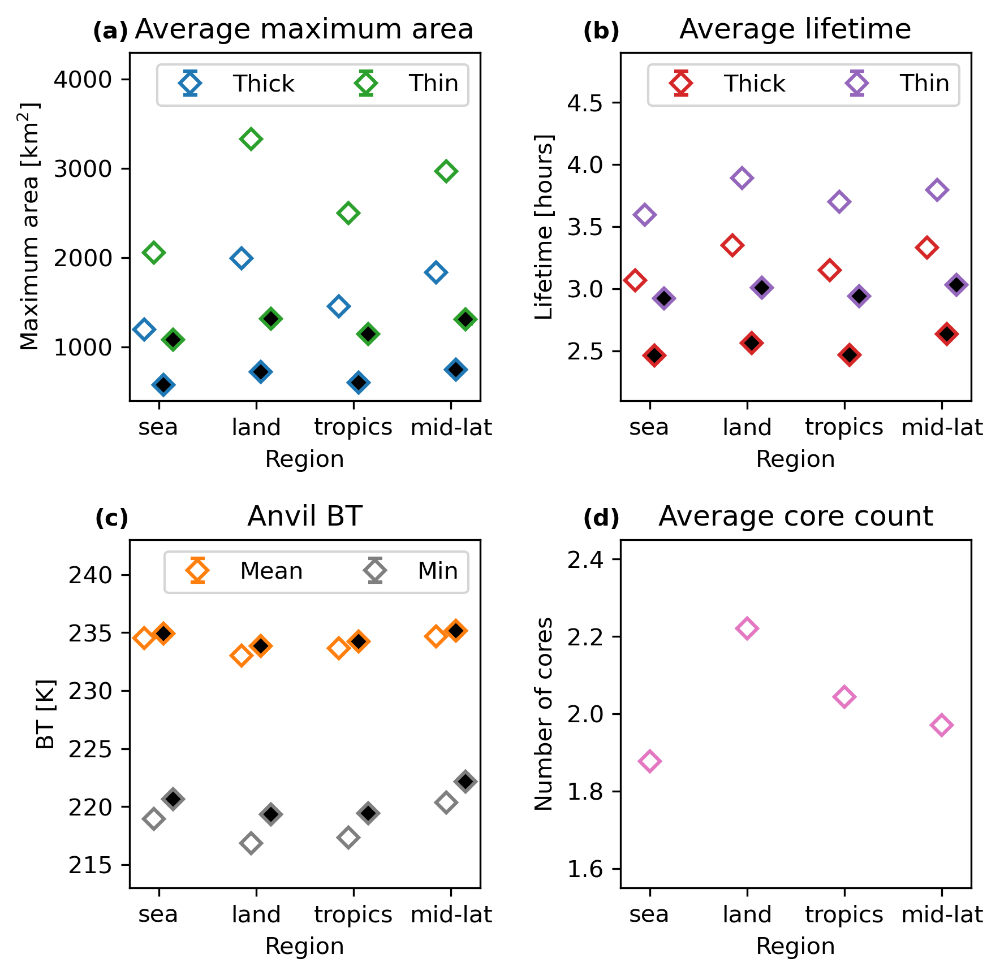

In [73]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, dpi=dpi, figsize=(6.4,6.4))

data = np.stack([
    np.nanmean(anvil_max_area[anvil_is_valid & anvil_sea_mask]),
    np.nanmean(anvil_max_area[anvil_is_valid & ~anvil_sea_mask]),
    np.nanmean(anvil_max_area[anvil_is_valid & (anvil_start_lat <= 30)]),
    np.nanmean(anvil_max_area[anvil_is_valid & (anvil_start_lat > 30)]),
])
std = np.stack([
    np.nanstd((anvil_max_area[anvil_is_valid & anvil_sea_mask])) / np.sum(anvil_is_valid & anvil_sea_mask)**0.5, 
    np.nanstd((anvil_max_area[anvil_is_valid & ~anvil_sea_mask])) / np.sum(anvil_is_valid & ~anvil_sea_mask)**0.5, 
    np.nanstd((anvil_max_area[anvil_is_valid & (anvil_start_lat <= 30)])) / np.sum(anvil_is_valid & (anvil_start_lat <= 30))**0.5, 
    np.nanstd((anvil_max_area[anvil_is_valid & (anvil_start_lat > 30)])) / np.sum(anvil_is_valid & (anvil_start_lat > 30))**0.5, 
])
# std = (
#     data - np.exp(np.log(data) - std),
#     np.exp(np.log(data) + std) - data
# )
ax1.errorbar(
    np.arange(4)-0.15, 
    data,
    std,
    fmt="C0D", mfc="white", ms=6, capsize=3, linewidth=1.5, mew=1.5,
)

data = np.stack([
    np.nanmean(thin_anvil_max_area[anvil_is_valid & anvil_sea_mask]),
    np.nanmean(thin_anvil_max_area[anvil_is_valid & ~anvil_sea_mask]),
    np.nanmean(thin_anvil_max_area[anvil_is_valid & (anvil_start_lat <= 30)]),
    np.nanmean(thin_anvil_max_area[anvil_is_valid & (anvil_start_lat > 30)]),
])
std = np.stack([
    np.nanstd((thin_anvil_max_area[anvil_is_valid & anvil_sea_mask])) / np.sum(anvil_is_valid & anvil_sea_mask)**0.5, 
    np.nanstd((thin_anvil_max_area[anvil_is_valid & ~anvil_sea_mask])) / np.sum(anvil_is_valid & ~anvil_sea_mask)**0.5, 
    np.nanstd((thin_anvil_max_area[anvil_is_valid & (anvil_start_lat <= 30)])) / np.sum(anvil_is_valid & (anvil_start_lat <= 30))**0.5, 
    np.nanstd((thin_anvil_max_area[anvil_is_valid & (anvil_start_lat > 30)])) / np.sum(anvil_is_valid & (anvil_start_lat > 30))**0.5, 
])
ax1.errorbar(
    np.arange(4)-0.05, 
    data,
    std,
    fmt="C2D", mfc="white", ms=6, capsize=3, linewidth=1.5, mew=1.5,
)

data = np.stack([
    np.nanmean(anvil_max_area[(anvil_core_count==1) & anvil_is_valid & anvil_sea_mask]),
    np.nanmean(anvil_max_area[(anvil_core_count==1) & anvil_is_valid & ~anvil_sea_mask]),
    np.nanmean(anvil_max_area[(anvil_core_count==1) & anvil_is_valid & (anvil_start_lat <= 30)]),
    np.nanmean(anvil_max_area[(anvil_core_count==1) & anvil_is_valid & (anvil_start_lat > 30)]),
])
std = np.stack([
    np.nanstd((anvil_max_area[anvil_is_valid & anvil_sea_mask])) / np.sum((anvil_core_count==1) & anvil_is_valid & anvil_sea_mask)**0.5, 
    np.nanstd((anvil_max_area[anvil_is_valid & ~anvil_sea_mask])) / np.sum((anvil_core_count==1) & anvil_is_valid & ~anvil_sea_mask)**0.5, 
    np.nanstd((anvil_max_area[anvil_is_valid & (anvil_start_lat <= 30)])) / np.sum((anvil_core_count==1) & anvil_is_valid & (anvil_start_lat <= 30))**0.5, 
    np.nanstd((anvil_max_area[anvil_is_valid & (anvil_start_lat > 30)])) / np.sum((anvil_core_count==1) & anvil_is_valid & (anvil_start_lat > 30))**0.5, 
])
ax1.errorbar(
    np.arange(4)+0.05, 
    data,
    std,
    fmt="C0D", mfc="black", ms=6, capsize=3, linewidth=1.5, mew=1.5,
)

data = np.stack([
    np.nanmean(thin_anvil_max_area[(anvil_core_count==1) & anvil_is_valid & anvil_sea_mask]),
    np.nanmean(thin_anvil_max_area[(anvil_core_count==1) & anvil_is_valid & ~anvil_sea_mask]),
    np.nanmean(thin_anvil_max_area[(anvil_core_count==1) & anvil_is_valid & (anvil_start_lat <= 30)]),
    np.nanmean(thin_anvil_max_area[(anvil_core_count==1) & anvil_is_valid & (anvil_start_lat > 30)]),
])
std = np.stack([
    np.nanstd((thin_anvil_max_area[anvil_is_valid & anvil_sea_mask])) / np.sum((anvil_core_count==1) & anvil_is_valid & anvil_sea_mask)**0.5, 
    np.nanstd((thin_anvil_max_area[anvil_is_valid & ~anvil_sea_mask])) / np.sum((anvil_core_count==1) & anvil_is_valid & ~anvil_sea_mask)**0.5, 
    np.nanstd((thin_anvil_max_area[anvil_is_valid & (anvil_start_lat <= 30)])) / np.sum((anvil_core_count==1) & anvil_is_valid & (anvil_start_lat <= 30))**0.5, 
    np.nanstd((thin_anvil_max_area[anvil_is_valid & (anvil_start_lat > 30)])) / np.sum((anvil_core_count==1) & anvil_is_valid & (anvil_start_lat > 30))**0.5, 
])
ax1.errorbar(
    np.arange(4)+0.15, 
    data,
    std,
    fmt="C2D", mfc="black", ms=6, capsize=3, linewidth=1.5, mew=1.5,
)

# ax1.set_yscale("log")
ax1.set_xticks(range(4), ["sea", "land", "tropics", "mid-lat"])
ax1.set_xlabel("Region")
ax1.set_ylabel("Maximum area [$\mathrm{km^2}$]")
ax1.set_title("Average maximum area")
ax1.set_title("(a)", loc="left", ha="right", weight="bold", fontsize=10)
ax1.legend(["Thick", "Thin"], ncols=2)
ax1.set_xlim([-0.3, 3.3])
ax1.set_ylim([400, 4300])

ax2.errorbar(
    np.arange(4)-0.15, 
    [
        np.nanmean(thick_anvil_lifetime[anvil_is_valid & anvil_sea_mask]),
        np.nanmean(thick_anvil_lifetime[anvil_is_valid & ~anvil_sea_mask]),
        np.nanmean(thick_anvil_lifetime[anvil_is_valid & (anvil_start_lat <= 30)]),
        np.nanmean(thick_anvil_lifetime[anvil_is_valid & (anvil_start_lat > 30)]),
    ],
    [
        np.nanstd((thick_anvil_lifetime[anvil_is_valid & anvil_sea_mask])) / np.sum(anvil_is_valid & anvil_sea_mask)**0.5, 
        np.nanstd((thick_anvil_lifetime[anvil_is_valid & ~anvil_sea_mask])) / np.sum(anvil_is_valid & ~anvil_sea_mask)**0.5, 
        np.nanstd((thick_anvil_lifetime[anvil_is_valid & (anvil_start_lat <= 30)])) / np.sum(anvil_is_valid & (anvil_start_lat <= 30))**0.5, 
        np.nanstd((thick_anvil_lifetime[anvil_is_valid & (anvil_start_lat > 30)])) / np.sum(anvil_is_valid & (anvil_start_lat > 30))**0.5, 
    ], 
    fmt="C3D", mfc="white", ms=6, capsize=3, linewidth=1.5, mew=1.5,
)

ax2.errorbar(
    np.arange(4)-0.05, 
    [
        np.nanmean(thin_anvil_lifetime[anvil_is_valid & anvil_sea_mask]),
        np.nanmean(thin_anvil_lifetime[anvil_is_valid & ~anvil_sea_mask]),
        np.nanmean(thin_anvil_lifetime[anvil_is_valid & (anvil_start_lat <= 30)]),
        np.nanmean(thin_anvil_lifetime[anvil_is_valid & (anvil_start_lat > 30)]),
    ],
    [
        np.nanstd((thin_anvil_lifetime[anvil_is_valid & anvil_sea_mask])) / np.sum(anvil_is_valid & anvil_sea_mask)**0.5, 
        np.nanstd((thin_anvil_lifetime[anvil_is_valid & ~anvil_sea_mask])) / np.sum(anvil_is_valid & ~anvil_sea_mask)**0.5, 
        np.nanstd((thin_anvil_lifetime[anvil_is_valid & (anvil_start_lat <= 30)])) / np.sum(anvil_is_valid & (anvil_start_lat <= 30))**0.5, 
        np.nanstd((thin_anvil_lifetime[anvil_is_valid & (anvil_start_lat > 30)])) / np.sum(anvil_is_valid & (anvil_start_lat > 30))**0.5, 
    ], 
    fmt="C4D", mfc="white", ms=6, capsize=3, linewidth=1.5, mew=1.5,
)

ax2.errorbar(
    np.arange(4)+0.05, 
    [
        np.nanmean(thick_anvil_lifetime[(anvil_core_count==1) & anvil_is_valid & anvil_sea_mask]),
        np.nanmean(thick_anvil_lifetime[(anvil_core_count==1) & anvil_is_valid & ~anvil_sea_mask]),
        np.nanmean(thick_anvil_lifetime[(anvil_core_count==1) & anvil_is_valid & (anvil_start_lat <= 30)]),
        np.nanmean(thick_anvil_lifetime[(anvil_core_count==1) & anvil_is_valid & (anvil_start_lat > 30)]),
    ],
    [
        np.nanstd((thick_anvil_lifetime[anvil_is_valid & anvil_sea_mask])) / np.sum((anvil_core_count==1) & anvil_is_valid & anvil_sea_mask)**0.5, 
        np.nanstd((thick_anvil_lifetime[anvil_is_valid & ~anvil_sea_mask])) / np.sum((anvil_core_count==1) & anvil_is_valid & ~anvil_sea_mask)**0.5, 
        np.nanstd((thick_anvil_lifetime[anvil_is_valid & (anvil_start_lat <= 30)])) / np.sum((anvil_core_count==1) & anvil_is_valid & (anvil_start_lat <= 30))**0.5, 
        np.nanstd((thick_anvil_lifetime[anvil_is_valid & (anvil_start_lat > 30)])) / np.sum((anvil_core_count==1) & anvil_is_valid & (anvil_start_lat > 30))**0.5, 
    ], 
    fmt="C3D", mfc="black", ms=6, capsize=3, linewidth=1.5, mew=1.5,
)

ax2.errorbar(
    np.arange(4)+0.15, 
    [
        np.nanmean(thin_anvil_lifetime[(anvil_core_count==1) & anvil_is_valid & anvil_sea_mask]),
        np.nanmean(thin_anvil_lifetime[(anvil_core_count==1) & anvil_is_valid & ~anvil_sea_mask]),
        np.nanmean(thin_anvil_lifetime[(anvil_core_count==1) & anvil_is_valid & (anvil_start_lat <= 30)]),
        np.nanmean(thin_anvil_lifetime[(anvil_core_count==1) & anvil_is_valid & (anvil_start_lat > 30)]),
    ],
    [
        np.nanstd((thin_anvil_lifetime[anvil_is_valid & anvil_sea_mask])) / np.sum((anvil_core_count==1) & anvil_is_valid & anvil_sea_mask)**0.5, 
        np.nanstd((thin_anvil_lifetime[anvil_is_valid & ~anvil_sea_mask])) / np.sum((anvil_core_count==1) & anvil_is_valid & ~anvil_sea_mask)**0.5, 
        np.nanstd((thin_anvil_lifetime[anvil_is_valid & (anvil_start_lat <= 30)])) / np.sum((anvil_core_count==1) & anvil_is_valid & (anvil_start_lat <= 30))**0.5, 
        np.nanstd((thin_anvil_lifetime[anvil_is_valid & (anvil_start_lat > 30)])) / np.sum((anvil_core_count==1) & anvil_is_valid & (anvil_start_lat > 30))**0.5, 
    ], 
    fmt="C4D", mfc="black", ms=6, capsize=3, linewidth=1.5, mew=1.5,
)
ax2.set_xticks(range(4), ["sea", "land", "tropics", "mid-lat"])
ax2.set_xlabel("Region")
ax2.set_ylabel("Lifetime [hours]")
ax2.set_title("Average lifetime")
ax2.set_title("(b)", loc="left", ha="right", weight="bold", fontsize=10)
ax2.legend(["Thick", "Thin"], ncols=2)
ax2.set_xlim([-0.3, 3.3])
ax2.set_ylim(2.1,4.9)

ax3.errorbar(
    np.arange(4)-0.15, 
    [
        np.nanmean(anvil_ctt_mean[anvil_is_valid & anvil_sea_mask]),
        np.nanmean(anvil_ctt_mean[anvil_is_valid & ~anvil_sea_mask]),
        np.nanmean(anvil_ctt_mean[anvil_is_valid & (anvil_start_lat <= 30)]),
        np.nanmean(anvil_ctt_mean[anvil_is_valid & (anvil_start_lat > 30)]),
    ],
    [
        np.nanstd((anvil_ctt_mean[anvil_is_valid & anvil_sea_mask])) / np.sum(anvil_is_valid & anvil_sea_mask)**0.5, 
        np.nanstd((anvil_ctt_mean[anvil_is_valid & ~anvil_sea_mask])) / np.sum(anvil_is_valid & ~anvil_sea_mask)**0.5, 
        np.nanstd((anvil_ctt_mean[anvil_is_valid & (anvil_start_lat <= 30)])) / np.sum(anvil_is_valid & (anvil_start_lat <= 30))**0.5, 
        np.nanstd((anvil_ctt_mean[anvil_is_valid & (anvil_start_lat > 30)])) / np.sum(anvil_is_valid & (anvil_start_lat > 30))**0.5, 
    ], 
    fmt="C1D", mfc="white", ms=6, capsize=3, linewidth=1.5, mew=1.5,
)

ax3.errorbar(
    np.arange(4)-0.05, 
    [
        np.nanmean(anvil_ctt_min[anvil_is_valid & anvil_sea_mask]),
        np.nanmean(anvil_ctt_min[anvil_is_valid & ~anvil_sea_mask]),
        np.nanmean(anvil_ctt_min[anvil_is_valid & (anvil_start_lat <= 30)]),
        np.nanmean(anvil_ctt_min[anvil_is_valid & (anvil_start_lat > 30)]),
    ],
    [
        np.nanstd((anvil_ctt_min[anvil_is_valid & anvil_sea_mask])) / np.sum(anvil_is_valid & anvil_sea_mask)**0.5, 
        np.nanstd((anvil_ctt_min[anvil_is_valid & ~anvil_sea_mask])) / np.sum(anvil_is_valid & ~anvil_sea_mask)**0.5, 
        np.nanstd((anvil_ctt_min[anvil_is_valid & (anvil_start_lat <= 30)])) / np.sum(anvil_is_valid & (anvil_start_lat <= 30))**0.5, 
        np.nanstd((anvil_ctt_min[anvil_is_valid & (anvil_start_lat > 30)])) / np.sum(anvil_is_valid & (anvil_start_lat > 30))**0.5, 
    ], 
    fmt="C7D", mfc="white", ms=6, capsize=3, linewidth=1.5, mew=1.5,
)

ax3.errorbar(
    np.arange(4)+0.05, 
    [
        np.nanmean(anvil_ctt_mean[(anvil_core_count==1) & anvil_is_valid & anvil_sea_mask]),
        np.nanmean(anvil_ctt_mean[(anvil_core_count==1) & anvil_is_valid & ~anvil_sea_mask]),
        np.nanmean(anvil_ctt_mean[(anvil_core_count==1) & anvil_is_valid & (anvil_start_lat <= 30)]),
        np.nanmean(anvil_ctt_mean[(anvil_core_count==1) & anvil_is_valid & (anvil_start_lat > 30)]),
    ],
    [
        np.nanstd((anvil_ctt_mean[anvil_is_valid & anvil_sea_mask])) / np.sum((anvil_core_count==1) & anvil_is_valid & anvil_sea_mask)**0.5, 
        np.nanstd((anvil_ctt_mean[anvil_is_valid & ~anvil_sea_mask])) / np.sum((anvil_core_count==1) & anvil_is_valid & ~anvil_sea_mask)**0.5, 
        np.nanstd((anvil_ctt_mean[anvil_is_valid & (anvil_start_lat <= 30)])) / np.sum((anvil_core_count==1) & anvil_is_valid & (anvil_start_lat <= 30))**0.5, 
        np.nanstd((anvil_ctt_mean[anvil_is_valid & (anvil_start_lat > 30)])) / np.sum((anvil_core_count==1) & anvil_is_valid & (anvil_start_lat > 30))**0.5, 
    ], 
    fmt="C1D", mfc="black", ms=6, capsize=3, linewidth=1.5, mew=1.5,
)

ax3.errorbar(
    np.arange(4)+0.15, 
    [
        np.nanmean(anvil_ctt_min[(anvil_core_count==1) & anvil_is_valid & anvil_sea_mask]),
        np.nanmean(anvil_ctt_min[(anvil_core_count==1) & anvil_is_valid & ~anvil_sea_mask]),
        np.nanmean(anvil_ctt_min[(anvil_core_count==1) & anvil_is_valid & (anvil_start_lat <= 30)]),
        np.nanmean(anvil_ctt_min[(anvil_core_count==1) & anvil_is_valid & (anvil_start_lat > 30)]),
    ],
    [
        np.nanstd((anvil_ctt_mean[anvil_is_valid & anvil_sea_mask])) / np.sum((anvil_core_count==1) & anvil_is_valid & anvil_sea_mask)**0.5, 
        np.nanstd((anvil_ctt_mean[anvil_is_valid & ~anvil_sea_mask])) / np.sum((anvil_core_count==1) & anvil_is_valid & ~anvil_sea_mask)**0.5, 
        np.nanstd((anvil_ctt_mean[anvil_is_valid & (anvil_start_lat <= 30)])) / np.sum((anvil_core_count==1) & anvil_is_valid & (anvil_start_lat <= 30))**0.5, 
        np.nanstd((anvil_ctt_mean[anvil_is_valid & (anvil_start_lat > 30)])) / np.sum((anvil_core_count==1) & anvil_is_valid & (anvil_start_lat > 30))**0.5, 
    ], 
    fmt="C7D", mfc="black", ms=6, capsize=3, linewidth=1.5, mew=1.5,
)

ax3.set_xticks(range(4), ["sea", "land", "tropics", "mid-lat"])
ax3.set_xlabel("Region")
ax3.set_ylabel("BT [K]")
ax3.set_title("Anvil BT")
ax3.set_title("(c)", loc="left", ha="right", weight="bold", fontsize=10)
ax3.legend(["Mean", "Min"], ncols=2)
ax3.set_xlim([-0.3, 3.3])
ax3.set_ylim(213,243)


ax4.plot(
    np.arange(4), 
    [
        np.nanmean(anvil_core_count[anvil_is_valid & anvil_sea_mask]),
        np.nanmean(anvil_core_count[anvil_is_valid & ~anvil_sea_mask]),
        np.nanmean(anvil_core_count[anvil_is_valid & (anvil_start_lat <= 30)]),
        np.nanmean(anvil_core_count[anvil_is_valid & (anvil_start_lat > 30)]),
    ],
    "C6D", mfc="white", ms=6, mew=1.5,
)
ax4.set_xticks(range(4), ["sea", "land", "tropics", "mid-lat"])
ax4.set_xlabel("Region")
ax4.set_ylabel("Number of cores")
ax4.set_title("Average core count")
ax4.set_title("(d)", loc="left", ha="right", weight="bold", fontsize=10)
# ax4.legend(["Mean", "Min"], ncols=2)
ax4.set_xlim([-0.3, 3.3])
ax4.set_ylim([1.55, 2.45])

plt.subplots_adjust(hspace=0.4, wspace=0.4)

figure_list.append(plt.gcf())

## Figure 14 : Anvil time of detection

In [74]:
anvil_local_time = anvil_start_t + np.array(anvil_start_lon/15*3600, "timedelta64[s]")
anvil_local_hour = (anvil_local_time - anvil_local_time.astype("datetime64[D]")).astype(int)/3.6e12

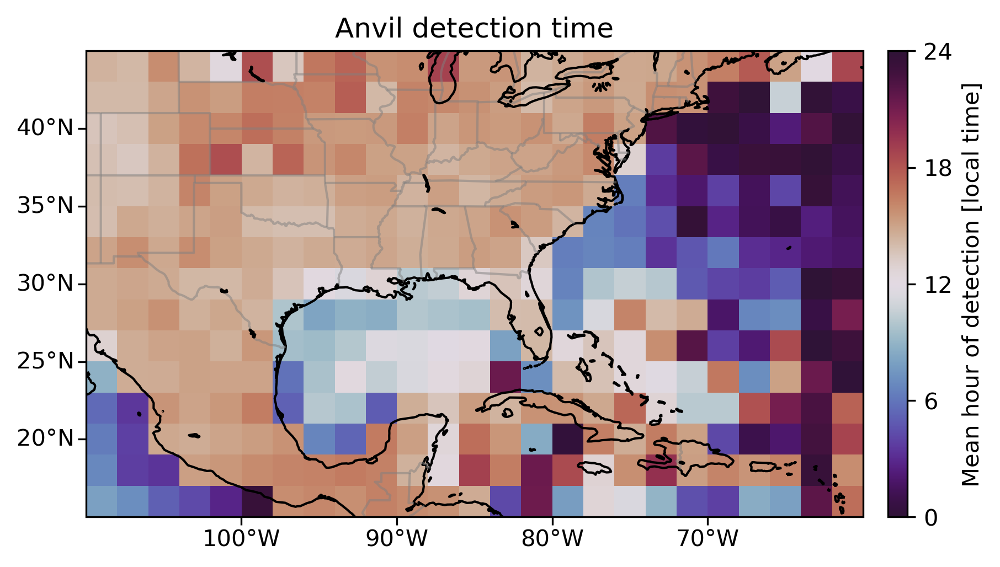

In [75]:
def circmean_hour(x):
    return circmean(x, high=24, low=0)

def circstd_hour(x):
    return circstd(x, high=24, low=0)


fig = plt.figure(dpi=dpi)

ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='gray', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
gl.xlines = False
gl.ylines = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

img_data = binned_statistic_2d(
    anvil_start_lon[anvil_is_valid], anvil_start_lat[anvil_is_valid], anvil_local_hour[anvil_is_valid], 
    bins=[
        np.arange(img_extent[0], img_extent[1]+1, 2), 
        np.arange(img_extent[2], img_extent[3]+1, 2)], 
    statistic=circmean_hour
)
img = ax.imshow(img_data[0].T[::-1], extent=img_extent, vmin=0, vmax=24, cmap="twilight_shifted")

ax_divider = make_axes_locatable(ax)
cbar_size="2.5%"
cbar_pad=0.15
cax_r = ax_divider.new_horizontal(size=cbar_size, pad=cbar_pad, axes_class=plt.Axes)
fig.add_axes(cax_r)
cbar = plt.colorbar(img, cax=cax_r, label="Mean hour of detection [local time]")
cbar.set_ticks([0,6,12,18,24])

ax.set_title("Anvil detection time")

plt.draw()
add_gl_ticks(ax, gl)

figure_list.append(plt.gcf())

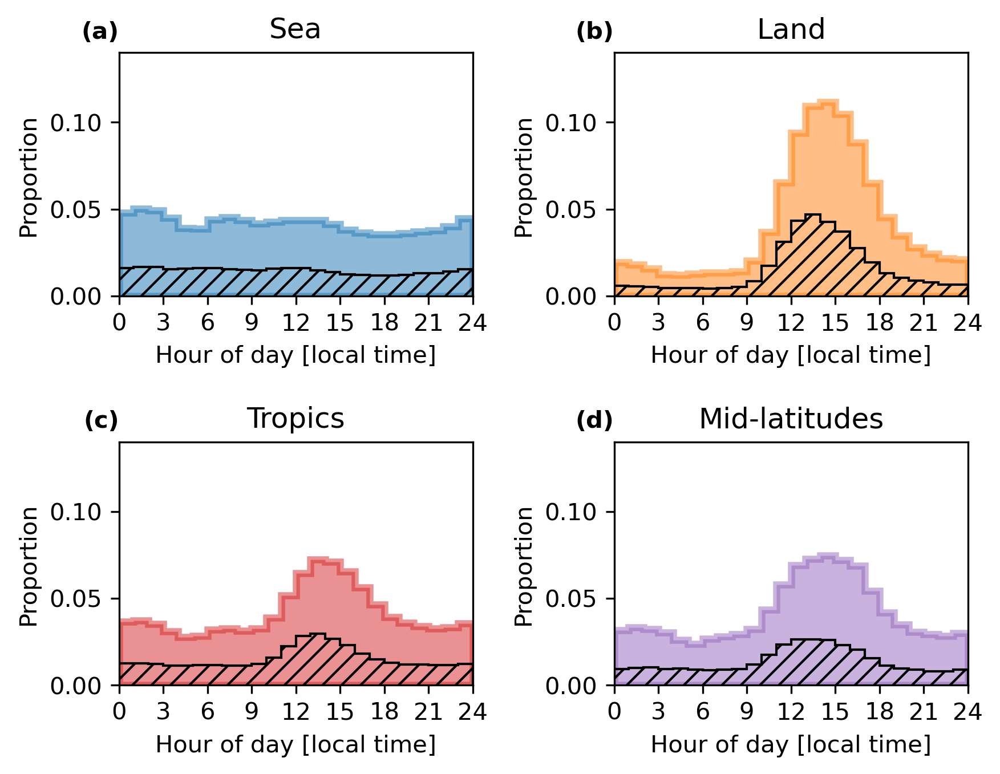

In [76]:
fig = plt.figure(dpi=dpi)

ax = plt.subplot(221)

wh_sea_valid = np.logical_and(anvil_is_valid, anvil_sea_mask)
ch_sea = ax.hist(    
    anvil_local_hour[wh_sea_valid],
    bins=range(0,25), 
    weights=np.full((np.sum(wh_sea_valid),), 1/np.sum(wh_sea_valid)), 
    alpha=0.5, facecolor="C0", edgecolor="C0", ls='solid', lw=3, histtype='stepfilled'
)
ax.hist(
    anvil_local_hour[wh_sea_valid & anvil_has_multiple_cores], 
    bins=range(0,25), 
    weights=np.full((np.sum(wh_sea_valid & anvil_has_multiple_cores),), 1/np.sum(wh_sea_valid)), 
    histtype='step', linewidth=1, facecolor='none', 
    hatch='///', edgecolor='k', fill=True
)

ax.set_xlim([0,24])
ax.set_xticks(range(0,25,3))
ax.set_xlabel("Hour of day [local time]")
ax.set_ylabel("Proportion")
ax.set_ylim([0,0.14])
ax.set_title("Sea")
ax.set_title("(a)", loc="left", ha="right", weight="bold", fontsize=10)


ax = plt.subplot(222)

wh_land_valid = np.logical_and(anvil_is_valid, ~anvil_sea_mask)
h_land = ax.hist(
    anvil_local_hour[wh_land_valid],
    bins=range(0,25), 
    weights=np.full((np.sum(wh_land_valid),), 1/np.sum(wh_land_valid)), 
    alpha=0.5, facecolor="C1", edgecolor="C1", ls='solid', lw=3, histtype='stepfilled'
)
ax.hist(
    anvil_local_hour[wh_land_valid & anvil_has_multiple_cores], 
    bins=range(0,25), 
    weights=np.full((np.sum(wh_land_valid & anvil_has_multiple_cores),), 1/np.sum(wh_land_valid)), 
    histtype='step', linewidth=1, facecolor='none', 
    hatch='///', edgecolor='k', fill=True
)

ax.set_xlim([0,24])
ax.set_xticks(range(0,25,3))
ax.set_xlabel("Hour of day [local time]")
ax.set_ylabel("Proportion")
ax.set_ylim([0,0.14])
ax.set_title("Land")
ax.set_title("(b)", loc="left", ha="right", weight="bold", fontsize=10)


ax = plt.subplot(223)

wh_tropics_valid = np.logical_and(anvil_is_valid, anvil_start_lat<=30)
h_tropics = ax.hist(
    anvil_local_hour[wh_tropics_valid],
    bins=range(0,25), 
    weights=np.full((np.sum(wh_tropics_valid),), 1/np.sum(wh_tropics_valid)), 
    alpha=0.5, facecolor="C3", edgecolor="C3", ls='solid', lw=3, histtype='stepfilled'
)
ax.hist(
    anvil_local_hour[wh_tropics_valid & anvil_has_multiple_cores], 
    bins=range(0,25), 
    weights=np.full((np.sum(wh_tropics_valid & anvil_has_multiple_cores),), 1/np.sum(wh_tropics_valid)), 
    histtype='step', linewidth=1, facecolor='none', 
    hatch='///', edgecolor='k', fill=True
)

ax.set_xlim([0,24])
ax.set_xticks(range(0,25,3))
ax.set_xlabel("Hour of day [local time]")
ax.set_ylabel("Proportion")
ax.set_ylim([0,0.14])
ax.set_title("Tropics")
ax.set_title("(c)", loc="left", ha="right", weight="bold", fontsize=10)


ax = plt.subplot(224)

wh_midlats_valid = np.logical_and(anvil_is_valid, anvil_start_lat>30)
h_land = ax.hist(
    anvil_local_hour[wh_midlats_valid],
    bins=range(0,25), 
    weights=np.full((np.sum(wh_midlats_valid),), 1/np.sum(wh_midlats_valid)), 
    alpha=0.5, facecolor="C4", edgecolor="C4", ls='solid', lw=3, histtype='stepfilled'
)
ax.hist(
    anvil_local_hour[wh_midlats_valid & anvil_has_multiple_cores], 
    bins=range(0,25), 
    weights=np.full((np.sum(wh_midlats_valid & anvil_has_multiple_cores),), 1/np.sum(wh_midlats_valid)), 
    histtype='step', linewidth=1, facecolor='none', 
    hatch='///', edgecolor='k', fill=True
)

ax.set_xlim([0,24])
ax.set_xticks(range(0,25,3))
ax.set_xlabel("Hour of day [local time]")
ax.set_ylabel("Proportion")
ax.set_ylim([0,0.14])
ax.set_title("Mid-latitudes")
ax.set_title("(d)", loc="left", ha="right", weight="bold", fontsize=10)

plt.subplots_adjust(hspace=0.6, wspace=0.4)

figure_list.append(plt.gcf())

In [77]:
step_repeats = np.round(thin_anvil_lifetime*12).astype(int) + 1
step_offsets = np.ones(step_repeats.sum())
step_offsets[np.cumsum(step_repeats[:-1]).astype(int)] = -step_repeats[:-1] + 1
step_offsets = (np.cumsum(step_offsets) - 1) / 12

In [78]:
anvil_step_hours = (np.repeat(anvil_local_hour, step_repeats) + step_offsets) % 24
anvil_step_is_valid = np.repeat(anvil_is_valid, step_repeats)
anvil_step_has_multiple_cores = np.repeat(anvil_has_multiple_cores, step_repeats)
anvil_step_sea_mask = np.repeat(anvil_sea_mask, step_repeats)
anvil_step_lat = np.repeat(anvil_start_lat, step_repeats)
anvil_step_lon = np.repeat(anvil_start_lon, step_repeats)

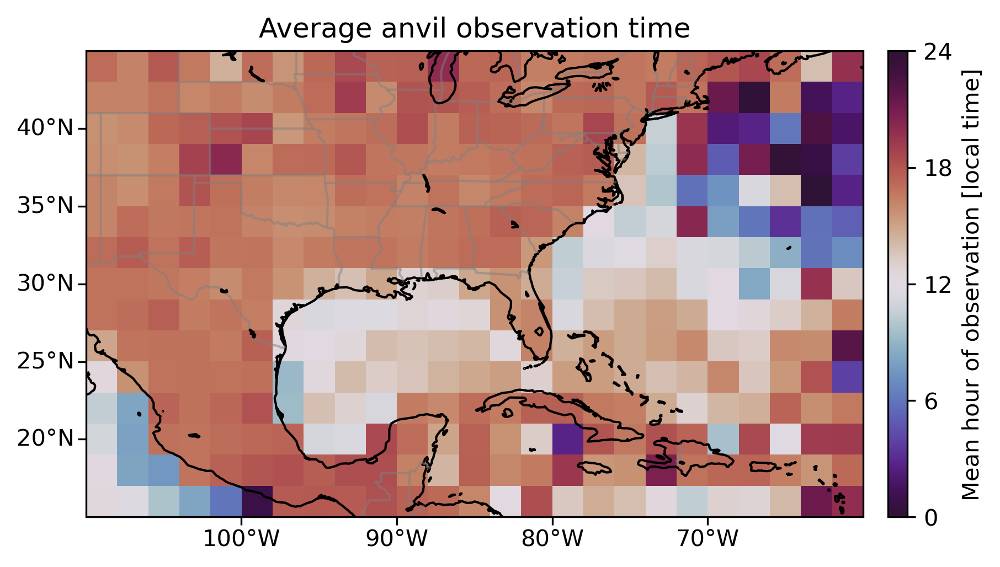

In [79]:
def circmean_hour(x):
    return circmean(x, high=24, low=0)

def circstd_hour(x):
    return circstd(x, high=24, low=0)


fig = plt.figure(dpi=dpi)

ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.BORDERS, edgecolor='gray', alpha=0.5)
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
ax.add_feature(states_provinces, edgecolor='gray', alpha=0.5)
ax.add_feature(cfeature.LAKES, edgecolor='black', alpha=1, facecolor="none")
gl = ax.gridlines(
    crs=ccrs.PlateCarree(), draw_labels=True,
    linewidth=1, color='gray', alpha=0.5, linestyle='--'
)
gl.top_labels = False
gl.right_labels = False
gl.xlines = False
gl.ylines = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER

img_data = binned_statistic_2d(
    anvil_step_lon[anvil_step_is_valid], anvil_step_lat[anvil_step_is_valid], anvil_step_hours[anvil_step_is_valid], 
    bins=[
        np.arange(img_extent[0], img_extent[1]+1, 2), 
        np.arange(img_extent[2], img_extent[3]+1, 2)], 
    statistic=circmean_hour
)
img = ax.imshow(img_data[0].T[::-1], extent=img_extent, vmin=0, vmax=24, cmap="twilight_shifted")

ax_divider = make_axes_locatable(ax)
cbar_size="2.5%"
cbar_pad=0.15
cax_r = ax_divider.new_horizontal(size=cbar_size, pad=cbar_pad, axes_class=plt.Axes)
fig.add_axes(cax_r)
cbar = plt.colorbar(img, cax=cax_r, label="Mean hour of observation [local time]")
cbar.set_ticks([0,6,12,18,24])

ax.set_title("Average anvil observation time")

plt.draw()
add_gl_ticks(ax, gl)

figure_list.append(plt.gcf())

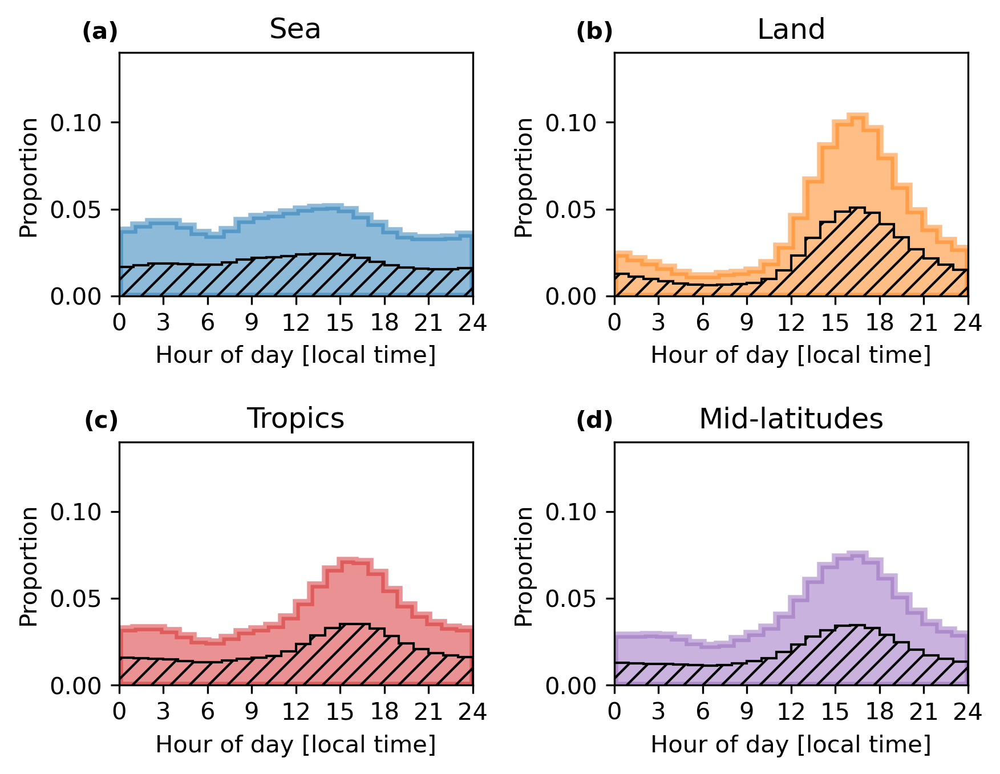

In [80]:
fig = plt.figure(dpi=dpi)

ax = plt.subplot(221)

wh_sea_valid = np.logical_and(anvil_step_is_valid, anvil_step_sea_mask)
ch_sea = ax.hist(    
    anvil_step_hours[wh_sea_valid],
    bins=range(0,25), 
    weights=np.full((np.sum(wh_sea_valid),), 1/np.sum(wh_sea_valid)), 
    alpha=0.5, facecolor="C0", edgecolor="C0", ls='solid', lw=3, histtype='stepfilled'
)
ax.hist(
    anvil_step_hours[wh_sea_valid & anvil_step_has_multiple_cores], 
    bins=range(0,25), 
    weights=np.full((np.sum(wh_sea_valid & anvil_step_has_multiple_cores),), 1/np.sum(wh_sea_valid)), 
    histtype='step', linewidth=1, facecolor='none', 
    hatch='///', edgecolor='k', fill=True
)

ax.set_xlim([0,24])
ax.set_xticks(range(0,25,3))
ax.set_xlabel("Hour of day [local time]")
ax.set_ylabel("Proportion")
ax.set_ylim([0,0.14])
ax.set_title("Sea")
ax.set_title("(a)", loc="left", ha="right", weight="bold", fontsize=10)


ax = plt.subplot(222)

wh_land_valid = np.logical_and(anvil_step_is_valid, ~anvil_step_sea_mask)
h_land = ax.hist(
    anvil_step_hours[wh_land_valid],
    bins=range(0,25), 
    weights=np.full((np.sum(wh_land_valid),), 1/np.sum(wh_land_valid)), 
    alpha=0.5, facecolor="C1", edgecolor="C1", ls='solid', lw=3, histtype='stepfilled'
)
ax.hist(
    anvil_step_hours[wh_land_valid & anvil_step_has_multiple_cores], 
    bins=range(0,25), 
    weights=np.full((np.sum(wh_land_valid & anvil_step_has_multiple_cores),), 1/np.sum(wh_land_valid)), 
    histtype='step', linewidth=1, facecolor='none', 
    hatch='///', edgecolor='k', fill=True
)

ax.set_xlim([0,24])
ax.set_xticks(range(0,25,3))
ax.set_xlabel("Hour of day [local time]")
ax.set_ylabel("Proportion")
ax.set_ylim([0,0.14])
ax.set_title("Land")
ax.set_title("(b)", loc="left", ha="right", weight="bold", fontsize=10)


ax = plt.subplot(223)

wh_tropics_valid = np.logical_and(anvil_step_is_valid, anvil_step_lat<=30)
h_tropics = ax.hist(
    anvil_step_hours[wh_tropics_valid],
    bins=range(0,25), 
    weights=np.full((np.sum(wh_tropics_valid),), 1/np.sum(wh_tropics_valid)), 
    alpha=0.5, facecolor="C3", edgecolor="C3", ls='solid', lw=3, histtype='stepfilled'
)
ax.hist(
    anvil_step_hours[wh_tropics_valid & anvil_step_has_multiple_cores], 
    bins=range(0,25), 
    weights=np.full((np.sum(wh_tropics_valid & anvil_step_has_multiple_cores),), 1/np.sum(wh_tropics_valid)), 
    histtype='step', linewidth=1, facecolor='none', 
    hatch='///', edgecolor='k', fill=True
)

ax.set_xlim([0,24])
ax.set_xticks(range(0,25,3))
ax.set_xlabel("Hour of day [local time]")
ax.set_ylabel("Proportion")
ax.set_ylim([0,0.14])
ax.set_title("Tropics")
ax.set_title("(c)", loc="left", ha="right", weight="bold", fontsize=10)


ax = plt.subplot(224)

wh_midlats_valid = np.logical_and(anvil_step_is_valid, anvil_step_lat>30)
h_land = ax.hist(
    anvil_step_hours[wh_midlats_valid],
    bins=range(0,25), 
    weights=np.full((np.sum(wh_midlats_valid),), 1/np.sum(wh_midlats_valid)), 
    alpha=0.5, facecolor="C4", edgecolor="C4", ls='solid', lw=3, histtype='stepfilled'
)
ax.hist(
    anvil_step_hours[wh_midlats_valid & anvil_step_has_multiple_cores], 
    bins=range(0,25), 
    weights=np.full((np.sum(wh_midlats_valid & anvil_step_has_multiple_cores),), 1/np.sum(wh_midlats_valid)), 
    histtype='step', linewidth=1, facecolor='none', 
    hatch='///', edgecolor='k', fill=True
)

ax.set_xlim([0,24])
ax.set_xticks(range(0,25,3))
ax.set_xlabel("Hour of day [local time]")
ax.set_ylabel("Proportion")
ax.set_ylim([0,0.14])
ax.set_title("Mid-latitudes")
ax.set_title("(d)", loc="left", ha="right", weight="bold", fontsize=10)

plt.subplots_adjust(hspace=0.6, wspace=0.4)

figure_list.append(plt.gcf())

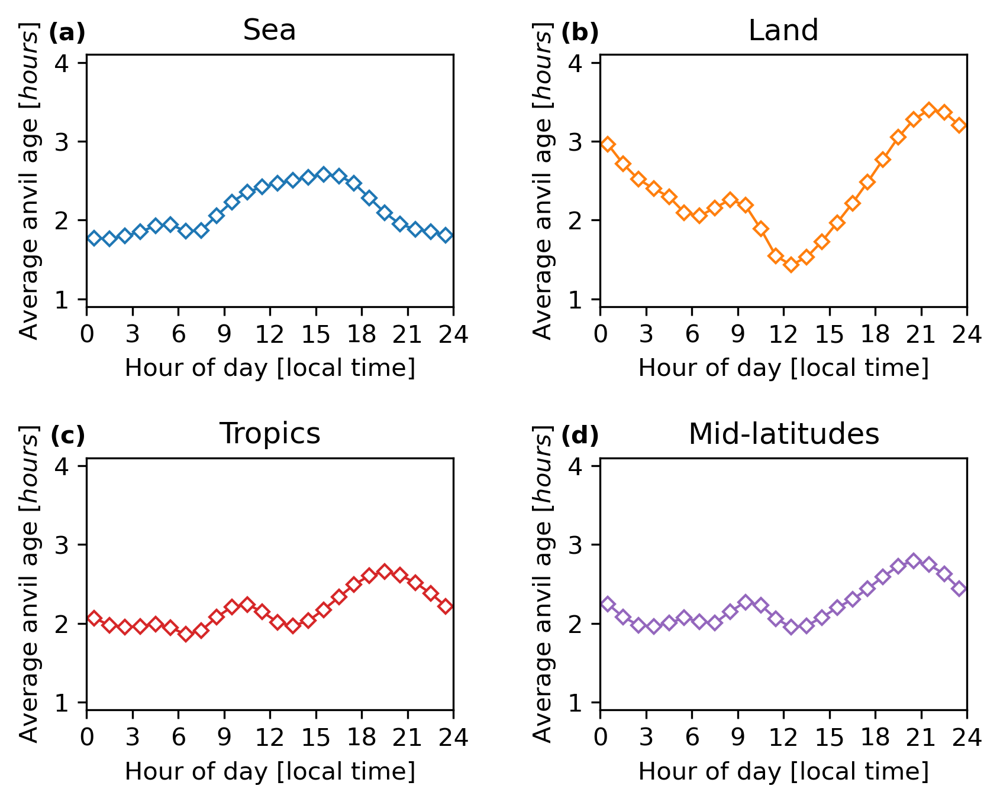

In [81]:
fig = plt.figure(dpi=dpi)

ax = plt.subplot(221)

wh_sea_valid = np.logical_and(anvil_step_is_valid, anvil_step_sea_mask)

# plt.errorbar(
#     np.arange(24)+0.5, 
#     binned_statistic(anvil_step_hours[wh_sea_valid], step_offsets[wh_sea_valid], statistic=circmean_hour, bins=range(0,25))[0],
#     binned_statistic(anvil_step_hours[wh_sea_valid], step_offsets[wh_sea_valid], statistic=circstd_hour, bins=range(0,25))[0],
#     fmt="C0D", mfc="white", ms=4, capsize=2, linewidth=1, mew=1,
# )
binned_plot(
    anvil_step_hours[wh_sea_valid], step_offsets[wh_sea_valid], np.arange(0,25), statistic=circmean_hour, stat_func=circstd_hour,
    color="C0", fmt="D-", mfc="white", ms=4, capsize=2, linewidth=1, mew=1,
)

ax.set_xlim([0,24])
ax.set_xticks(range(0,25,3))
ax.set_xlabel("Hour of day [local time]")
ax.set_ylabel("Average anvil age [$hours$]")
ax.set_ylim([0.9,4.1])
ax.set_title("Sea")
ax.set_title("(a)", loc="left", ha="right", weight="bold", fontsize=10)


ax = plt.subplot(222)

wh_land_valid = np.logical_and(anvil_step_is_valid, ~anvil_step_sea_mask)
# plt.errorbar(
#     np.arange(24)+0.5, 
#     binned_statistic(anvil_step_hours[wh_land_valid], step_offsets[wh_land_valid], statistic=circmean_hour, bins=range(0,25))[0],
#     binned_statistic(anvil_step_hours[wh_land_valid], step_offsets[wh_land_valid], statistic=circstd_hour, bins=range(0,25))[0],
#     fmt="C1D", mfc="white", ms=4, capsize=2, linewidth=1, mew=1,
# )
binned_plot(
    anvil_step_hours[wh_land_valid], step_offsets[wh_land_valid], np.arange(0,25), statistic=circmean_hour, stat_func=circstd_hour,
    color="C1", fmt="D-", mfc="white", ms=4, capsize=2, linewidth=1, mew=1,
)

ax.set_xlim([0,24])
ax.set_xticks(range(0,25,3))
ax.set_xlabel("Hour of day [local time]")
ax.set_ylabel("Average anvil age [$hours$]")
ax.set_ylim([0.9,4.1])
ax.set_title("Land")
ax.set_title("(b)", loc="left", ha="right", weight="bold", fontsize=10)


ax = plt.subplot(223)

wh_tropics_valid = np.logical_and(anvil_step_is_valid, anvil_step_lat<=30)
# plt.errorbar(
#     np.arange(24)+0.5, 
#     binned_statistic(anvil_step_hours[wh_tropics_valid], step_offsets[wh_tropics_valid], statistic=circmean_hour, bins=range(0,25))[0],
#     binned_statistic(anvil_step_hours[wh_tropics_valid], step_offsets[wh_tropics_valid], statistic=circstd_hour, bins=range(0,25))[0],
#     fmt="C3D", mfc="white", ms=4, capsize=2, linewidth=1, mew=1,
# )
binned_plot(
    anvil_step_hours[wh_tropics_valid], step_offsets[wh_tropics_valid], np.arange(0,25), statistic=circmean_hour, stat_func=circstd_hour,
    color="C3", fmt="D-", mfc="white", ms=4, capsize=2, linewidth=1, mew=1,
)

ax.set_xlim([0,24])
ax.set_xticks(range(0,25,3))
ax.set_xlabel("Hour of day [local time]")
ax.set_ylabel("Average anvil age [$hours$]")
ax.set_ylim([0.9,4.1])
ax.set_title("Tropics")
ax.set_title("(c)", loc="left", ha="right", weight="bold", fontsize=10)


ax = plt.subplot(224)

wh_midlats_valid = np.logical_and(anvil_step_is_valid, anvil_step_lat>30)
# plt.errorbar(
#     np.arange(24)+0.5, 
#     binned_statistic(anvil_step_hours[wh_midlats_valid], step_offsets[wh_midlats_valid], statistic=circmean_hour, bins=range(0,25))[0],
#     binned_statistic(anvil_step_hours[wh_midlats_valid], step_offsets[wh_midlats_valid], statistic=circstd_hour, bins=range(0,25))[0],
#     fmt="C4D", mfc="white", ms=4, capsize=2, linewidth=1, mew=1,
# )
binned_plot(
    anvil_step_hours[wh_midlats_valid], step_offsets[wh_midlats_valid], np.arange(0,25), statistic=circmean_hour, stat_func=circstd_hour,
    color="C4", fmt="D-", mfc="white", ms=4, capsize=2, linewidth=1, mew=1,
)

ax.set_xlim([0,24])
ax.set_xticks(range(0,25,3))
ax.set_xlabel("Hour of day [local time]")
ax.set_ylabel("Average anvil age [$hours$]")
ax.set_ylim([0.9,4.1])
ax.set_title("Mid-latitudes")
ax.set_title("(d)", loc="left", ha="right", weight="bold", fontsize=10)

plt.subplots_adjust(hspace=0.6, wspace=0.4)

figure_list.append(plt.gcf())

In [ ]:
for i, fig in enumerate(figure_list):
    fig.savefig(
        save_path / f'{chapter_name}_{(i+1):02d}.{save_format}',
        bbox_inches="tight", pad_inches=0.25
    )

/Users/jonesw/miniconda3_ARM/envs/thesis_notebooks/lib/python3.11/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
/Users/jonesw/miniconda3_ARM/envs/thesis_notebooks/lib/python3.11/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)
